1. Inyección:
    * sobre una estrella
    * en una región vacía

2. Medición:

    * Efecto de deblending:
    * Cálculo del flujo, F0 = zeropoint de i = 28.17
        * Flujo a utilizar: For photometry of point sources: PSF model fluxes are generally recommended, but there could be issues for objects near the edges of CCDs. For single-visit (source) photometry, it is recommended to use psfFlux for the flux, psfFluxErr for the flux error, and psfFlux_flag for culling sources with poorly determined PSF model fluxes. For coadd (object) photometry, it is recommended to use <band>_psfFlux for the flux, <band>_psfFluxErr for the flux error, and <band>_pixelFlags_inexact_psfCenter to identify objects which may contain sources with poorly determined PSF photometry. (Note: the object <band>_inputCount value can help indicate how strong this effect may be; the larger <band>_inputCount, the smaller the effect.) [https://dp0-2.lsst.io/data-products-dp0-2/index.html#images ]
        * zeropoint: mirar en el forum
    * columnas de source para usar como flujo medido: apertura 3
    * curva injectada con baseline m_t = 25 (5-sigma depht para la banda i : 23.41 , 26.4)

3. Outputs:
    * generalizar calexp_plot(img)
    * agregar al gif la imagen sin inyectar
    * Incluir catálogo en el Butler

4. Optimizar tiempo:
    * Inyectar varias en la misma zona de manera random. Cuantas queremos inyectar?
    * Optimizar la inyección de un target. Que tan larga queremos la curva de luz?


Imports + funciones = 3.99GB

# Injection + Extraction

In [147]:
# Funciona, sin odenar 1.03GB
times = []
task = []
times.append(time.time())
task.append("0. Start")
ra = 62.149
dec = -35.796

exp_midpoints, visits, detectors, datasetRefs_list = calexp_from_loc(ra, dec)
times.append(time.time())
task.append("1. calexp_to_loc")
t_0 = 59920  # Time of closest approach
t_E = 90  # Einstein timescale
u_0 = 0.2  # Minimum impact parameter
m_t = 25       # i : 23.41 , 26.4

#############################################################################################
schema = afwTable.SourceTable.makeMinimalSchema()
algMetadata = dafBase.PropertyList()
config = SingleFrameMeasurementTask.ConfigClass()

measure_task = SingleFrameMeasurementTask(schema=schema,
                                                   config=config,
                                                   algMetadata=algMetadata)

# config = CharacterizeImageTask.ConfigClass()
# config.psfIterations = 1
# charImageTask = CharacterizeImageTask(config=config)

config = SourceDetectionTask.ConfigClass()
config.thresholdValue = 5
config.thresholdType = "stdev"
detect_task = SourceDetectionTask(schema=schema, config=config)

del config


# sourceDeblendTask = SourceDeblendTask(schema=schema)

tab = afwTable.SourceTable.make(schema)
del schema
times.append(time.time())
task.append("2. Tasks configuration")



# ############################################################################################
for m_t in [20]:
    mags_measured = []
    mags_injected = []
    mags_errors = []
    detector = []
    visit = []
    fluxs = []
    flux_errs = []
    dataids = []
    mjds = []
    filenames = []
    
    var_mags = uLens_Pacz(exp_midpoints, t_0, t_E, u_0, m_t, plot=False) 
    t = np.linspace(min(exp_midpoints), max(exp_midpoints), 1000)
    uLens_P = uLens_Pacz(t, t_0, t_E, u_0, m_t, plot=False) 

    times.append(time.time())
    task.append("3. Light curve simulation")
    inject_table = create_catalog(var_mags, exp_midpoints, visits, detectors,ra,dec)
    times.append(time.time())
    task.append("4. Injection catalog")
    
    start_ind = 0
    finish_ind = len(datasetRefs_list)
    imgs=[]
    calexp_ref, psf_ref, phot_calib_ref, wcs_ref, xy_ref= get_calexp_data(datasetRefs_list[start_ind])
    inject_task=Injection()
    times.append(time.time())
    task.append("5. calexp_ref + injection task config")
    for i, (calexp_data, inject_data) in enumerate(zip(datasetRefs_list[start_ind:finish_ind], inject_table[start_ind:finish_ind])):
    
        print(f"{'-'*15} Injection   {i+1}/{finish_ind-start_ind} {'-'*15}")
       
        calexp = butler.get('calexp', dataId=calexp_data.dataId)
        if calexp.containsSkyCoords(np.array(ra) * u.deg,np.array(dec) * u.deg)[0]:
            dataid, mjd, mag_inj, injected_exposure = inject(calexp_data, inject_data, inject_task)
        else:
            print(f"Image (mjd: {inject_data['exp_midpoint']}) does not contain the ra,dec = {ra},{dec} point")
            continue
        if (dataid, mjd, mag_inj, injected_exposure) == (None, None, None, None):
            continue
        times.append(time.time())
        task.append("6. Contains point? + Injection task")
        detect_result = detect_task.run(tab, injected_exposure)
        sources = detect_result.sources
        times.append(time.time())
        task.append("7. Detection task")
        # sources.asAstropy()
        # sourceDeblendTask.run(injected_exposure, sources)

        measure_task.run(measCat=sources, exposure=injected_exposure)
        times.append(time.time())
        task.append("8. Measure_task")
        # for source in sources:
        #     if (abs(float(source["coord_ra"])/np.pi*180-ra) < 0.00005)  and (abs(float(source["coord_dec"])/np.pi*180-dec) < 0.00005):
        #         print(float(source["coord_ra"])/np.pi*180)
        #         print(ra)
        #         print(float(source["coord_dec"])/np.pi*180)
        #         print(dec)
        #         break
        delta=0.00005
        sources=sources.copy().asAstropy()
        source = sources[((abs(sources["coord_ra"]/np.pi*180)-ra) < delta)&(abs(sources["coord_dec"]/np.pi*180-dec) < delta)]
        times.append(time.time())
        task.append("9. Finding source step 1")
        if len(source)>1:
            print(f"Warning: {len(source)} sources detected with {delta} distance form injected point")
            dist = np.sqrt((source["coord_ra"]- ra)**2 + (source["coord_dec"] - dec)**2)
            ind_min = np.argmin(dist)
            source = source[ind_min]
            times.append(time.time())
            task.append("10. Finding source step 2")
        elif len(source)==0:
            print(f"Warning: 0 sources detected with {delta} distance form injected point")
            times.append(time.time())
            task.append("10. Source not in calexp")
            continue
        photoCalib = injected_exposure.getPhotoCalib()
    
        flux = source["base_PsfFlux_instFlux"]
        flux_err = source["base_PsfFlux_instFluxErr"]
        measure = photoCalib.instFluxToMagnitude(flux, flux_err)
        mag = measure.value
        mag_err = measure.error
       
    
        mjds.append(mjd)
        mags_measured.append(mag)
        mags_errors.append(mag_err)
        fluxs.append(flux)
        flux_errs.append(flux_err)
        dataids.append(dataid)
        mags_injected.append(mag_inj)
        print(f"MJD: {mjd} | Injeted: {mag_inj} | Measured: {mag} | Error: {mag_err}")
        print(f"                            Flux: Measured: {flux} | Error: {flux_err}")

        detector.append(dataid["detector"])
        visit.append(dataid["visit"])
    
        times.append(time.time())
        task.append("11. Computing magnitudes")
        img = warp_img(calexp_ref, injected_exposure, wcs_ref)
        img = cutout(img, ra, dec, 401)
    
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))
        calexp_plot(img, f"Img: {i} - MJD: {mjd}", fig, ax2)
        ax1.plot(mjds, mags_injected, 'bo', label="Injected", markersize=5)
        ax1.errorbar(mjds, mags_measured, yerr=mags_errors, fmt='ro', label="Measured", markersize=4) ##
        t_aux = t[t<=mjds[-1]]
        ax1.plot(t_aux, uLens_P[:len(t_aux)], "Gray", label = "Pacz")
        ax1.set_xlabel('expMid')
        ax1.set_ylabel('mag')
        ax1.set_title(f'Microlensing [Pacz $m_t={m_t}$, $t_0={t_0}$, $t_E={t_E}$, $u_0={u_0}$]', fontsize=10)
        # ax1.set_xlim(min(mjds)-5, max(mjds)+5)
        # ax1.set_ylim(min([min(mags_measured),min(mags_injected)])  - 0.5, max([max(mags_measured),max(mags_injected)])  + 0.5)
        ax1.invert_yaxis()
        ax1.legend()
        # ax2.set_title(f'{i}. visit: {dataid["visit"]}, expMid: {mjd:0.5F}, mag={mag:0.2F}', fontsize=8)
        # x,y = SkyToPix(ra, dec, img)
        # rect = patches.Rectangle((x - 20, y - 20), 40, 40, linewidth=1, edgecolor='r', facecolor='none')
        # ax2.add_patch(rect)
        plt.tight_layout()
        ax2.axis('off')
        
        filename = f'frame_{i}-m{m_t}.png'
        plt.savefig(filename, bbox_inches='tight')
        filenames.append(filename)
        plt.close()
        injected_exposure.writeFits(f"calexp{i}-m{m_t}.fits")
        # del injected_exposure, img, fig, ax1, ax2, t_aux

        times.append(time.time())
        task.append("12. Saving .fits")
    data = {
        'mags_measured': mags_measured,
        'mags_injected': mags_injected,
        'mags_errors': mags_errors,
        'fluxs': fluxs,
        'flux_errs': flux_errs,
        'detector': detector,
        'visit': visit,
        'mjds': mjds}
    
    df = pd.DataFrame(data)
    df.to_csv(f'uLens-m_t{m_t}.csv', index=False)
    times.append(time.time())
    task.append("13. Saving .csv")

    # with imageio.get_writer(f'uLens-m_t{m_t}.gif', mode='I', duration=500) as writer:
    #     for filename in filenames:
    #         image = imageio.imread(filename)
    #         writer.append_data(image)



(62.149, -35.796)   HTM ID=9645646590460 at level=20 is bounded by a circle of radius ~0.26 arcsec.
                    Found 137 calexps
--------------- Injection   1/137 ---------------


Measure 266
MJD: 59857.34937821991 | Injeted: 19.463764872478762 | Measured: 19.46603937463371 | Error: 0.003406317211153888
                            Flux: Measured: 90136.64641445955 | Error: 280.9714571382407
--------------- Injection   2/137 ---------------


Measure 266
MJD: 59866.18965722222 | Injeted: 19.35375698085209 | Measured: 19.34969098313813 | Error: 0.005864603755049442
                            Flux: Measured: 99759.69926485803 | Error: 537.9838927713445
--------------- Injection   3/137 ---------------


Measure 266
MJD: 59866.326085221066 | Injeted: 19.351875395210893 | Measured: 19.344679306016886 | Error: 0.005269597981979936
                            Flux: Measured: 100328.20059661184 | Error: 485.74230067359713
--------------- Injection   4/137 ---------------


KeyboardInterrupt: 

In [64]:
#  sin odenar - 3 points - time analysis 
from astropy.table import Table, vstack
colors = [ 'blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple', 'orange', 'brown',
          'teal', 'pink', 'gray', 'navy', 'maroon', 'olive', 'silver', 'aqua',
          'coral', 'turquoise', 'salmon', 'orchid',  'gold', 'lime', 'plum']
times = []
task = []
times.append(time.time())
task.append("00. Start")

ra = 62.149
dec = -35.796
exp_midpoints, visits, detectors, datasetRefs_list = calexp_from_loc(ra, dec)
# df = pd.DataFrame({"expMid": exp_midpoints, "visitis": visits, "detectors":detectors})
# exp_midpoints=np.array(sorted(set(exp_midpoints)))


times.append(time.time())
task.append("01. calexp_to_loc")
# t_0 = np.array([59920,60600,61000])   # Time of closest approach
# t_E = np.array([90, 90, 90]) # Einstein timescale
# u_0 = np.array([0.2, 0.6, 0.4])  # Minimum impact parameter
# m_base = np.array([22,18,20])       # i : 23.41 , 26.4
t_0 = np.array([60600]*6)   # Time of closest approach
t_E = np.array([90, 90, 90]) # Einstein timescale
u_0 = np.array([0.2, 0.6, 0.4])  # Minimum impact parameter
m_base = np.array([22,18,20])       # i : 23.41 , 26.4

delta = 0.00005
photometry = Table()

locs = np.array([(ra, dec),(62.13, -35.81),(62.17, -35.776)])
n_points = len(locs)
mags_measured = np.zeros((len(datasetRefs_list),n_points))
mags_injected = np.zeros((len(datasetRefs_list),n_points))
mags_errors = np.zeros((len(datasetRefs_list),n_points))
detector = []
visit = []
fluxs = np.zeros((len(datasetRefs_list),n_points))
flux_errs = np.zeros((len(datasetRefs_list),n_points))
dataids = []
mjds = []
filenames = []
uLens_ideal = []
inject_tables = []
var_mags = []
flags = []
points = []

#############################################################################################
schema = afwTable.SourceTable.makeMinimalSchema()
algMetadata = dafBase.PropertyList()
config = SourceDetectionTask.ConfigClass()
config.thresholdValue = 5
config.thresholdType = "stdev"
detect_task = SourceDetectionTask(schema=schema, config=config)
config = SingleFrameMeasurementTask.ConfigClass()
measure_task = SingleFrameMeasurementTask(schema=schema,
                                                   config=config,
                                                   algMetadata=algMetadata)


del config
# sourceDeblendTask = SourceDeblendTask(schema=schema)
tab = afwTable.SourceTable.make(schema)
del schema
inject_task=Injection()
times.append(time.time())
task.append("02. Tasks configuration")

# ############################################################################################
# ra = 62.149
# dec = -35.796



t = np.linspace(min(exp_midpoints), max(exp_midpoints), 1000)
for i, (rai, deci) in enumerate(locs):
    var_mags.append(uLens_Pacz(exp_midpoints, t_0[i], t_E[i], u_0[i], m_base[i], plot=False) )
    uLens_ideal.append(uLens_Pacz(t, t_0[i], t_E[i], u_0[i], m_base[i], plot=False))
    inject_tables.append(create_catalog(var_mags[i], exp_midpoints, visits, detectors, rai, deci))
times.append(time.time())
task.append("03. Injection catalog")

start_ind = 0
finish_ind = len(datasetRefs_list)
imgs=[]
calexp_ref, psf_ref, phot_calib_ref, wcs_ref, xy_ref = get_calexp_data(datasetRefs_list[start_ind])

times.append(time.time())
task.append("04. calexp_ref + injection task config")
for i, calexp_data in enumerate(datasetRefs_list[start_ind:finish_ind]):

    print(f"{'-'*15} Injection   {i+1}/{finish_ind-start_ind} {'-'*15}")
   
    calexp = butler.get('calexp', dataId=calexp_data.dataId)
    ok = []
    for j, (rai, deci) in enumerate(locs):  
        if calexp.containsSkyCoords(np.array(rai) * u.deg,np.array(deci) * u.deg)[0]:
            ok.append(check_edge(calexp, rai,deci))
        else:
            ok.append(False)
    points.append(sum(ok))
    print(ok)
            
    if any(ok)==True:
        inject_data=Table()
        for j, inj_dat in enumerate(inject_tables):
            if ok[j]:
                inject_data = vstack([inject_data, inj_dat[i]])

        dataid, mjd, mag_inj, injected_exposure = inject(calexp_data, inject_data, inject_task)
        mjd = list(mjd)[0]
        mjds.append(mjd)
        dataids.append(dataid)
        detector.append(dataid["detector"])
        visit.append(dataid["visit"])
        times.append(time.time())
        task.append("05. Contains point? Edge? + Injection")
        detect_result = detect_task.run(tab, injected_exposure)
        sources = detect_result.sources
        times.append(time.time())
        task.append("06. Detection task")
        # sourceDeblendTask.run(injected_exposure, sources)
    
        measure_task.run(measCat=sources, exposure=injected_exposure)
        times.append(time.time())
        task.append("07. Measure_task")

        sources=sources.copy().asAstropy()
        p=0
        for j, (rai, deci) in enumerate(locs):
            print(rai, deci, ok[j])
            if ok[j]:
                k=1; 
                k_min = k / 2  
                k_max = k * 100  
    
                while True:
                    source = sources[(abs((sources["coord_ra"]/np.pi*180) - rai) < delta * k) & 
                                     (abs((sources["coord_dec"]/np.pi*180) - deci) < delta * k)]
                    if len(source) == 1:
                        break  
                    elif len(source) > 1:
                        k_max = k  
                        k = (k_min + k_max) / 2  
                    else:
                        k_min = k 
                        k = (k_min + k_max) / 2  
                    if abs(k_max - k_min) < 1e-6:  
                        print("Source not found ------------------------------------------------ !!!!")
                        break
                print(source["coord_ra"], source["coord_dec"])

                times.append(time.time())
                task.append("08. Finding source step 1")
                
                fluxs[i,j] = source["base_PsfFlux_instFlux"]
                flux_errs[i,j] = source["base_PsfFlux_instFluxErr"]
                photoCalib = injected_exposure.getPhotoCalib()
                measure = photoCalib.instFluxToMagnitude(fluxs[i,j], flux_errs[i,j])
                mags_measured[i,j] = measure.value
                mags_errors[i,j] = measure.error
                mags_injected[i,j]=list(mag_inj)[p]
                print(f"{j}, MJD: {mjd} | Injeted: {list(mag_inj)[p]} | Measured: {mags_measured[i,j]} | Error: {mags_errors[i,j]}")
                p+=1
            else:
                fluxs[i,j]=np.nan
                flux_errs[i,j]=np.nan
                mags_measured[i,j]=np.nan
                mags_errors[i,j]=np.nan
                mags_injected[i,j]=np.nan

        times.append(time.time())
        task.append("09. Computing magnitudes")
    
        injected_exposure.writeFits(f"calexp{i}.fits")

    
        times.append(time.time())
        task.append("10. Saving .fits")
    else:
        print(f"Image (mjd: {exp_midpoints[i]}) does not contain any point")
        
        mjds.append(exp_midpoints[i])
        dataids.append(dataid)
        detector.append(dataid["detector"])
        visit.append(dataid["visit"])
        for j in range(n_points):
            fluxs[i,j]=np.nan
            flux_errs[i,j]=np.nan
            mags_measured[i,j]=np.nan
            mags_errors[i,j]=np.nan
            mags_injected[i,j]=np.nan
        flags.append(i)
        print(mjds, exp_midpoints[:len(mjds)], mags_measured[:,j][:len(mjds)], mags_injected[:,j][:len(mjds)])

    if i in np.arange(0,136,30):
        fig = plt.figure(figsize=(11,5))
        ax1=fig.add_subplot(121)  
    
        t_aux = t[t<=mjds[-1]]
        for j, (rai, deci) in enumerate(locs):
            ax1.plot(exp_midpoints[:len(mjds)], mags_injected[:,j][:len(mjds)], '*', label=f"Injected {j}",color=colors[j], markersize=2, alpha = 0.5)
            ax1.errorbar(exp_midpoints[:len(mjds)], mags_measured[:,j][:len(mjds)], yerr=mags_errors[:,j][:len(mjds)], color=colors[j], fmt='o', label=f"Measured {j}", markersize=3, alpha=0.5)
            ax1.plot(t_aux, uLens_ideal[j][:len(t_aux)], color=colors[j], label = f"Pacz{j}")
        ax1.set_xlabel('expMid')
        ax1.set_ylabel('mag')
    
        ax1.invert_yaxis()
        ax1.legend(loc=(0,-0.33), ncols=min([7, n_points]))
        # try:
        calexp_plot(injected_exposure, f"Img: {i} - MJD: {mjd}", fig=fig,  warp=calexp_ref, cut=locs[ok], point_out=True, cutsize=1001,
                   col=[col for r, col in enumerate(colors[:n_points]) if ok[r]])    
        # except Exception as e:
        #     print(f"Coultn't plot calexp {i}. Excpetion: {e}")
        plt.tight_layout()
        # ax2.axis('off')
        
        filename = f'frame_{i}.png'
        plt.savefig(filename, bbox_inches='tight')
        filenames.append(filename)
        plt.close()

        
data = {}
n_points=len(locs)
for i in range(n_points):
    data[f'mags_measured{i}'] = mags_measured[:, i][:len(mjds)]
    data[f'mags_injected{i}'] = mags_injected[:, i][:len(mjds)]
    data[f'mags_errors{i}'] = mags_errors[:, i][:len(mjds)]
    data[f'fluxs{i}'] = fluxs[:, i][:len(mjds)]
    data[f'flux_errs{i}'] = flux_errs[:, i][:len(mjds)]

data['detector'] = detector
data['visit'] = visit
data['mjds'] = mjds
data['inj_points'] = points

df = pd.DataFrame(data)
df.drop(df[df.index.isin(flags)].index, inplace=True)
df.to_csv(f'uLens-points{n_points}.csv', index=False)
times.append(time.time())
task.append("13. Saving .csv")

duration = np.array(times[1:])-np.array(times[:-1])
df = pd.DataFrame({'duration': duration,'task': task[1:]})
df.to_csv(f'time_analysis-points{n_points}-woimage.csv', index=False)


(62.149, -35.796)   HTM ID=9645646590460 at level=20 is bounded by a circle of radius ~0.26 arcsec.
                    Found 40 calexps
--------------- Injection   1/40 ---------------
[True, True, True, True, True, True]


KeyboardInterrupt: 

In [84]:
#  sin odenar - 3 points - time analysis 
from astropy.table import Table, vstack
colors = [ 'blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple', 'orange', 'brown',
          'teal', 'pink', 'gray', 'navy', 'maroon', 'olive', 'silver', 'aqua',
          'coral', 'turquoise', 'salmon', 'orchid',  'gold', 'lime', 'plum']
times = []
task = []
times.append(time.time())
task.append("00. Start")

ra = 62.149
dec = -35.796

# df = pd.DataFrame({"expMid": exp_midpoints, "visitis": visits, "detectors":detectors})
# exp_midpoints=np.array(sorted(set(exp_midpoints)))


times.append(time.time())
task.append("01. calexp_to_loc")
# t_0 = np.array([59920,60600,61000])   # Time of closest approach
# t_E = np.array([90, 90, 90]) # Einstein timescale
# u_0 = np.array([0.2, 0.6, 0.4])  # Minimum impact parameter
# m_base = np.array([22,18,20])       # i : 23.41 , 26.4
t_0 = np.array([60600])   # Time of closest approach
t_E = np.array([90]) # Einstein timescale
u_0 = np.array([0.4])  # Minimum impact parameter
m_base = np.array([16.9,17.2, 17.9, 19.4, 20.9, 23.1])       # i : 23.41 , 26.4
bands = "gu"# "yzirgu" #ugrizy"
delta = 0.00005
photometry = Table()

# locs = np.array([(ra, dec),(62.13, -35.81),(62.17, -35.776)])
locs = np.array([(ra, dec)])
n_points = len(locs)


#############################################################################################
schema = afwTable.SourceTable.makeMinimalSchema()
algMetadata = dafBase.PropertyList()
schema.addField("coord_raErr", type="F", doc="Error in RA coordinate")
schema.addField("coord_decErr", type="F", doc="Error in Dec coordinate")

config = SourceDetectionTask.ConfigClass()
config.thresholdValue = 5
config.thresholdType = "stdev"
detect_task = SourceDetectionTask(schema=schema, config=config)
config = SingleFrameMeasurementTask.ConfigClass()
measure_task = SingleFrameMeasurementTask(schema=schema,
                                                   config=config,
                                                   algMetadata=algMetadata)


del config
# sourceDeblendTask = SourceDeblendTask(schema=schema)
tab = afwTable.SourceTable.make(schema)
del schema
inject_task=Injection()
times.append(time.time())
task.append("02. Tasks configuration")

# ############################################################################################
# ra = 62.149
# dec = -35.796

for band, m in zip(bands, m_base):
    mags_measured = np.zeros((len(datasetRefs_list),n_points))
    mags_injected = np.zeros((len(datasetRefs_list),n_points))
    mags_errors = np.zeros((len(datasetRefs_list),n_points))
    detector = []
    visit = []
    fluxs = np.zeros((len(datasetRefs_list),n_points))
    print(len(fluxs))
    flux_errs = np.zeros((len(datasetRefs_list),n_points))
    dataids = []
    mjds = []
    filenames = []
    uLens_ideal = []
    inject_tables = []
    var_mags = []
    flags = []
    points = []
    exp_midpoints, visits, detectors, datasetRefs_list = calexp_from_loc(ra, dec, band=band)
    t = np.linspace(min(exp_midpoints), max(exp_midpoints), 1000)
    for i, (rai, deci) in enumerate(locs):
        var_mags.append(uLens_Pacz(exp_midpoints, t_0[i], t_E[i], u_0[i], m_base[i], plot=False) )
        uLens_ideal.append(uLens_Pacz(t, t_0[i], t_E[i], u_0[i], m_base[i], plot=False))
        inject_tables.append(create_catalog(var_mags[i], exp_midpoints, visits, detectors, rai, deci))
    times.append(time.time())
    task.append("03. Injection catalog")
    
    start_ind = 0
    finish_ind = len(datasetRefs_list)
    imgs=[]
    calexp_ref, psf_ref, phot_calib_ref, wcs_ref, xy_ref= get_calexp_data(datasetRefs_list[start_ind])
    
    times.append(time.time())
    task.append("04. calexp_ref")
    for i, calexp_data in enumerate(datasetRefs_list[start_ind:finish_ind]):
    
        print(f"{'-'*15} Injection   {i+1}/{finish_ind-start_ind} {'-'*15}")
       
        calexp = butler.get('calexp', dataId=calexp_data.dataId)
        ok = []
        for j, (rai, deci) in enumerate(locs):  
            if calexp.containsSkyCoords(np.array(rai) * u.deg,np.array(deci) * u.deg)[0]:
                ok.append(check_edge(calexp, rai,deci))
            else:
                ok.append(False)
        points.append(sum(ok))
        print(ok)
                
        if any(ok)==True:
            inject_data=Table()
            for j, inj_dat in enumerate(inject_tables):
                if ok[j]:
                    inject_data = vstack([inject_data, inj_dat[i]])
            times.append(time.time())
            task.append("04.b Injection")
            dataid, mjd, mag_inj, injected_exposure = inject(calexp_data, inject_data, inject_task)
            mjd = list(mjd)[0]
            mjds.append(mjd)
            dataids.append(dataid)
            detector.append(dataid["detector"])
            visit.append(dataid["visit"])
            times.append(time.time())
            task.append("05. Contains point? Edge? + Injection")
            detect_result = detect_task.run(tab, injected_exposure)
            sources = detect_result.sources
            times.append(time.time())
            task.append("06. Detection task")
            # sourceDeblendTask.run(injected_exposure, sources)
        
            measure_task.run(measCat=sources, exposure=injected_exposure)
            times.append(time.time())
            task.append("07. Measure task")
    
            sources=sources.copy().asAstropy()
            p=0
            for j, (rai, deci) in enumerate(locs):
                print(rai, deci, ok[j])
                if ok[j]:
                    k=1; 
                    k_min = k / 2  
                    k_max = k * 100  
        
                    while True:
                        source = sources[(abs((sources["coord_ra"]/np.pi*180) - rai) < delta * k) & 
                                         (abs((sources["coord_dec"]/np.pi*180) - deci) < delta * k)]
                        if len(source) == 1:
                            break  
                        elif len(source) > 1:
                            k_max = k  
                            k = (k_min + k_max) / 2  
                        else:
                            k_min = k 
                            k = (k_min + k_max) / 2  
                        if abs(k_max - k_min) < 1e-6:  
                            print("Source not found ------------------------------------------------ !!!!")
                            break
                    print(source["coord_ra"], source["coord_dec"])
    
                    times.append(time.time())
                    task.append("08. Finding source")
                    
                    fluxs[i,j] = source["base_PsfFlux_instFlux"][0]
                    flux_errs[i,j] = source["base_PsfFlux_instFluxErr"][0]
                    photoCalib = injected_exposure.getPhotoCalib()
                    measure = photoCalib.instFluxToMagnitude(fluxs[i,j], flux_errs[i,j])
                    mags_measured[i,j] = measure.value
                    mags_errors[i,j] = measure.error
                    mags_injected[i,j]=list(mag_inj)[p]
                    print(f"{j}, MJD: {mjd} | Injeted: {list(mag_inj)[p]} | Measured: {mags_measured[i,j]} | Error: {mags_errors[i,j]}")
                    p+=1
                else:
                    fluxs[i,j]=np.nan
                    flux_errs[i,j]=np.nan
                    mags_measured[i,j]=np.nan
                    mags_errors[i,j]=np.nan
                    mags_injected[i,j]=np.nan
    
            times.append(time.time())
            task.append("09. Computing magnitudes")
        
            injected_exposure.writeFits(f"calexp{i}.fits")
    
        
            times.append(time.time())
            task.append("10. Saving .fits")
        else:
            print(f"Image (mjd: {exp_midpoints[i]}) does not contain any point")
            
            mjds.append(exp_midpoints[i])
            dataids.append(dataid)
            detector.append(dataid["detector"])
            visit.append(dataid["visit"])
            for j in range(n_points):
                fluxs[i,j]=np.nan
                flux_errs[i,j]=np.nan
                mags_measured[i,j]=np.nan
                mags_errors[i,j]=np.nan
                mags_injected[i,j]=np.nan
            flags.append(i)
            print(mjds, exp_midpoints[:len(mjds)], mags_measured[:,j][:len(mjds)], mags_injected[:,j][:len(mjds)])
    
        if i in np.arange(0,136,30):
            fig = plt.figure(figsize=(11,5))
            ax1=fig.add_subplot(121)  
        
            t_aux = t[t<=mjds[-1]]
            for j, (rai, deci) in enumerate(locs):
                ax1.plot(exp_midpoints[:len(mjds)], mags_injected[:,j][:len(mjds)], '*', label=f"Injected {j}",color=colors[j], markersize=2, alpha = 0.5)
                ax1.errorbar(exp_midpoints[:len(mjds)], mags_measured[:,j][:len(mjds)], yerr=mags_errors[:,j][:len(mjds)], color=colors[j], fmt='o', label=f"Measured {j}", markersize=3, alpha=0.5)
                ax1.plot(t_aux, uLens_ideal[j][:len(t_aux)], color=colors[j], label = f"Pacz{j}")
            ax1.set_xlabel('expMid')
            ax1.set_ylabel('mag')
        
            ax1.invert_yaxis()
            ax1.legend(loc=(0,-0.33), ncols=min([7, n_points]))
            # try:
            calexp_plot(injected_exposure, f"Img: {i} - MJD: {mjd}", fig=fig,  warp=calexp_ref, cut=locs[ok], point_out=True, cutsize=1001,
                       col=[col for r, col in enumerate(colors[:n_points]) if ok[r]])    
            # except Exception as e:
            #     print(f"Coultn't plot calexp {i}. Excpetion: {e}")
            plt.tight_layout()
            # ax2.axis('off')
            
            filename = f'frame_{i}_band{band}.png'
            plt.savefig(filename, bbox_inches='tight')
            filenames.append(filename)
            plt.close()
    
            
    data = {}
    n_points=len(locs)
    for i in range(n_points):
        data[f'mags_measured{i}_band{band}'] = mags_measured[:, i][:len(mjds)]
        data[f'mags_injected{i}_band{band}'] = mags_injected[:, i][:len(mjds)]
        data[f'mags_errors{i}_band{band}'] = mags_errors[:, i][:len(mjds)]
        data[f'fluxs{i}_band{band}'] = fluxs[:, i][:len(mjds)]
        data[f'flux_errs{i}_band{band}'] = flux_errs[:, i][:len(mjds)]
    
    data['detector'] = detector
    data['visit'] = visit
    data['mjds'] = mjds
    data['inj_points'] = points
    
    df = pd.DataFrame(data)
    df.drop(df[df.index.isin(flags)].index, inplace=True)
    df.to_csv(f'uLens-points{n_points}_band{band}.csv', index=False)
    times.append(time.time())
    task.append("13. Saving .csv")
    
    duration = np.array(times[1:])-np.array(times[:-1])
    df = pd.DataFrame({'duration': duration,'task': task[1:]})
    df.to_csv(f'time_analysis-points{n_points}_band{band}.csv', index=False)


139
(62.149, -35.796)   HTM ID=9645646590460 at level=20 is bounded by a circle of radius ~0.26 arcsec.
                    Found 68 calexps
--------------- Injection   1/68 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046768419342      coord_dec     
        rad        
-------------------
-0.6247580583660683
0, MJD: 59791.366484223385 | Injeted: 16.899683838759675 | Measured: 16.87587688076659 | Error: 0.001320729928960871
Couldn't cut image. Expeption: 
  File "src/image/Image.cc", line 70, in static lsst::afw::image::ImageBase<PixelT>::_view_t lsst::afw::image::ImageBase<PixelT>::_makeSubView(const lsst::geom::Extent2I&, const lsst::geom::Extent2I&, const _view_t&) [with PixelT = float; _view_t = boost::gil::image_view<boost::gil::memory_based_2d_locator<boost::gil::memory_based_step_iterator<boost::gil::pixel<float, boost::gil::layout<boost::mp11::mp_list<boost::gil::gray_color_t> > >*> > >; lsst::geom::Extent2I = lsst::geom::Extent<int, 2>]
    Box2I(Point2I(852,3147),lsst::geom::Extent2I(1001,1001)) doesn't fit in image 4072x4000 {0}
lsst::pex::exceptions::LengthError: 'Box2I(Point2I(852,3147),lsst::geom::Extent

62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046801111078      coord_dec     
        rad        
-------------------
-0.6247580636704675
0, MJD: 59791.37250222222 | Injeted: 16.899683829590387 | Measured: 16.881209800608588 | Error: 0.001322019558640984
--------------- Injection   3/68 ---------------
[False]
Image (mjd: 59791.38248821991) does not contain any point
[59791.366484223385, 59791.37250222222, 59791.38248821991] [59791.36648422 59791.37250222 59791.38248822] [16.87587688 16.8812098          nan] [16.89968384 16.89968383         nan]
--------------- Injection   4/68 ---------------
[False]
Image (mjd: 59791.38248821991) does not contain any point
[59791.366484223385, 59791.37250222222, 59791.38248821991, 59791.38248821991] [59791.36648422 59791.37250222 59791.38248822 59791.38248822] [16.87587688 16.8812098          nan         nan] [16.89968384 16.89968383         nan         nan]
--------------- Injection   5/68 ---------------
[True]

62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046771802185      coord_dec     
        rad        
-------------------
-0.6247580575803544
0, MJD: 59841.29618722222 | Injeted: 16.899594873819975 | Measured: 16.8747840802465 | Error: 0.0013213776344762793
--------------- Injection   6/68 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046756625978      coord_dec     
        rad        
-------------------
-0.6247580581158954
0, MJD: 59841.29710122454 | Injeted: 16.89959487192464 | Measured: 16.874152287678363 | Error: 0.0013224777092612971
--------------- Injection   7/68 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046773461189      coord_dec     
        rad        
-------------------
-0.6247580563659155
0, MJD: 59841.32999022107 | Injeted: 16.899594803716667 | Measured: 16.88418623789857 | Error: 0.0013140092604829441
--------------- Injection   8/68 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046781824028      coord_dec     
        rad        
-------------------
-0.6247580603274884
0, MJD: 59879.18301321991 | Injeted: 16.899505854153468 | Measured: 16.899233482531603 | Error: 0.0013058014659217182
--------------- Injection   9/68 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046739945911      coord_dec     
        rad        
-------------------
-0.6247580582744101
0, MJD: 59879.20241122454 | Injeted: 16.89950580266742 | Measured: 16.898190599908496 | Error: 0.0013063836741830078
--------------- Injection   10/68 ---------------
[False]
Image (mjd: 60145.42346722222) does not contain any point
[59791.366484223385, 59791.37250222222, 59791.38248821991, 59791.38248821991, 59841.29618722222, 59841.29710122454, 59841.32999022107, 59879.18301321991, 59879.20241122454, 60145.42346722222] [59791.36648422 59791.37250222 59791.38248822 59791.38248822
 59841.29618722 59841.29710122 59841.32999022 59879.18301322
 59879.20241122 60145.42346722] [16.87587688 16.8812098          nan         nan 16.87478408 16.87415229
 16.88418624 16.89923348 16.8981906          nan] [16.89968384 16.89968383         nan         nan 16.89959487 16.89959487
 16.8995948  16.89950585 16.8995058          nan]

62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046792540471      coord_dec     
        rad        
-------------------
-0.6247580603491505
0, MJD: 60145.423916224536 | Injeted: 16.897156584987002 | Measured: 16.89540620387618 | Error: 0.0013054682025372129
--------------- Injection   13/68 ---------------
[True]


62.149 -35.796 True
     coord_ra    
       rad       
-----------------
1.084704676601098      coord_dec     
        rad        
-------------------
-0.6247580613456345
0, MJD: 60260.21191922338 | Injeted: 16.891879568250395 | Measured: 16.870164330131214 | Error: 0.001312834869104043
--------------- Injection   14/68 ---------------
[False]
Image (mjd: 60279.05578222222) does not contain any point
[59791.366484223385, 59791.37250222222, 59791.38248821991, 59791.38248821991, 59841.29618722222, 59841.29710122454, 59841.32999022107, 59879.18301321991, 59879.20241122454, 60145.42346722222, 60145.42346722222, 60145.423916224536, 60260.21191922338, 60279.05578222222] [59791.36648422 59791.37250222 59791.38248822 59791.38248822
 59841.29618722 59841.29710122 59841.32999022 59879.18301322
 59879.20241122 60145.42346722 60145.42346722 60145.42391622
 60260.21191922 60279.05578222] [16.87587688 16.8812098          nan         nan 16.87478408 16.87415229
 16.88418624 16.89923348 16.8981906   

62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046755721195      coord_dec     
        rad        
-------------------
-0.6247580617141157
0, MJD: 60279.05578222222 | Injeted: 16.890098608977215 | Measured: 16.866459516486202 | Error: 0.0013195135147903783
--------------- Injection   16/68 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046761519594      coord_dec     
        rad        
-------------------
-0.6247580635320512
0, MJD: 60279.07114422337 | Injeted: 16.890096973470396 | Measured: 16.867432013478787 | Error: 0.0013019211841701491
--------------- Injection   17/68 ---------------
[False]
Image (mjd: 60286.064039223376) does not contain any point
[59791.366484223385, 59791.37250222222, 59791.38248821991, 59791.38248821991, 59841.29618722222, 59841.29710122454, 59841.32999022107, 59879.18301321991, 59879.20241122454, 60145.42346722222, 60145.42346722222, 60145.423916224536, 60260.21191922338, 60279.05578222222, 60279.05578222222, 60279.07114422337, 60286.064039223376] [59791.36648422 59791.37250222 59791.38248822 59791.38248822
 59841.29618722 59841.29710122 59841.32999022 59879.18301322
 59879.20241122 60145.42346722 60145.42346722 60145.42391622
 60260.21191922 60279.05578222 60279.05578222 60279.07114422
 60286.06403922] [

62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046785531118      coord_dec     
        rad        
-------------------
-0.6247580624697661
0, MJD: 60286.0777532199 | Injeted: 16.889315556656495 | Measured: 16.88016893909785 | Error: 0.001310414988619793
--------------- Injection   19/68 ---------------
[False]
Image (mjd: 60286.07820222223) does not contain any point
[59791.366484223385, 59791.37250222222, 59791.38248821991, 59791.38248821991, 59841.29618722222, 59841.29710122454, 59841.32999022107, 59879.18301321991, 59879.20241122454, 60145.42346722222, 60145.42346722222, 60145.423916224536, 60260.21191922338, 60279.05578222222, 60279.05578222222, 60279.07114422337, 60286.064039223376, 60286.0777532199, 60286.07820222223] [59791.36648422 59791.37250222 59791.38248822 59791.38248822
 59841.29618722 59841.29710122 59841.32999022 59879.18301322
 59879.20241122 60145.42346722 60145.42346722 60145.42391622
 60260.21191922 60279.05578222 60279.05578222 

62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046784727483      coord_dec     
        rad        
-------------------
-0.6247580601326914
0, MJD: 60530.35060722222 | Injeted: 16.495271213957494 | Measured: 16.48696848058442 | Error: 0.0010950733606720174
--------------- Injection   22/68 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046703767425     coord_dec     
       rad        
------------------
-0.624758057553761
0, MJD: 60530.352842222215 | Injeted: 16.495254460241636 | Measured: 16.48477480884724 | Error: 0.0010905148089835062
--------------- Injection   23/68 ---------------
[True]


62.149 -35.796 True
     coord_ra    
       rad       
-----------------
1.084704676688968      coord_dec     
        rad        
-------------------
-0.6247580582310194
0, MJD: 60530.37325122453 | Injeted: 16.49510144149481 | Measured: 16.490057661611775 | Error: 0.0010887790758766975
--------------- Injection   24/68 ---------------
[True]


62.149 -35.796 True
     coord_ra    
       rad       
-----------------
1.084704676054881      coord_dec     
        rad        
-------------------
-0.6247580558566157
0, MJD: 60559.31976122454 | Injeted: 16.217468145859186 | Measured: 16.214700744898003 | Error: 0.0009604848841180152
--------------- Injection   25/68 ---------------
[True]


62.149 -35.796 True
     coord_ra    
       rad       
-----------------
1.084704680147889      coord_dec     
        rad        
-------------------
-0.6247580591135545
0, MJD: 60559.3347232199 | Injeted: 16.217294506773218 | Measured: 16.215037675237774 | Error: 0.0009638824473919708
--------------- Injection   26/68 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046759048689      coord_dec     
        rad        
-------------------
-0.6247580613865794
0, MJD: 60560.26629422337 | Injeted: 16.20643545674489 | Measured: 16.185625603133158 | Error: 0.0009564825710724091
--------------- Injection   27/68 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046797643864      coord_dec     
        rad        
-------------------
-0.6247580609247396
0, MJD: 60560.28081422337 | Injeted: 16.20626547121635 | Measured: 16.188493768507687 | Error: 0.0009581202631607646
--------------- Injection   28/68 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046770528532      coord_dec     
        rad        
-------------------
-0.6247580594740723
0, MJD: 60560.28543122453 | Injeted: 16.20621141542299 | Measured: 16.18852480655822 | Error: 0.0009546116590336758
--------------- Injection   29/68 ---------------
[True]


62.149 -35.796 True
     coord_ra    
       rad       
-----------------
1.084704677945541      coord_dec     
        rad        
-------------------
-0.6247580603124698
0, MJD: 60588.192654223385 | Injeted: 15.891971497229628 | Measured: 15.89043558415747 | Error: 0.000840481435455154
--------------- Injection   30/68 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046774477085      coord_dec     
        rad        
-------------------
-0.6247580614960786
0, MJD: 60588.1931032199 | Injeted: 15.891967969957165 | Measured: 15.89220471891051 | Error: 0.0008458694256232499
--------------- Injection   31/68 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046775108091      coord_dec     
        rad        
-------------------
-0.6247580594974961
0, MJD: 60588.193549223375 | Injeted: 15.891964466301522 | Measured: 15.89096382591022 | Error: 0.0008565616261872316
Couldn't cut image. Expeption: 
  File "src/image/Image.cc", line 70, in static lsst::afw::image::ImageBase<PixelT>::_view_t lsst::afw::image::ImageBase<PixelT>::_makeSubView(const lsst::geom::Extent2I&, const lsst::geom::Extent2I&, const _view_t&) [with PixelT = float; _view_t = boost::gil::image_view<boost::gil::memory_based_2d_locator<boost::gil::memory_based_step_iterator<boost::gil::pixel<float, boost::gil::layout<boost::mp11::mp_list<boost::gil::gray_color_t> > >*> > >; lsst::geom::Extent2I = lsst::geom::Extent<int, 2>]
    Box2I(Point2I(852,3147),lsst::geom::Extent2I(1001,1001)) doesn't fit in image 4072x4000 {0}
lsst::pex::exceptions::LengthError: 'Box2I(Point2I(852,3147),lsst::geom::Exten

62.149 -35.796 True
    coord_ra    
      rad       
----------------
1.08470467831127      coord_dec     
        rad        
-------------------
-0.6247580571864984
0, MJD: 60610.167457222225 | Injeted: 15.879811111194156 | Measured: 15.879594391486924 | Error: 0.000839094815279741
--------------- Injection   33/68 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046770342965      coord_dec     
        rad        
-------------------
-0.6247580603440569
0, MJD: 60610.18383321991 | Injeted: 15.879925176959906 | Measured: 15.88298970038734 | Error: 0.0008486328043606617
--------------- Injection   34/68 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046764447086      coord_dec     
        rad        
-------------------
-0.6247580600304167
0, MJD: 60644.08573622454 | Injeted: 16.256305877028446 | Measured: 16.252935890281673 | Error: 0.0009909398917326202
--------------- Injection   35/68 ---------------
[True]


62.149 -35.796 True
     coord_ra    
       rad       
-----------------
1.084704675055512      coord_dec     
        rad        
-------------------
-0.6247580586434621
0, MJD: 60644.10046821991 | Injeted: 16.25647077055757 | Measured: 16.253600688673473 | Error: 0.000992621507715441
--------------- Injection   36/68 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046734953887      coord_dec     
        rad        
-------------------
-0.6247580572408074
0, MJD: 60679.108609223375 | Injeted: 16.56033651497546 | Measured: 16.558417744094452 | Error: 0.0011268833480661817
--------------- Injection   37/68 ---------------
[False]
Image (mjd: 60679.108609223375) does not contain any point
[59791.366484223385, 59791.37250222222, 59791.38248821991, 59791.38248821991, 59841.29618722222, 59841.29710122454, 59841.32999022107, 59879.18301321991, 59879.20241122454, 60145.42346722222, 60145.42346722222, 60145.423916224536, 60260.21191922338, 60279.05578222222, 60279.05578222222, 60279.07114422337, 60286.064039223376, 60286.0777532199, 60286.07820222223, 60286.07820222223, 60530.35060722222, 60530.352842222215, 60530.37325122453, 60559.31976122454, 60559.3347232199, 60560.26629422337, 60560.28081422337, 60560.28543122453, 60588.192654223385, 60588.1931032199, 60588.1935492233

62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046763271924      coord_dec     
        rad        
-------------------
-0.6247580568401749
0, MJD: 60709.13983122454 | Injeted: 16.70367588786638 | Measured: 16.700853304669057 | Error: 0.0011909270856451891
--------------- Injection   39/68 ---------------
[False]
Image (mjd: 60730.05080022106) does not contain any point
[59791.366484223385, 59791.37250222222, 59791.38248821991, 59791.38248821991, 59841.29618722222, 59841.29710122454, 59841.32999022107, 59879.18301321991, 59879.20241122454, 60145.42346722222, 60145.42346722222, 60145.423916224536, 60260.21191922338, 60279.05578222222, 60279.05578222222, 60279.07114422337, 60286.064039223376, 60286.0777532199, 60286.07820222223, 60286.07820222223, 60530.35060722222, 60530.352842222215, 60530.37325122453, 60559.31976122454, 60559.3347232199, 60560.26629422337, 60560.28081422337, 60560.28543122453, 60588.192654223385, 60588.1931032199, 60588.193549223375

62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046731240515      coord_dec     
        rad        
-------------------
-0.6247580594478969
0, MJD: 60734.07577922338 | Injeted: 16.773015921213677 | Measured: 16.757874894210406 | Error: 0.001234599108115236
--------------- Injection   42/68 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046788377708      coord_dec     
        rad        
-------------------
-0.6247580611957004
0, MJD: 60934.2561532199 | Injeted: 16.89140038842012 | Measured: 16.890798852478042 | Error: 0.001297389337086868
--------------- Injection   43/68 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046776740035      coord_dec     
        rad        
-------------------
-0.6247580596105119
0, MJD: 60934.25660122454 | Injeted: 16.891400428599525 | Measured: 16.888919445184026 | Error: 0.001313974519718597
--------------- Injection   44/68 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046793876955      coord_dec     
        rad        
-------------------
-0.6247580572375943
0, MJD: 60934.278480221066 | Injeted: 16.89140239054457 | Measured: 16.88895746266998 | Error: 0.0013112452476223644
--------------- Injection   45/68 ---------------
[True]


62.149 -35.796 True
     coord_ra    
       rad       
-----------------
1.084704674474939      coord_dec     
        rad        
-------------------
-0.6247580575423234
0, MJD: 60934.27938321991 | Injeted: 16.891402471507057 | Measured: 16.889863294779094 | Error: 0.0012927871817959523
--------------- Injection   46/68 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046750946996      coord_dec     
        rad        
-------------------
-0.6247580539927884
0, MJD: 60962.27479522106 | Injeted: 16.893521667481206 | Measured: 16.887802332591523 | Error: 0.0013107560349985524
--------------- Injection   47/68 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046725069946     coord_dec     
       rad        
------------------
-0.624758061965116
0, MJD: 60962.27527022107 | Injeted: 16.893521697640608 | Measured: 16.888586713911216 | Error: 0.0013078366846564285
--------------- Injection   48/68 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046774260503     coord_dec     
       rad        
------------------
-0.624758058636819
0, MJD: 60962.28748122453 | Injeted: 16.893522472900763 | Measured: 16.887605367177873 | Error: 0.001319538677088294
--------------- Injection   49/68 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046769630386      coord_dec     
        rad        
-------------------
-0.6247580654927831
0, MJD: 60962.288980221056 | Injeted: 16.893522568062224 | Measured: 16.886978829113456 | Error: 0.001319585766113575
--------------- Injection   50/68 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046770366926      coord_dec     
        rad        
-------------------
-0.6247580583299138
0, MJD: 60962.30565321991 | Injeted: 16.89352362640649 | Measured: 16.88616645424667 | Error: 0.001315596974743267
--------------- Injection   51/68 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046774954316      coord_dec     
        rad        
-------------------
-0.6247580595553853
0, MJD: 60993.07329022106 | Injeted: 16.89516287080812 | Measured: 16.878909610066714 | Error: 0.0013071441033407905
--------------- Injection   52/68 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046782807002      coord_dec     
        rad        
-------------------
-0.6247580561622773
0, MJD: 60993.108998219905 | Injeted: 16.89516445643409 | Measured: 16.881994225799918 | Error: 0.0013057985308382312
--------------- Injection   53/68 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046794193473      coord_dec     
        rad        
-------------------
-0.6247580590711941
0, MJD: 60993.12652321991 | Injeted: 16.89516523440478 | Measured: 16.882562925295193 | Error: 0.0013090430981385769
--------------- Injection   54/68 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046751443181      coord_dec     
        rad        
-------------------
-0.6247580591818463
0, MJD: 61017.093267222226 | Injeted: 16.89609954908325 | Measured: 16.894735468433865 | Error: 0.0013075425127963363
--------------- Injection   55/68 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046764858128      coord_dec     
        rad        
-------------------
-0.6247580578339771
0, MJD: 61084.08909022107 | Injeted: 16.897748971064484 | Measured: 16.89475023516942 | Error: 0.0013163044794019024
--------------- Injection   56/68 ---------------
[False]
Image (mjd: 61084.1095182199) does not contain any point
[59791.366484223385, 59791.37250222222, 59791.38248821991, 59791.38248821991, 59841.29618722222, 59841.29710122454, 59841.32999022107, 59879.18301321991, 59879.20241122454, 60145.42346722222, 60145.42346722222, 60145.423916224536, 60260.21191922338, 60279.05578222222, 60279.05578222222, 60279.07114422337, 60286.064039223376, 60286.0777532199, 60286.07820222223, 60286.07820222223, 60530.35060722222, 60530.352842222215, 60530.37325122453, 60559.31976122454, 60559.3347232199, 60560.26629422337, 60560.28081422337, 60560.28543122453, 60588.192654223385, 60588.1931032199, 60588.193549223375,

62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046777252685      coord_dec     
        rad        
-------------------
-0.6247580600105117
0, MJD: 61084.10996622454 | Injeted: 16.897749333098766 | Measured: 16.89435127324381 | Error: 0.0013100651333978529
--------------- Injection   60/68 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046729543552     coord_dec     
       rad        
------------------
-0.624758058379403
0, MJD: 61109.0477132199 | Injeted: 16.8981349714088 | Measured: 16.879173332462393 | Error: 0.0013168146863764458
--------------- Injection   61/68 ---------------
[True]


62.149 -35.796 True
     coord_ra    
       rad       
-----------------
1.084704670738283      coord_dec     
        rad        
-------------------
-0.6247580583718125
0, MJD: 61113.03500022106 | Injeted: 16.898188822654653 | Measured: 16.874166762869137 | Error: 0.001322422950958627
Couldn't cut image. Expeption: 
  File "src/image/Image.cc", line 70, in static lsst::afw::image::ImageBase<PixelT>::_view_t lsst::afw::image::ImageBase<PixelT>::_makeSubView(const lsst::geom::Extent2I&, const lsst::geom::Extent2I&, const _view_t&) [with PixelT = float; _view_t = boost::gil::image_view<boost::gil::memory_based_2d_locator<boost::gil::memory_based_step_iterator<boost::gil::pixel<float, boost::gil::layout<boost::mp11::mp_list<boost::gil::gray_color_t> > >*> > >; lsst::geom::Extent2I = lsst::geom::Extent<int, 2>]
    Box2I(Point2I(852,3147),lsst::geom::Extent2I(1001,1001)) doesn't fit in image 4072x4000 {0}
lsst::pex::exceptions::LengthError: 'Box2I(Point2I(852,3147),lsst::geom::Extent2I(1

62.149 -35.796 True
    coord_ra    
      rad       
----------------
1.08470467745508      coord_dec     
        rad        
-------------------
-0.6247580619121093
0, MJD: 61269.38409522106 | Injeted: 16.899342318791682 | Measured: 16.89920210995842 | Error: 0.0013022178360244158
--------------- Injection   63/68 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046757541152      coord_dec     
        rad        
-------------------
-0.6247580551946225
0, MJD: 61298.28306622454 | Injeted: 16.89944127092281 | Measured: 16.898063706707628 | Error: 0.001298803771861437
--------------- Injection   64/68 ---------------
[False]
Image (mjd: 61298.3046332199) does not contain any point
[59791.366484223385, 59791.37250222222, 59791.38248821991, 59791.38248821991, 59841.29618722222, 59841.29710122454, 59841.32999022107, 59879.18301321991, 59879.20241122454, 60145.42346722222, 60145.42346722222, 60145.423916224536, 60260.21191922338, 60279.05578222222, 60279.05578222222, 60279.07114422337, 60286.064039223376, 60286.0777532199, 60286.07820222223, 60286.07820222223, 60530.35060722222, 60530.352842222215, 60530.37325122453, 60559.31976122454, 60559.3347232199, 60560.26629422337, 60560.28081422337, 60560.28543122453, 60588.192654223385, 60588.1931032199, 60588.193549223375, 

62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046791448467      coord_dec     
        rad        
-------------------
-0.6247580573481973
0, MJD: 61355.28031622454 | Injeted: 16.89958769669815 | Measured: 16.899010397729274 | Error: 0.0013116558801002799
--------------- Injection   66/68 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046744885394      coord_dec     
        rad        
-------------------
-0.6247580569658279
0, MJD: 61355.30551422338 | Injeted: 16.89958775009858 | Measured: 16.899494200886338 | Error: 0.0013089815829244176
--------------- Injection   67/68 ---------------
[True]


62.149 -35.796 True
     coord_ra    
       rad       
-----------------
1.084704678986672      coord_dec     
        rad        
-------------------
-0.6247580608375137
0, MJD: 61356.10263222222 | Injeted: 16.899589434950048 | Measured: 16.893052904683184 | Error: 0.0013083735424931511
--------------- Injection   68/68 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046760969627      coord_dec     
        rad        
-------------------
-0.6247580597726682
0, MJD: 61384.07361422338 | Injeted: 16.899643495248192 | Measured: 16.890873769805083 | Error: 0.0013149014278207387
68
(62.149, -35.796)   HTM ID=9645646590460 at level=20 is bounded by a circle of radius ~0.26 arcsec.
                    Found 40 calexps
--------------- Injection   1/40 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046827356703      coord_dec     
        rad        
-------------------
-0.6247580607150677
0, MJD: 59583.1209632199 | Injeted: 16.89987113791672 | Measured: 16.89213256144627 | Error: 0.003045968505538056
--------------- Injection   2/40 ---------------
[True]


62.149 -35.796 True
     coord_ra    
       rad       
-----------------
1.084704676772533      coord_dec     
        rad        
-------------------
-0.6247580569685368
0, MJD: 59819.29277622454 | Injeted: 16.899637477812266 | Measured: 16.884385849597454 | Error: 0.003048742817390017
--------------- Injection   3/40 ---------------
[True]


62.149 -35.796 True
     coord_ra    
       rad       
-----------------
1.084704669633755      coord_dec     
        rad        
-------------------
-0.6247580541776627
0, MJD: 59851.217050221065 | Injeted: 16.899573635616928 | Measured: 16.87691445795585 | Error: 0.003112146249888829
--------------- Injection   4/40 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046805572331      coord_dec     
        rad        
-------------------
-0.6247580599260977
0, MJD: 59851.245454223375 | Injeted: 16.899573572850173 | Measured: 16.891278720556954 | Error: 0.0030547280736582276
--------------- Injection   5/40 ---------------
[False]
Image (mjd: 59851.245454223375) does not contain any point
[59583.1209632199, 59819.29277622454, 59851.217050221065, 59851.245454223375, 59851.245454223375] [59583.12096322 59819.29277622 59851.21705022 59851.24545422
 59851.24545422] [16.89213256 16.88438585 16.87691446 16.89127872         nan] [16.89987114 16.89963748 16.89957364 16.89957357         nan]
--------------- Injection   6/40 ---------------
[True]


62.149 -35.796 True
     coord_ra    
       rad       
-----------------
1.084704682140817      coord_dec     
        rad        
-------------------
-0.6247580559832934
0, MJD: 59904.07622122453 | Injeted: 16.899433918150933 | Measured: 16.882327715238507 | Error: 0.0030559088028327434
--------------- Injection   7/40 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046752651952      coord_dec     
        rad        
-------------------
-0.6247580593649049
0, MJD: 59904.086650221056 | Injeted: 16.89943388538295 | Measured: 16.89068930724724 | Error: 0.0030522591742912462
--------------- Injection   8/40 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046660055124      coord_dec     
        rad        
-------------------
-0.6247580532913167
0, MJD: 59968.101357222215 | Injeted: 16.899179243964667 | Measured: 16.88754725924885 | Error: 0.0030793359558768762
--------------- Injection   9/40 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046717246935      coord_dec     
        rad        
-------------------
-0.6247580594383151
0, MJD: 60176.39871122454 | Injeted: 16.896313991864048 | Measured: 16.8914077766411 | Error: 0.003064389927131699
--------------- Injection   10/40 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046722270774      coord_dec     
        rad        
-------------------
-0.6247580648177771
0, MJD: 60198.32601522107 | Injeted: 16.89552706343449 | Measured: 16.876880753855378 | Error: 0.0030774569102094114
--------------- Injection   11/40 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046666508822      coord_dec     
        rad        
-------------------
-0.6247580577800398
0, MJD: 60198.3436282199 | Injeted: 16.895526352658628 | Measured: 16.880510770675926 | Error: 0.003073779270018923
--------------- Injection   12/40 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046859973222      coord_dec     
        rad        
-------------------
-0.6247580573420177
0, MJD: 60200.25363522106 | Injeted: 16.895448445361733 | Measured: 16.882216959871105 | Error: 0.0030564754272907474
--------------- Injection   13/40 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046756363332      coord_dec     
        rad        
-------------------
-0.6247580578461639
0, MJD: 60261.075983219904 | Injeted: 16.89180690611632 | Measured: 16.875874354553932 | Error: 0.0030758612901933676
--------------- Injection   14/40 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046837691787      coord_dec     
        rad        
-------------------
-0.6247580643350946
0, MJD: 60261.08987122454 | Injeted: 16.891805731774262 | Measured: 16.876014220226192 | Error: 0.0030714286457004672
--------------- Injection   15/40 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046751940084      coord_dec     
        rad        
-------------------
-0.6247580483396319
0, MJD: 60261.09076622454 | Injeted: 16.89180565608781 | Measured: 16.875492287910298 | Error: 0.0030623124008923577
--------------- Injection   16/40 ---------------
[True]


62.149 -35.796 True
     coord_ra    
       rad       
-----------------
1.084704676236984     coord_dec     
       rad        
------------------
-0.624758055518953
0, MJD: 60261.094802222215 | Injeted: 16.89180531476959 | Measured: 16.878251749446953 | Error: 0.00307299359868765
--------------- Injection   17/40 ---------------
[True]


62.149 -35.796 True
     coord_ra    
       rad       
-----------------
1.084704671204105      coord_dec     
        rad        
-------------------
-0.6247580614102602
0, MJD: 60557.27947122454 | Injeted: 16.240905486371958 | Measured: 16.239861723355173 | Error: 0.002254933244539836
--------------- Injection   18/40 ---------------
[False]
Image (mjd: 60585.19640522107) does not contain any point
[59583.1209632199, 59819.29277622454, 59851.217050221065, 59851.245454223375, 59851.245454223375, 59904.07622122453, 59904.086650221056, 59968.101357222215, 60176.39871122454, 60198.32601522107, 60198.3436282199, 60200.25363522106, 60261.075983219904, 60261.08987122454, 60261.09076622454, 60261.094802222215, 60557.27947122454, 60585.19640522107] [59583.12096322 59819.29277622 59851.21705022 59851.24545422
 59851.24545422 59904.07622122 59904.08665022 59968.10135722
 60176.39871122 60198.32601522 60198.34362822 60200.25363522
 60261.07598322 60261.08987122 60261.09076622 60261.09480222
 60

62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046821772741      coord_dec     
        rad        
-------------------
-0.6247580591665098
0, MJD: 60613.137250221065 | Injeted: 15.902866510213338 | Measured: 15.902487561820685 | Error: 0.001911019136578002
--------------- Injection   21/40 ---------------
[False]
Image (mjd: 60617.094480221065) does not contain any point
[59583.1209632199, 59819.29277622454, 59851.217050221065, 59851.245454223375, 59851.245454223375, 59904.07622122453, 59904.086650221056, 59968.101357222215, 60176.39871122454, 60198.32601522107, 60198.3436282199, 60200.25363522106, 60261.075983219904, 60261.08987122454, 60261.09076622454, 60261.094802222215, 60557.27947122454, 60585.19640522107, 60585.19640522107, 60613.137250221065, 60617.094480221065] [59583.12096322 59819.29277622 59851.21705022 59851.24545422
 59851.24545422 59904.07622122 59904.08665022 59968.10135722
 60176.39871122 60198.32601522 60198.34362822 60200.25363522

62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046797125777      coord_dec     
        rad        
-------------------
-0.6247580613633744
0, MJD: 60674.10703422337 | Injeted: 16.527358822948983 | Measured: 16.515669624357873 | Error: 0.0025997091865960437
--------------- Injection   23/40 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046639284152      coord_dec     
        rad        
-------------------
-0.6247580482783653
0, MJD: 60878.40126122454 | Injeted: 16.883980859288958 | Measured: 16.87348451721245 | Error: 0.0030191546426495833
--------------- Injection   24/40 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046738125095      coord_dec     
        rad        
-------------------
-0.6247580588067027
0, MJD: 60907.39800622454 | Injeted: 16.888519692869604 | Measured: 16.882892670015902 | Error: 0.0030220646150024852
--------------- Injection   25/40 ---------------
[False]
Image (mjd: 60911.3151232199) does not contain any point
[59583.1209632199, 59819.29277622454, 59851.217050221065, 59851.245454223375, 59851.245454223375, 59904.07622122453, 59904.086650221056, 59968.101357222215, 60176.39871122454, 60198.32601522107, 60198.3436282199, 60200.25363522106, 60261.075983219904, 60261.08987122454, 60261.09076622454, 60261.094802222215, 60557.27947122454, 60585.19640522107, 60585.19640522107, 60613.137250221065, 60617.094480221065, 60674.10703422337, 60878.40126122454, 60907.39800622454, 60911.3151232199] [59583.12096322 59819.29277622 59851.21705022 59851.24545422
 59851.24545422 59904.07622122 59904.08665022 59

62.149 -35.796 True
     coord_ra    
       rad       
-----------------
1.084704686164207     coord_dec     
       rad        
------------------
-0.624758064617205
0, MJD: 60970.18224022107 | Injeted: 16.894000829646025 | Measured: 16.881082106607895 | Error: 0.0030674839447835623
--------------- Injection   28/40 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046850675686      coord_dec     
        rad        
-------------------
-0.6247580637596818
0, MJD: 60971.16991922338 | Injeted: 16.894057590274016 | Measured: 16.884043847998928 | Error: 0.003054060067762067
--------------- Injection   29/40 ---------------
[True]


62.149 -35.796 True
     coord_ra    
       rad       
-----------------
1.084704672710243     coord_dec     
       rad        
------------------
-0.624758057360082
0, MJD: 60996.104397222225 | Injeted: 16.895295230293 | Measured: 16.881771572525615 | Error: 0.003057365660053393
--------------- Injection   30/40 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046711169424      coord_dec     
        rad        
-------------------
-0.6247580540144778
0, MJD: 61297.26952122454 | Injeted: 16.89943812680168 | Measured: 16.893887227184543 | Error: 0.003058070928950803
--------------- Injection   31/40 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046654215755      coord_dec     
        rad        
-------------------
-0.6247580531630041
0, MJD: 61297.26997022107 | Injeted: 16.899438128199368 | Measured: 16.888236274105896 | Error: 0.0030256466507549967
--------------- Injection   32/40 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046919645253      coord_dec     
        rad        
-------------------
-0.6247580566179368
0, MJD: 61297.270870221066 | Injeted: 16.89943813100098 | Measured: 16.891388064928048 | Error: 0.0030334940099901084
--------------- Injection   33/40 ---------------
[False]
Image (mjd: 61297.275360221065) does not contain any point
[59583.1209632199, 59819.29277622454, 59851.217050221065, 59851.245454223375, 59851.245454223375, 59904.07622122453, 59904.086650221056, 59968.101357222215, 60176.39871122454, 60198.32601522107, 60198.3436282199, 60200.25363522106, 60261.075983219904, 60261.08987122454, 60261.09076622454, 60261.094802222215, 60557.27947122454, 60585.19640522107, 60585.19640522107, 60613.137250221065, 60617.094480221065, 60674.10703422337, 60878.40126122454, 60907.39800622454, 60911.3151232199, 60911.3151232199, 60970.18224022107, 60971.16991922338, 60996.104397222225, 61297.26952122454, 61297.269970

62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046853919957      coord_dec     
        rad        
-------------------
-0.6247580585011693
0, MJD: 61297.275809223385 | Injeted: 16.899438146375314 | Measured: 16.89310346016722 | Error: 0.0030468286346033587
--------------- Injection   36/40 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046790932544      coord_dec     
        rad        
-------------------
-0.6247580537033112
0, MJD: 61297.27626222222 | Injeted: 16.8994381477854 | Measured: 16.895946773280944 | Error: 0.003052718394040705
--------------- Injection   37/40 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046876997395      coord_dec     
        rad        
-------------------
-0.6247580626833277
0, MJD: 61320.207380221065 | Injeted: 16.89950423294994 | Measured: 16.900175881184033 | Error: 0.003034071302529404
--------------- Injection   38/40 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046901632307      coord_dec     
        rad        
-------------------
-0.6247580590282293
0, MJD: 61321.196762222215 | Injeted: 16.899506860810206 | Measured: 16.89014385210932 | Error: 0.003073638937086585
--------------- Injection   39/40 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046667027676      coord_dec     
        rad        
-------------------
-0.6247580671802052
0, MJD: 61351.09388122454 | Injeted: 16.899578704045783 | Measured: 16.88964549852811 | Error: 0.0030622082278694645
--------------- Injection   40/40 ---------------
[True]


62.149 -35.796 True
     coord_ra     
       rad        
------------------
1.0847046747723752      coord_dec     
        rad        
-------------------
-0.6247580570315963
0, MJD: 61380.13827321991 | Injeted: 16.89963644837354 | Measured: 16.896679878981086 | Error: 0.0030401299696863142


In [82]:
len(datasetRefs_list)

137

In [60]:
#  sin odenar - 3 4 points - time analysis -HTM level 10
import copy
main_path = "runs/"+run_name()+"/"
os.mkdir(main_path)
from astropy.table import Table, vstack
colors = [ 'blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple', 'orange', 'brown',
          'teal', 'pink', 'gray', 'navy', 'maroon', 'olive', 'silver', 'aqua',
          'coral', 'turquoise', 'salmon', 'orchid',  'gold', 'lime', 'plum']
times = []
task = []
times.append(time.time())
task.append("00. Start")
level = 10
ra = 62.149
dec = -35.796
exp_midpoints, visits, detectors, datasetRefs_list = calexp_from_loc(ra, dec, level = level)
# df = pd.DataFrame({"expMid": exp_midpoints, "visitis": visits, "detectors":detectors})
# exp_midpoints=np.array(sorted(set(exp_midpoints)))


times.append(time.time())
task.append("01. calexp_to_loc")
# t_0 = np.array([59920,60600,61000])   # Time of closest approach
# t_E = np.array([90, 90, 90]) # Einstein timescale
# u_0 = np.array([0.2, 0.6, 0.4])  # Minimum impact parameter
# m_base = np.array([22,18,20])       # i : 23.41 , 26.4
ra, dec = 62.149, -35.796
locs = np.array([(ra, dec),(62.1, -35.80), (62.13, -35.76), (62.17, -35.776)]) # lvl 10 
# locs = np.array([(ra, dec),(62.13, -35.81),(62.17, -35.776)]) # lvl 20
n_points = len(locs)
print(n_points)


# Parametros de microlentes
t_0 = np.array([59920, 60600, 61000 , 60300])
t_E = np.array([90, 90, 80, 100])
u_0 = np.array([0.2, 0.6, 0.4, 0.5])
m_base = np.array([19, 20, 22, 23])

delta = 0.00005
photometry = Table()

#############################################################################################
schema = afwTable.SourceTable.makeMinimalSchema()
algMetadata = dafBase.PropertyList()
schema.addField("coord_raErr", type="F", doc="Error in RA coordinate")
schema.addField("coord_decErr", type="F", doc="Error in Dec coordinate")

# # Measurement Task for SkyCoord
# config_coord = SingleFrameMeasurementTask.ConfigClass()
# schema_coord = copy.copy(schema)  # Use a copy of the schema for coord
# # Desactivar todos los plugins excepto base_SkyCoord
# for plugin_name in config_coord.plugins.keys():
#     config_coord.plugins[plugin_name].doMeasure = False
# config_coord.plugins["base_SkyCoord"].doMeasure = True

# measure_task_coord = SingleFrameMeasurementTask(schema=schema_coord, config=config_coord)

# config_phot = SingleFrameMeasurementTask.ConfigClass()
# schema_phot = copy.copy(schema) 

# for plugin_name in config_phot.plugins.keys():
#     config_phot.plugins[plugin_name].doMeasure = False
# config_phot.plugins["base_PsfFlux"].doMeasure = True
# # config_phot.plugins["base_SkyCoord"].doMeasure = True

# measure_task_phot = SingleFrameMeasurementTask(schema=schema_phot, config=config_phot)
config = SingleFrameMeasurementTask.ConfigClass()
for plugin_name in config.plugins.keys():
    config.plugins[plugin_name].doMeasure = False
config.plugins["base_SkyCoord"].doMeasure = True
config.plugins["base_PsfFlux"].doMeasure = True
config.plugins['base_SdssCentroid'].doMeasure = True
measure_task = SingleFrameMeasurementTask(schema=schema,
                                                   config=config,
                                                   algMetadata=algMetadata)


# config = CharacterizeImageTask.ConfigClass()
# config.psfIterations = 1
# charImageTask = CharacterizeImageTask(config=config)
config = SourceDetectionTask.ConfigClass()
config.thresholdValue = 5
config.thresholdType = "stdev"
detect_task = SourceDetectionTask(schema=schema, config=config)
del config
# sourceDeblendTask = SourceDeblendTask(schema=schema)
tab = afwTable.SourceTable.make(schema)
del schema
inject_task=Injection()
times.append(time.time())
task.append("02. Tasks configuration")

# ############################################################################################
# ra = 62.149
# dec = -35.796

# locs = np.array([(ra, dec),(62.1, -35.80), (62.13, -35.76)]) # lvl 10
# locs = np.array([(ra, dec),(62.13, -35.81),(62.17, -35.776)]) # lvl 20
# n_points = len(locs)
mags_measured = np.zeros((len(datasetRefs_list),n_points))
mags_injected = np.zeros((len(datasetRefs_list),n_points))
mags_errors = np.zeros((len(datasetRefs_list),n_points))
detector = []
visit = []
fluxs = np.zeros((len(datasetRefs_list),n_points))
flux_errs = np.zeros((len(datasetRefs_list),n_points))
dataids = []
mjds = []
filenames = []
uLens_ideal = []
inject_tables = []
var_mags = []
flags = []
points = []
not_injected = []

t = np.linspace(min(exp_midpoints), max(exp_midpoints), 1000)
for i, (rai, deci) in enumerate(locs):
    var_mags.append(uLens_Pacz(exp_midpoints, t_0[i], t_E[i], u_0[i], m_base[i], plot=False) )
    uLens_ideal.append(uLens_Pacz(t, t_0[i], t_E[i], u_0[i], m_base[i], plot=False))
    inject_tables.append(create_catalog(var_mags[i], exp_midpoints, visits, detectors, rai, deci))
times.append(time.time())
task.append("03. Injection catalog")

start_ind = 0
finish_ind = len(datasetRefs_list)
imgs=[]
calexp_ref, psf_ref, phot_calib_ref, wcs_ref, xy_ref= get_calexp_data(datasetRefs_list[start_ind])

times.append(time.time())
task.append("04. calexp_ref + injection task config")
for i, calexp_data in enumerate(datasetRefs_list[start_ind:finish_ind]):

    print(f"{'-'*15} Injection   {i+1}/{finish_ind-start_ind} {'-'*15}")
   
    calexp = butler.get('calexp', dataId=calexp_data.dataId)
    dataid=calexp_data.dataId
    ok = []
    for j, (rai, deci) in enumerate(locs):  
        if calexp.containsSkyCoords(np.array(rai) * u.deg,np.array(deci) * u.deg)[0]:
            ok.append(check_edge(calexp, rai,deci))
        else:
            ok.append(False)
    points.append(sum(ok))
    print(ok)
    times.append(time.time())
    task.append("05. Contains point? Edge?")
    if any(ok)==True:
        inject_data=Table()
        for j, inj_dat in enumerate(inject_tables):
            if ok[j]:
                inject_data = vstack([inject_data, inj_dat[i]])
        
        dataid, mjd, mag_inj, injected_exposure = inject(calexp_data, inject_data, inject_task)
        mjd = list(mjd)[0]
        mjds.append(mjd)
        dataids.append(dataid)
        detector.append(dataid["detector"])
        visit.append(dataid["visit"])
        times.append(time.time())
        task.append("06. Injection task")
        detect_result = detect_task.run(tab, injected_exposure)
        sources = detect_result.sources
        times.append(time.time())
        task.append("07. Detection task")
        # sourceDeblendTask.run(injected_exposure, sources)
    
        measure_task.run(measCat=sources, exposure=injected_exposure)
        times.append(time.time())
        task.append("08. Measure task")

        sources_df=sources.copy().asAstropy()
        p=0
        for j, (rai, deci) in enumerate(locs):
            print(rai, deci, ok[j])
            if ok[j]:
                k=1; 
                k_min = k / 2  
                k_max = k * 100  
    
                while True:
                    source = sources[(abs((sources_df["coord_ra"]/np.pi*180) - rai) < delta * k) & 
                                     (abs((sources_df["coord_dec"]/np.pi*180) - deci) < delta * k)]
                    if len(source) == 1:
                        break  
                    elif len(source) > 1:
                        k_max = k  
                        k = (k_min + k_max) / 2  
                    else:
                        k_min = k 
                        k = (k_min + k_max) / 2  
                    if abs(k_max - k_min) < 1e-6:  
                        print("Source not found ------------------------------------------------ !!!!")
                        break
                print(source["coord_ra"], source["coord_dec"])
        # filtered_sources = afwTable.SourceCatalog(sources.getTable())  # Crear una nueva tabla vacía con el mismo esquema

        # for j, (rai, deci) in enumerate(locs):
        #     if ok[j]:  # Si la ubicación es válida
        #         delta = 0.001  # Define tu tolerancia para RA y Dec
        #         filtered_rows = sources[(abs(sources["coord_ra"] - rai) < delta) &
        #                                 (abs(sources["coord_dec"] - deci) < delta)]
        #         # Agregar las filas filtradas a la nueva tabla
        #         for row in filtered_rows:
        #             filtered_sources.append(row)
        
        # Segunda medición: Medir solo sobre las filas filtradas
                # measure_task_phot.run(measCat=filtered_sources, exposure=injected_exposure)
                # measure_task_phot.run(measCat=sources, exposure=injected_exposure)

                times.append(time.time())
                task.append("09. Finding source")
                
                fluxs[i,j] = source["base_PsfFlux_instFlux"][0]
                flux_errs[i,j] = source["base_PsfFlux_instFluxErr"][0]
                photoCalib = injected_exposure.getPhotoCalib()
                measure = photoCalib.instFluxToMagnitude(fluxs[i,j], flux_errs[i,j])
                mags_measured[i,j] = measure.value
                mags_errors[i,j] = measure.error
                mags_injected[i,j]=list(mag_inj)[p]
                print(f"{j}, MJD: {mjd} | Injeted: {list(mag_inj)[p]} | Measured: {mags_measured[i,j]} | Error: {mags_errors[i,j]}")
                p+=1
            else:
                fluxs[i,j]=np.nan
                flux_errs[i,j]=np.nan
                mags_measured[i,j]=np.nan
                mags_errors[i,j]=np.nan
                mags_injected[i,j]=np.nan

        times.append(time.time())
        task.append("10. Computing magnitudes")
    
        injected_exposure.writeFits(f"{main_path}calexp{i}.fits")

    
        times.append(time.time())
        task.append("11. Saving .fits")
    else:
        not_injected.append(dataid)
        print(f"Image (mjd: {exp_midpoints[i]}) does not contain any point")
        injected_exposure = copy.copy(calexp)
        mjds.append(exp_midpoints[i])
        mjd = exp_midpoints[i]
        # dataids.append(dataid)
        detector.append(dataid["detector"])
        visit.append(dataid["visit"])
        for j in range(n_points):
            fluxs[i,j]=np.nan
            flux_errs[i,j]=np.nan
            mags_measured[i,j]=np.nan
            mags_errors[i,j]=np.nan
            mags_injected[i,j]=np.nan
        flags.append(i)
        times.append(time.time())
        task.append("12. Not contained points")
        # print(mjds, exp_midpoints[:len(mjds)], mags_measured[:,j][:len(mjds)], mags_injected[:,j][:len(mjds)])

    if i in np.arange(start_ind, finish_ind+1, 30):
        fig = plt.figure(figsize=(11,5))
        ax1=fig.add_subplot(121)  
    
        t_aux = t[t<=mjds[-1]]
        for j, (rai, deci) in enumerate(locs):
            ax1.plot(exp_midpoints[:len(mjds)], mags_injected[:,j][:len(mjds)], '*', label=f"Injected {j}",color=colors[j], markersize=2, alpha = 0.5)
            ax1.errorbar(exp_midpoints[:len(mjds)], mags_measured[:,j][:len(mjds)], yerr=mags_errors[:,j][:len(mjds)], color=colors[j], fmt='o', label=f"Measured {j}", markersize=3, alpha=0.5)
            ax1.plot(t_aux, uLens_ideal[j][:len(t_aux)], color=colors[j], label = f"Pacz{j}")
        ax1.set_xlabel('expMid')
        ax1.set_ylabel('mag')
    
        ax1.invert_yaxis()
        ax1.legend(loc=(0,-0.33), ncols=min([7, n_points]))
        try:
            calexp_plot(injected_exposure, f"Img: {i} - MJD: {mjd}", fig=fig,  warp=calexp_ref, cut=locs[ok], point_out=True, cutsize=601,
                   col=[col for r, col in enumerate(colors[:n_points]) if ok[r]])    
        except Exception as e:
            print(f"Coultn't plot calexp {i}. Excpetion: {e}")
        plt.tight_layout()
        # ax2.axis('off')
        
        filename = f'{main_path}frame_{i}.png'
        plt.savefig(filename, bbox_inches='tight')
        filenames.append(filename)
        plt.close()
        times.append(time.time())
        task.append("13. Plotting frame")

print(f"Not injected calexps: {len(not_injected)}") 
data = {}
n_points=len(locs)
for i in range(n_points):
    data[f'mags_measured{i}'] = mags_measured[:, i][:len(mjds)]
    data[f'mags_injected{i}'] = mags_injected[:, i][:len(mjds)]
    data[f'mags_errors{i}'] = mags_errors[:, i][:len(mjds)]
    data[f'fluxs{i}'] = fluxs[:, i][:len(mjds)]
    data[f'flux_errs{i}'] = flux_errs[:, i][:len(mjds)]

data['detector'] = detector
data['visit'] = visit
data['mjds'] = mjds
data['inj_points'] = points

df = pd.DataFrame(data)
df.drop(df[df.index.isin(flags)].index, inplace=True)
df.to_csv(f'{main_path}uLens-points{n_points}-HTMlevel{level}.csv', index=False)
times.append(time.time())
task.append("13. Saving .csv")

duration = np.array(times[1:])-np.array(times[:-1])
df = pd.DataFrame({'duration': duration,'task': task[1:]})
df.to_csv(f'{main_path}time_analysis-points{n_points}-HTMlevel{level}.csv', index=False)

(62.149, -35.796)   HTM ID=9198805 at level=10 is bounded by a circle of radius ~267.66 arcsec.
                    Found 267 calexps
4
--------------- Injection   1/267 ---------------
[False, False, False, False]
Image (mjd: 59857.34937821991) does not contain any point
Couldn't cut image Img: 0 - MJD: 59857.34937821991
--------------- Injection   2/267 ---------------
[True, True, False, True]


62.149 -35.796 True
[1.08470469] [-0.62475806]
0, MJD: 59857.34937821991 | Injeted: 18.463764872478762 | Measured: 18.467334624980175 | Error: 0.003574498389208279
62.1 -35.8 True
[1.08384948] [-0.62482788]
1, MJD: 59857.34937821991 | Injeted: 19.999562310684876 | Measured: 20.00263283571989 | Error: 0.008706375822292741
62.13 -35.76 False
62.17 -35.776 True
[1.08507106] [-0.62440898]
3, MJD: 59857.34937821991 | Injeted: 22.99542997679955 | Measured: 23.107584558522216 | Error: 0.10178975204261849
--------------- Injection   3/267 ---------------
[False, False, False, False]
Image (mjd: 59866.18965722222) does not contain any point
--------------- Injection   4/267 ---------------
[False, False, False, False]
Image (mjd: 59866.18965722222) does not contain any point
--------------- Injection   5/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470467] [-0.62475807]
0, MJD: 59866.18965722222 | Injeted: 18.35375698085209 | Measured: 18.347666376616438 | Error: 0.0039282310166096936
62.1 -35.8 True
[1.08384944] [-0.62482785]
1, MJD: 59866.18965722222 | Injeted: 19.99954157095937 | Measured: 19.998124578030417 | Error: 0.01258468286034166
62.13 -35.76 True
[1.08438734] [-0.62414127]
2, MJD: 59866.18965722222 | Injeted: 21.999947315470372 | Measured: 20.046839307406927 | Error: 0.013052587298681811
62.17 -35.776 True
[1.08507071] [-0.62440936]
3, MJD: 59866.18965722222 | Injeted: 22.995086118125386 | Measured: 22.739554095197438 | Error: 0.13526457495046817
--------------- Injection   6/267 ---------------
[False, False, False, False]
Image (mjd: 59866.18965722222) does not contain any point
--------------- Injection   7/267 ---------------
[True, True, True, False]


62.149 -35.796 True
[1.08470467] [-0.62475806]
0, MJD: 59866.326085221066 | Injeted: 18.351875395210893 | Measured: 18.345591415986597 | Error: 0.003775559252222878
62.1 -35.8 True
[1.08384947] [-0.62482787]
1, MJD: 59866.326085221066 | Injeted: 19.999541241441666 | Measured: 19.989415376167045 | Error: 0.011650008694193281
62.13 -35.76 True
[1.08438723] [-0.62414128]
2, MJD: 59866.326085221066 | Injeted: 21.999947290374 | Measured: 20.066630520406864 | Error: 0.012381561176021164
62.17 -35.776 False
--------------- Injection   8/267 ---------------
[False, False, False, False]
Image (mjd: 59866.326085221066) does not contain any point
--------------- Injection   9/267 ---------------
[False, True, False, False]


62.149 -35.796 False
62.1 -35.8 True
[1.08384947] [-0.62482789]
1, MJD: 59866.35397722222 | Injeted: 19.999541174037272 | Measured: 19.99889071165878 | Error: 0.011650907251514882
62.13 -35.76 False
62.17 -35.776 False
--------------- Injection   10/267 ---------------
[True, False, True, True]


62.149 -35.796 True
[1.08470467] [-0.62475805]
0, MJD: 59866.35397722222 | Injeted: 18.351489974293916 | Measured: 18.350333126263315 | Error: 0.0037708476992509747
62.1 -35.8 False
62.13 -35.76 True
[1.08438735] [-0.62414128]
2, MJD: 59866.35397722222 | Injeted: 21.999947285241337 | Measured: 20.038460445227635 | Error: 0.011941407491821307
62.17 -35.776 True
[1.08507149] [-0.62440889]
3, MJD: 59866.35397722222 | Injeted: 22.9950794322767 | Measured: 22.899621174394674 | Error: 0.13867358076513508
--------------- Injection   11/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470468] [-0.62475806]
0, MJD: 59866.35578422338 | Injeted: 18.351464995871176 | Measured: 18.35000578835902 | Error: 0.003788071176271134
62.1 -35.8 True
[1.08384945] [-0.6248279]
1, MJD: 59866.35578422338 | Injeted: 19.99954116967001 | Measured: 19.996709531790422 | Error: 0.011702167416147565
62.13 -35.76 True
[1.08438741] [-0.62414132]
2, MJD: 59866.35578422338 | Injeted: 21.999947284908792 | Measured: 20.084960589771956 | Error: 0.012547558835757061
62.17 -35.776 True
[1.08507171] [-0.6244091]
3, MJD: 59866.35578422338 | Injeted: 22.99507935869162 | Measured: 22.83275893552699 | Error: 0.13322502726951715
--------------- Injection   12/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470468] [-0.62475807]
0, MJD: 59870.21872022106 | Injeted: 18.295572780292197 | Measured: 18.293855307966368 | Error: 0.003208134538362958
62.1 -35.8 True
[1.08384946] [-0.62482788]
1, MJD: 59870.21872022106 | Injeted: 19.999531714343014 | Measured: 20.013464290830242 | Error: 0.00841181814557951
62.13 -35.76 True
[1.08438733] [-0.62414131]
2, MJD: 59870.21872022106 | Injeted: 21.999946567986562 | Measured: 20.064505230858913 | Error: 0.008715894133330371
62.17 -35.776 True
[1.0850707] [-0.62440905]
3, MJD: 59870.21872022106 | Injeted: 22.994918925399773 | Measured: 22.96960831902627 | Error: 0.08327559381666086
--------------- Injection   13/267 ---------------
[False, False, False, False]
Image (mjd: 59870.21872022106) does not contain any point
--------------- Injection   14/267 ---------------
[False, False, True, True]


62.149 -35.796 False
62.1 -35.8 False
62.13 -35.76 True
[1.08438738] [-0.62414129]
2, MJD: 59870.24356821991 | Injeted: 21.999946563335786 | Measured: 20.07071482650882 | Error: 0.009392602394462272
62.17 -35.776 True
[1.08507073] [-0.62440893]
3, MJD: 59870.24356821991 | Injeted: 22.99491787288376 | Measured: 22.906777999425053 | Error: 0.08986697325646882
--------------- Injection   15/267 ---------------
[True, True, False, False]


62.149 -35.796 True
[1.08470467] [-0.62475806]
0, MJD: 59870.24356821991 | Injeted: 18.295196596169802 | Measured: 18.292291179802266 | Error: 0.003300929378075633
62.1 -35.8 True
[1.08384949] [-0.62482789]
1, MJD: 59870.24356821991 | Injeted: 19.99953165274349 | Measured: 20.000779311363154 | Error: 0.008951113126585954
62.13 -35.76 False
62.17 -35.776 False
--------------- Injection   16/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470468] [-0.62475806]
0, MJD: 59870.24493022106 | Injeted: 18.295175969917697 | Measured: 18.288915081622644 | Error: 0.0032671340718413264
62.1 -35.8 True
[1.08384949] [-0.62482786]
1, MJD: 59870.24493022106 | Injeted: 19.999531649366723 | Measured: 19.989422028373028 | Error: 0.008725144082518147
62.13 -35.76 True
[1.08438737] [-0.62414132]
2, MJD: 59870.24493022106 | Injeted: 21.99994656308085 | Measured: 20.08652838551341 | Error: 0.009300564216785647
62.17 -35.776 True
[1.08507127] [-0.62440884]
3, MJD: 59870.24493022106 | Injeted: 22.99491781518416 | Measured: 23.10467083960078 | Error: 0.10332198384074075
--------------- Injection   17/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470468] [-0.62475806]
0, MJD: 59870.26280222222 | Injeted: 18.294905253727155 | Measured: 18.291267947560318 | Error: 0.0032848208413285007
62.1 -35.8 True
[1.08384947] [-0.62482788]
1, MJD: 59870.26280222222 | Injeted: 19.999531605054454 | Measured: 19.99517423639396 | Error: 0.008907911374362615
62.13 -35.76 True
[1.08438736] [-0.62414121]
2, MJD: 59870.26280222222 | Injeted: 21.999946559735434 | Measured: 20.071342168766204 | Error: 0.00937613645427348
62.17 -35.776 True
[1.08507121] [-0.62440932]
3, MJD: 59870.26280222222 | Injeted: 22.994917057983304 | Measured: 22.98753688550718 | Error: 0.09731584588010099
--------------- Injection   18/267 ---------------
[False, False, False, False]
Image (mjd: 59870.26280222222) does not contain any point
--------------- Injection   19/267 ---------------
[True, True, True, False]


62.149 -35.796 True
[1.08470467] [-0.62475806]
0, MJD: 59898.09524622453 | Injeted: 17.706566219605754 | Measured: 17.70227498056858 | Error: 0.0024785327791364414
62.1 -35.8 True
[1.08384948] [-0.62482784]
1, MJD: 59898.09524622453 | Injeted: 19.999455792234787 | Measured: 19.98849234779143 | Error: 0.00922181315543137
62.13 -35.76 True
[1.08438734] [-0.62414128]
2, MJD: 59898.09524622453 | Injeted: 21.999941016800033 | Measured: 20.049592502065856 | Error: 0.009643721514246778
62.17 -35.776 False
--------------- Injection   20/267 ---------------
[False, False, False, False]
Image (mjd: 59898.09524622453) does not contain any point
--------------- Injection   21/267 ---------------
[False, False, False, False]
Image (mjd: 59898.12404022107) does not contain any point
--------------- Injection   22/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470468] [-0.62475805]
0, MJD: 59898.12404022107 | Injeted: 17.70577406141272 | Measured: 17.698726635916067 | Error: 0.002458309404747319
62.1 -35.8 True
[1.08384946] [-0.62482785]
1, MJD: 59898.12404022107 | Injeted: 19.99945570621933 | Measured: 19.991737215012773 | Error: 0.008992441987003977
62.13 -35.76 True
[1.08438737] [-0.62414119]
2, MJD: 59898.12404022107 | Injeted: 21.999941010703523 | Measured: 20.06211233581684 | Error: 0.009424858736586607
62.17 -35.776 True
[1.08507116] [-0.62440853]
3, MJD: 59898.12404022107 | Injeted: 22.993548264255587 | Measured: 23.03155394607821 | Error: 0.10138109346030294
--------------- Injection   23/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470467] [-0.62475806]
0, MJD: 59916.197686224536 | Injeted: 17.259465580653774 | Measured: 17.25655954193902 | Error: 0.0020505949889489815
62.1 -35.8 True
[1.08384946] [-0.62482785]
1, MJD: 59916.197686224536 | Injeted: 19.999398217591043 | Measured: 20.00180199163561 | Error: 0.010855685047169378
62.13 -35.76 True
[1.08438732] [-0.62414128]
2, MJD: 59916.197686224536 | Injeted: 21.999937023784256 | Measured: 20.046114977398624 | Error: 0.01121364783688501
62.17 -35.776 True
[1.08507135] [-0.62440912]
3, MJD: 59916.197686224536 | Injeted: 22.992416191301544 | Measured: 22.846394187690198 | Error: 0.11967617832050972
--------------- Injection   24/267 ---------------
[False, False, False, False]
Image (mjd: 59916.197686224536) does not contain any point
--------------- Injection   25/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470467] [-0.62475806]
0, MJD: 59935.10934922338 | Injeted: 17.514882794513984 | Measured: 17.515249857507275 | Error: 0.0022128069094704017
62.1 -35.8 True
[1.08384946] [-0.62482789]
1, MJD: 59935.10934922338 | Injeted: 19.999329772646252 | Measured: 19.99512303407418 | Error: 0.00844076055535314
62.13 -35.76 True
[1.08438746] [-0.6241413]
2, MJD: 59935.10934922338 | Injeted: 21.999932485563654 | Measured: 20.080226891793103 | Error: 0.008913249789646518
62.17 -35.776 True
[1.08507088] [-0.62440877]
3, MJD: 59935.10934922338 | Injeted: 22.99096156409642 | Measured: 23.239942507927797 | Error: 0.1071282994615439
--------------- Injection   26/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470468] [-0.62475806]
0, MJD: 59944.169472222224 | Injeted: 17.767884871589892 | Measured: 17.767643153837092 | Error: 0.002518870285239112
62.1 -35.8 True
[1.08384946] [-0.62482786]
1, MJD: 59944.169472222224 | Injeted: 19.999293568576185 | Measured: 19.991111489326872 | Error: 0.008987381725803672
62.13 -35.76 True
[1.0843731] [-0.62412968]
2, MJD: 59944.169472222224 | Injeted: 21.99993016703437 | Measured: 22.057147419684767 | Error: 0.04454075784039994
62.17 -35.776 True
[1.08507112] [-0.62440888]
3, MJD: 59944.169472222224 | Injeted: 22.990145253383385 | Measured: 23.12226571632023 | Error: 0.11304798520309602
--------------- Injection   27/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470467] [-0.62475806]
0, MJD: 59975.139285221056 | Injeted: 18.37177470725874 | Measured: 18.37323864592648 | Error: 0.003547389136971432
62.1 -35.8 True
[1.08384946] [-0.62482787]
1, MJD: 59975.139285221056 | Injeted: 19.999150008512476 | Measured: 19.99614007186135 | Error: 0.009817048219781264
62.13 -35.76 True
[1.08437307] [-0.6241297]
2, MJD: 59975.139285221056 | Injeted: 21.999921453113156 | Measured: 21.942162893645154 | Error: 0.046740407535659244
62.17 -35.776 True
[1.08507122] [-0.62440879]
3, MJD: 59975.139285221056 | Injeted: 22.986589231400743 | Measured: 22.81601411519526 | Error: 0.10093194590457194
--------------- Injection   28/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470467] [-0.62475806]
0, MJD: 59975.14198522107 | Injeted: 18.371810746872086 | Measured: 18.376779573370612 | Error: 0.0035903974303041373
62.1 -35.8 True
[1.08384945] [-0.62482785]
1, MJD: 59975.14198522107 | Injeted: 19.999149994495923 | Measured: 20.003283103554402 | Error: 0.010142895898657092
62.13 -35.76 True
[1.08437309] [-0.62412976]
2, MJD: 59975.14198522107 | Injeted: 21.999921452296118 | Measured: 22.003016651501405 | Error: 0.051285129659530276
62.17 -35.776 True
[1.08507165] [-0.62440911]
3, MJD: 59975.14198522107 | Injeted: 22.986588859325916 | Measured: 22.91681946825404 | Error: 0.11537551741336556
--------------- Injection   29/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470467] [-0.62475806]
0, MJD: 59975.16505122454 | Injeted: 18.372118539349163 | Measured: 18.371833850133314 | Error: 0.0037032752143288015
62.1 -35.8 True
[1.08384946] [-0.62482787]
1, MJD: 59975.16505122454 | Injeted: 19.99914987474136 | Measured: 19.99238291498846 | Error: 0.01087346654998482
62.13 -35.76 True
[1.08438743] [-0.62414129]
2, MJD: 59975.16505122454 | Injeted: 21.99992144531574 | Measured: 20.06246193312787 | Error: 0.01147878934052353
62.17 -35.776 True
[1.08507102] [-0.62440929]
3, MJD: 59975.16505122454 | Injeted: 22.986585680196185 | Measured: 22.90693494371221 | Error: 0.12914433131027328
--------------- Injection   30/267 ---------------
[False, False, False, False]
Image (mjd: 59975.16549622454) does not contain any point
--------------- Injection   31/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470469] [-0.62475806]
0, MJD: 60162.35629422337 | Injeted: 18.974245666497325 | Measured: 18.971806581883744 | Error: 0.005778902941726874
62.1 -35.8 True
[1.08384945] [-0.62482786]
1, MJD: 60162.35629422337 | Injeted: 19.99677969427337 | Measured: 20.020395677156056 | Error: 0.012482195257888913
62.13 -35.76 True
[1.08438732] [-0.62414131]
2, MJD: 60162.35629422337 | Injeted: 21.999826220025145 | Measured: 20.075264774379413 | Error: 0.013053260032348852
62.17 -35.776 True
[1.08507124] [-0.62440884]
3, MJD: 60162.35629422337 | Injeted: 22.856091669120918 | Measured: 22.700731352754197 | Error: 0.12595551071843408
Couldn't cut image. Expeption: Negative indices are not permitted with the PARENT origin. Use LOCAL to use negative to index relative to the end, and Point2I or Box2I indexing to access negative pixels in PARENT coordinates.
-688 3135
--------------- Injection   32/267 ---------------
[False, False, False, False]
Image (mjd: 60162.35629422337) does no

62.149 -35.796 False
62.1 -35.8 False
62.13 -35.76 True
[1.08438739] [-0.62414122]
2, MJD: 60162.36782522107 | Injeted: 21.9998262106392 | Measured: 20.064074418066497 | Error: 0.013409434393026939
62.17 -35.776 True
[1.0850708] [-0.62440909]
3, MJD: 60162.36782522107 | Injeted: 22.85606642473821 | Measured: 22.805548675279365 | Error: 0.14490625625669706
--------------- Injection   34/267 ---------------
[False, True, False, False]


62.149 -35.796 False
62.1 -35.8 True
[1.08384946] [-0.62482784]
1, MJD: 60162.36782522107 | Injeted: 19.996779384744137 | Measured: 20.001807987682476 | Error: 0.012755342404274634
62.13 -35.76 False
62.17 -35.776 False
--------------- Injection   35/267 ---------------
[False, False, False, False]
Image (mjd: 60162.36782522107) does not contain any point
--------------- Injection   36/267 ---------------
[False, True, False, False]


62.149 -35.796 False
62.1 -35.8 True
[1.08384949] [-0.62482791]
1, MJD: 60162.36827422338 | Injeted: 19.996779372690725 | Measured: 19.985684921971774 | Error: 0.011876206301496873
62.13 -35.76 False
62.17 -35.776 False
--------------- Injection   37/267 ---------------
[False, False, True, False]


62.149 -35.796 False
62.1 -35.8 False
62.13 -35.76 True
[1.08438732] [-0.62414138]
2, MJD: 60162.36827422338 | Injeted: 21.99982621027371 | Measured: 20.04113086500682 | Error: 0.012522047085329863
62.17 -35.776 False
--------------- Injection   38/267 ---------------
[False, False, False, True]


62.149 -35.796 False
62.1 -35.8 False
62.13 -35.76 False
62.17 -35.776 True
[1.08507082] [-0.6244087]
3, MJD: 60162.36827422338 | Injeted: 22.85606544165591 | Measured: 22.92273047236273 | Error: 0.1498827754143567
--------------- Injection   39/267 ---------------
[False, False, False, False]
Image (mjd: 60162.36827422338) does not contain any point
--------------- Injection   40/267 ---------------
[True, False, False, True]


62.149 -35.796 True
[1.08470467] [-0.62475805]
0, MJD: 60179.37506321991 | Injeted: 18.979323033331614 | Measured: 18.972542045305445 | Error: 0.004897985836993436
62.1 -35.8 False
62.13 -35.76 False
62.17 -35.776 True
[1.08507133] [-0.62440877]
3, MJD: 60179.37506321991 | Injeted: 22.81300903277681 | Measured: 22.800314395089533 | Error: 0.08962462784758543
--------------- Injection   41/267 ---------------
[False, True, True, False]


62.149 -35.796 False
62.1 -35.8 True
[1.08384948] [-0.62482792]
1, MJD: 60179.37506321991 | Injeted: 19.996280229906713 | Measured: 19.989056837049155 | Error: 0.009344010610040645
62.13 -35.76 True
[1.0843874] [-0.62414129]
2, MJD: 60179.37506321991 | Injeted: 21.99981165200349 | Measured: 20.043009898151038 | Error: 0.009722661064142074
62.17 -35.776 False
--------------- Injection   42/267 ---------------
[False, False, False, False]
Image (mjd: 60180.30522922338) does not contain any point
--------------- Injection   43/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470468] [-0.62475806]
0, MJD: 60180.30522922338 | Injeted: 18.9795640393837 | Measured: 18.979303136133577 | Error: 0.004755115107029784
62.1 -35.8 True
[1.08384945] [-0.62482786]
1, MJD: 60180.30522922338 | Injeted: 19.996250286058906 | Measured: 19.989411617027784 | Error: 0.008822788370399287
62.13 -35.76 True
[1.08438743] [-0.62414126]
2, MJD: 60180.30522922338 | Injeted: 21.999810812757076 | Measured: 20.05429552142237 | Error: 0.009220382271685895
62.17 -35.776 True
[1.08507081] [-0.62440906]
3, MJD: 60180.30522922338 | Injeted: 22.81028392966614 | Measured: 22.765397338708183 | Error: 0.07878181897238498
--------------- Injection   44/267 ---------------
[False, False, False, False]
Image (mjd: 60180.32560022106) does not contain any point
--------------- Injection   45/267 ---------------
[False, False, False, False]
Image (mjd: 60180.32560022106) does not contain any point
--------------- Injection   46/267 ---------------
[True, True, True, False]


62.149 -35.796 True
[1.08470469] [-0.62475807]
0, MJD: 60180.32604922338 | Injeted: 18.9795693950206 | Measured: 18.97773303419893 | Error: 0.004803476185245636
62.1 -35.8 True
[1.08384946] [-0.62482786]
1, MJD: 60180.32604922338 | Injeted: 19.996249612449184 | Measured: 19.993197686698924 | Error: 0.009065786210091076
62.13 -35.76 True
[1.08438744] [-0.6241413]
2, MJD: 60180.32604922338 | Injeted: 21.999810793918925 | Measured: 20.076093734876324 | Error: 0.009546734742400016
62.17 -35.776 False
--------------- Injection   47/267 ---------------
[False, False, False, False]
Image (mjd: 60180.32604922338) does not contain any point
--------------- Injection   48/267 ---------------
[False, False, False, False]
Image (mjd: 60201.23991922338) does not contain any point
--------------- Injection   49/267 ---------------
[False, False, False, False]
Image (mjd: 60201.23991922338) does not contain any point
--------------- Injection   50/267 ---------------
[False, False, False, True]


62.149 -35.796 False
62.1 -35.8 False
62.13 -35.76 False
62.17 -35.776 True
[1.0850711] [-0.62440898]
3, MJD: 60201.23991922338 | Injeted: 22.736528428893436 | Measured: 22.709583378298554 | Error: 0.08500772486380892
--------------- Injection   51/267 ---------------
[True, True, False, False]


62.149 -35.796 True
[1.08470468] [-0.62475806]
0, MJD: 60201.23991922338 | Injeted: 18.984189828729633 | Measured: 18.98869604180581 | Error: 0.004957657256958449
62.1 -35.8 True
[1.08384948] [-0.62482787]
1, MJD: 60201.23991922338 | Injeted: 19.99549106485313 | Measured: 19.987569770010815 | Error: 0.009344083223707028
62.13 -35.76 False
62.17 -35.776 False
--------------- Injection   52/267 ---------------
[True, False, True, True]


62.149 -35.796 True
[1.08470471] [-0.62475808]
0, MJD: 60201.25511222222 | Injeted: 18.984192695946657 | Measured: 18.97957576897495 | Error: 0.004986977773215186
62.1 -35.8 False
62.13 -35.76 True
[1.08438739] [-0.62414132]
2, MJD: 60201.25511222222 | Injeted: 21.999790614732333 | Measured: 20.056557420394086 | Error: 0.010035156107402608
62.17 -35.776 True
[1.0850714] [-0.62440905]
3, MJD: 60201.25511222222 | Injeted: 22.736465313361993 | Measured: 22.676214727965046 | Error: 0.08469311402658035
--------------- Injection   53/267 ---------------
[False, False, False, False]
Image (mjd: 60201.255561224534) does not contain any point
--------------- Injection   54/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470469] [-0.62475807]
0, MJD: 60201.255561224534 | Injeted: 18.984192780672636 | Measured: 18.982861663728333 | Error: 0.004983982023561875
62.1 -35.8 True
[1.0838495] [-0.62482788]
1, MJD: 60201.255561224534 | Injeted: 19.995490430612872 | Measured: 19.991565442313025 | Error: 0.009537577787379386
62.13 -35.76 True
[1.08438738] [-0.62414128]
2, MJD: 60201.255561224534 | Injeted: 21.99979061427142 | Measured: 20.046033304387677 | Error: 0.009917896162686186
62.17 -35.776 True
[1.08507112] [-0.62440892]
3, MJD: 60201.255561224534 | Injeted: 22.736463447861738 | Measured: 22.756912066845842 | Error: 0.09020486468304574
--------------- Injection   55/267 ---------------
[True, False, True, True]


62.149 -35.796 True
[1.08470468] [-0.62475806]
0, MJD: 60201.25735722222 | Injeted: 18.984193119568875 | Measured: 18.980981571952974 | Error: 0.004985356351777627
62.1 -35.8 False
62.13 -35.76 True
[1.08438737] [-0.62414129]
2, MJD: 60201.25735722222 | Injeted: 21.999790612427756 | Measured: 20.06237235247541 | Error: 0.00996990706163766
62.17 -35.776 True
[1.08507109] [-0.62440894]
3, MJD: 60201.25735722222 | Injeted: 22.736455985775624 | Measured: 22.915439337268218 | Error: 0.10270294746271603
--------------- Injection   56/267 ---------------
[False, False, False, False]
Image (mjd: 60201.25735722222) does not contain any point
--------------- Injection   57/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470468] [-0.62475806]
0, MJD: 60241.23140122453 | Injeted: 18.989966685615567 | Measured: 18.98939532365837 | Error: 0.0052751120089037
62.1 -35.8 True
[1.08384948] [-0.62482791]
1, MJD: 60241.23140122453 | Injeted: 19.99344134649223 | Measured: 19.97441643535446 | Error: 0.010271972592282826
62.13 -35.76 True
[1.08438744] [-0.62414131]
2, MJD: 60241.23140122453 | Injeted: 21.999744041369997 | Measured: 20.05902133118251 | Error: 0.010949334190213695
62.17 -35.776 True
[1.08507118] [-0.6244091]
3, MJD: 60241.23140122453 | Injeted: 22.51088903731627 | Measured: 22.51074801782249 | Error: 0.08452010910312845
--------------- Injection   58/267 ---------------
[False, False, False, False]
Image (mjd: 60241.23140122453) does not contain any point
--------------- Injection   59/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470467] [-0.62475806]
0, MJD: 60241.23185022106 | Injeted: 18.98996673441784 | Measured: 18.993436793862642 | Error: 0.005203522548990231
62.1 -35.8 True
[1.08384943] [-0.62482786]
1, MJD: 60241.23185022106 | Injeted: 19.993441317731882 | Measured: 20.00935725449657 | Error: 0.010275240614771955
62.13 -35.76 True
[1.08438738] [-0.62414127]
2, MJD: 60241.23185022106 | Injeted: 21.999744040778214 | Measured: 20.077988211208428 | Error: 0.010849222802564501
62.17 -35.776 True
[1.08507118] [-0.62440905]
3, MJD: 60241.23185022106 | Injeted: 22.510885809624224 | Measured: 22.71486469438066 | Error: 0.09764595194639382
--------------- Injection   60/267 ---------------
[False, False, False, True]


62.149 -35.796 False
62.1 -35.8 False
62.13 -35.76 False
62.17 -35.776 True
[1.08507076] [-0.62440906]
3, MJD: 60242.25246122453 | Injeted: 22.50351251602583 | Measured: 22.49671348133672 | Error: 0.09388318023221953
--------------- Injection   61/267 ---------------
[False, True, False, False]


62.149 -35.796 False
62.1 -35.8 True
[1.08384948] [-0.62482788]
1, MJD: 60242.25246122453 | Injeted: 19.993375543993118 | Measured: 19.998202863925833 | Error: 0.0113851355252763
62.13 -35.76 False
62.17 -35.776 False
Couldn't cut image. Expeption: Negative indices are not permitted with the PARENT origin. Use LOCAL to use negative to index relative to the end, and Point2I or Box2I indexing to access negative pixels in PARENT coordinates.
-939 2460
--------------- Injection   62/267 ---------------
[False, False, False, False]
Image (mjd: 60269.0629982199) does not contain any point
--------------- Injection   63/267 ---------------
[False, False, False, False]
Image (mjd: 60269.06344422338) does not contain any point
--------------- Injection   64/267 ---------------
[False, False, False, False]
Image (mjd: 60269.06344422338) does not contain any point
--------------- Injection   65/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470468] [-0.62475805]
0, MJD: 60269.06344422338 | Injeted: 18.99250729602209 | Measured: 18.989479956917595 | Error: 0.005235246216634194
62.1 -35.8 True
[1.08384951] [-0.62482789]
1, MJD: 60269.06344422338 | Injeted: 19.991320933289597 | Measured: 19.975469018317686 | Error: 0.010189282500236228
62.13 -35.76 True
[1.08438739] [-0.62414131]
2, MJD: 60269.06344422338 | Injeted: 21.999703840681672 | Measured: 20.069079251190253 | Error: 0.010901142598697764
62.17 -35.776 True
[1.08507117] [-0.62440922]
3, MJD: 60269.06344422338 | Injeted: 22.295276418629744 | Measured: 22.301862306792714 | Error: 0.06877574476426662
--------------- Injection   66/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470467] [-0.62475807]
0, MJD: 60269.07523122453 | Injeted: 18.992508193317235 | Measured: 18.998083425321372 | Error: 0.0052144097303731506
62.1 -35.8 True
[1.08384949] [-0.62482788]
1, MJD: 60269.07523122453 | Injeted: 19.991319872008635 | Measured: 19.976037341292997 | Error: 0.01003195540981183
62.13 -35.76 True
[1.08438734] [-0.62414131]
2, MJD: 60269.07523122453 | Injeted: 21.99970382205436 | Measured: 20.058298916267923 | Error: 0.010690898146503923
62.17 -35.776 True
[1.08507122] [-0.62440867]
3, MJD: 60269.07523122453 | Injeted: 22.295186547418073 | Measured: 22.377198876295278 | Error: 0.0716493721347314
--------------- Injection   67/267 ---------------
[False, False, False, False]
Image (mjd: 60269.07523122453) does not contain any point
--------------- Injection   68/267 ---------------
[False, True, False, False]


62.149 -35.796 False
62.1 -35.8 True
[1.08384943] [-0.62482789]
1, MJD: 60269.159254223385 | Injeted: 19.991312302163507 | Measured: 19.985813568240147 | Error: 0.010137904325334669
62.13 -35.76 False
62.17 -35.776 False
--------------- Injection   69/267 ---------------
[False, False, False, True]


62.149 -35.796 False
62.1 -35.8 False
62.13 -35.76 False
62.17 -35.776 True
[1.08507127] [-0.62440862]
3, MJD: 60269.159254223385 | Injeted: 22.294546224934805 | Measured: 22.252585745598424 | Error: 0.06449438795708377
--------------- Injection   70/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470468] [-0.62475807]
0, MJD: 60279.191137222224 | Injeted: 18.9932321554953 | Measured: 18.98922041034991 | Error: 0.005765604245698079
62.1 -35.8 True
[1.08384949] [-0.62482787]
1, MJD: 60279.191137222224 | Injeted: 19.99034804253636 | Measured: 19.976363855863475 | Error: 0.011784943365228754
62.13 -35.76 True
[1.08438741] [-0.6241413]
2, MJD: 60279.191137222224 | Injeted: 21.999687283673683 | Measured: 20.081401579414777 | Error: 0.012829088072832485
62.17 -35.776 True
[1.08507129] [-0.62440913]
3, MJD: 60279.191137222224 | Injeted: 22.223978265586805 | Measured: 22.40978496037573 | Error: 0.09419854344857526
--------------- Injection   71/267 ---------------
[False, True, True, False]


62.149 -35.796 False
62.1 -35.8 True
[1.08384946] [-0.62482788]
1, MJD: 60309.237739223376 | Injeted: 19.986576328794108 | Measured: 19.972176510096087 | Error: 0.012495584173459647
62.13 -35.76 True
[1.08438744] [-0.62414129]
2, MJD: 60309.237739223376 | Injeted: 21.999630903029026 | Measured: 20.08252406950525 | Error: 0.013577947960125014
62.17 -35.776 False
--------------- Injection   72/267 ---------------
[True, False, False, True]


62.149 -35.796 True
[1.08470467] [-0.62475804]
0, MJD: 60309.237739223376 | Injeted: 18.994930362761004 | Measured: 18.980873959939032 | Error: 0.005951760598073131
62.1 -35.8 False
62.13 -35.76 False
62.17 -35.776 True
[1.08507143] [-0.62440887]
3, MJD: 60309.237739223376 | Injeted: 22.167654919639695 | Measured: 22.201235911564062 | Error: 0.0834983875164329
--------------- Injection   73/267 ---------------
[False, False, False, False]
Image (mjd: 60309.25379722222) does not contain any point
--------------- Injection   74/267 ---------------
[False, True, False, False]


62.149 -35.796 False
62.1 -35.8 True
[1.08384941] [-0.62482792]
1, MJD: 60309.25379722222 | Injeted: 19.98657387982539 | Measured: 19.991864510190737 | Error: 0.014632233198623348
62.13 -35.76 False
62.17 -35.776 False
--------------- Injection   75/267 ---------------
[False, False, True, False]


62.149 -35.796 False
62.1 -35.8 False
62.13 -35.76 True
[1.08438741] [-0.62414136]
2, MJD: 60309.25379722222 | Injeted: 21.999630869660898 | Measured: 20.05721698730595 | Error: 0.015481590210387213
62.17 -35.776 False
--------------- Injection   76/267 ---------------
[False, False, False, True]


62.149 -35.796 False
62.1 -35.8 False
62.13 -35.76 False
62.17 -35.776 True
[1.08507096] [-0.62440881]
3, MJD: 60309.25379722222 | Injeted: 22.167706777647652 | Measured: 22.22007381355237 | Error: 0.10320554415867306
--------------- Injection   77/267 ---------------
[True, True, False, True]


62.149 -35.796 True
[1.08470469] [-0.62475807]
0, MJD: 60338.1400082199 | Injeted: 18.996095549905533 | Measured: 18.979345452971394 | Error: 0.006411290188451142
62.1 -35.8 True
[1.08384948] [-0.62482781]
1, MJD: 60338.1400082199 | Injeted: 19.981147165558014 | Measured: 19.98598452682704 | Error: 0.013901510098634488
62.13 -35.76 False
62.17 -35.776 True
[1.08507119] [-0.62440949]
3, MJD: 60338.1400082199 | Injeted: 22.35166759121873 | Measured: 22.167683404295712 | Error: 0.0928860429400275
--------------- Injection   78/267 ---------------
[False, False, False, False]
Image (mjd: 60338.1400082199) does not contain any point
--------------- Injection   79/267 ---------------
[False, False, False, False]
Image (mjd: 60338.1400082199) does not contain any point
--------------- Injection   80/267 ---------------
[False, True, False, False]


62.149 -35.796 False
62.1 -35.8 True
[1.08384947] [-0.62482789]
1, MJD: 60338.151751224534 | Injeted: 19.981144474323713 | Measured: 19.983877812223255 | Error: 0.014035438986920277
62.13 -35.76 False
62.17 -35.776 False
--------------- Injection   81/267 ---------------
[False, False, False, True]


62.149 -35.796 False
62.1 -35.8 False
62.13 -35.76 False
62.17 -35.776 True
[1.08507154] [-0.62440911]
3, MJD: 60338.151751224534 | Injeted: 22.351761018846307 | Measured: 22.341802003255005 | Error: 0.11077387381032182
--------------- Injection   82/267 ---------------
[False, False, False, False]
Image (mjd: 60338.151751224534) does not contain any point
--------------- Injection   83/267 ---------------
[False, False, False, False]
Image (mjd: 60338.151751224534) does not contain any point
--------------- Injection   84/267 ---------------
[False, True, False, False]


62.149 -35.796 False
62.1 -35.8 True
[1.08384949] [-0.62482786]
1, MJD: 60338.16815222222 | Injeted: 19.9811407148133 | Measured: 19.96708525451704 | Error: 0.014736857216563691
62.13 -35.76 False
62.17 -35.776 False
--------------- Injection   85/267 ---------------
[False, False, False, True]


62.149 -35.796 False
62.1 -35.8 False
62.13 -35.76 False
62.17 -35.776 True
[1.08507069] [-0.62440873]
3, MJD: 60338.16815222222 | Injeted: 22.351891509248176 | Measured: 22.285671558345594 | Error: 0.11352275757855086
--------------- Injection   86/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470468] [-0.62475806]
0, MJD: 60549.271243219904 | Injeted: 18.999162088195536 | Measured: 18.988868002943395 | Error: 0.005286970823587989
62.1 -35.8 True
[1.08384949] [-0.62482789]
1, MJD: 60549.271243219904 | Injeted: 19.5569348393533 | Measured: 19.554763429056244 | Error: 0.007643048832521311
62.13 -35.76 True
[1.08438738] [-0.62414133]
2, MJD: 60549.271243219904 | Injeted: 21.998107525773253 | Measured: 20.05514118401014 | Error: 0.01091012522830776
62.17 -35.776 True
[1.08507134] [-0.62440958]
3, MJD: 60549.271243219904 | Injeted: 22.968806792956173 | Measured: 22.988037499659516 | Error: 0.12844282712634048
--------------- Injection   87/267 ---------------
[False, False, False, False]
Image (mjd: 60549.271243219904) does not contain any point
--------------- Injection   88/267 ---------------
[False, False, False, False]
Image (mjd: 60549.271243219904) does not contain any point
--------------- Injection   89/267 ---------------
[False, False, False, F

62.149 -35.796 True
[1.08470468] [-0.62475806]
0, MJD: 60549.28576122454 | Injeted: 18.999162162477585 | Measured: 18.989085031191138 | Error: 0.005123839586222064
62.1 -35.8 True
[1.08384944] [-0.62482787]
1, MJD: 60549.28576122454 | Injeted: 19.556841798452947 | Measured: 19.538936987132136 | Error: 0.007245918769763864
62.13 -35.76 True
[1.0843873] [-0.62414126]
2, MJD: 60549.28576122454 | Injeted: 21.99810729706532 | Measured: 20.07048203292431 | Error: 0.010481523136849313
62.17 -35.776 True
[1.08507091] [-0.62440882]
3, MJD: 60549.28576122454 | Injeted: 22.968812283748083 | Measured: 23.265790450416954 | Error: 0.1517293231029931
--------------- Injection   91/267 ---------------
[False, False, False, False]
Image (mjd: 60586.18574022106) does not contain any point
Couldn't cut image Img: 90 - MJD: 60586.18574022106
--------------- Injection   92/267 ---------------
[False, True, False, False]


62.149 -35.796 False
62.1 -35.8 True
[1.08384948] [-0.62482789]
1, MJD: 60586.18574022106 | Injeted: 19.339009812085866 | Measured: 19.329557775780977 | Error: 0.00578608397301281
62.13 -35.76 False
62.17 -35.776 False
--------------- Injection   93/267 ---------------
[False, False, False, False]
Image (mjd: 60587.19946222223) does not contain any point
--------------- Injection   94/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470467] [-0.62475804]
0, MJD: 60587.19946222223 | Injeted: 18.999331176716318 | Measured: 18.9922961035006 | Error: 0.005015343730155113
62.1 -35.8 True
[1.08384943] [-0.62482788]
1, MJD: 60587.19946222223 | Injeted: 19.335380558219533 | Measured: 19.323523323274237 | Error: 0.006134579641807613
62.13 -35.76 True
[1.08438733] [-0.62414128]
2, MJD: 60587.19946222223 | Injeted: 21.997373048790635 | Measured: 20.083490619926817 | Error: 0.010153220787993484
62.17 -35.776 True
[1.08507138] [-0.62440889]
3, MJD: 60587.19946222223 | Injeted: 22.979931513109683 | Measured: 23.100538506386656 | Error: 0.12178930013978648
--------------- Injection   95/267 ---------------
[False, False, False, False]
Image (mjd: 60587.19946222223) does not contain any point
--------------- Injection   96/267 ---------------
[False, False, True, True]


62.149 -35.796 False
62.1 -35.8 False
62.13 -35.76 True
[1.0843873] [-0.62414128]
2, MJD: 60587.199909223375 | Injeted: 21.99737303824053 | Measured: 20.06729343562304 | Error: 0.009965956931165585
62.17 -35.776 True
[1.08507122] [-0.62440878]
3, MJD: 60587.199909223375 | Injeted: 22.979931613108885 | Measured: 22.987872522586606 | Error: 0.1087508901981092
--------------- Injection   97/267 ---------------
[False, False, False, False]
Image (mjd: 60587.199909223375) does not contain any point
--------------- Injection   98/267 ---------------
[True, True, True, False]


62.149 -35.796 True
[1.08470468] [-0.62475806]
0, MJD: 60587.21910122453 | Injeted: 18.999331252686503 | Measured: 18.99085196131443 | Error: 0.0049012207376560035
62.1 -35.8 True
[1.08384945] [-0.62482787]
1, MJD: 60587.21910122453 | Injeted: 19.335312602314062 | Measured: 19.324552611716868 | Error: 0.005973282857869452
62.13 -35.76 True
[1.08438733] [-0.62414128]
2, MJD: 60587.21910122453 | Injeted: 21.9973725852223 | Measured: 20.065298484712866 | Error: 0.009604349466350854
62.17 -35.776 False
--------------- Injection   99/267 ---------------
[False, False, False, False]
Image (mjd: 60587.21910122453) does not contain any point
--------------- Injection   100/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470468] [-0.62475805]
0, MJD: 60587.2200032199 | Injeted: 18.999331256175463 | Measured: 18.989772307663657 | Error: 0.004838664006966261
62.1 -35.8 True
[1.08384947] [-0.62482788]
1, MJD: 60587.2200032199 | Injeted: 19.335309483356877 | Measured: 19.332655411022543 | Error: 0.005929841902087544
62.13 -35.76 True
[1.08438735] [-0.62414133]
2, MJD: 60587.2200032199 | Injeted: 21.997372563928757 | Measured: 20.05358407034301 | Error: 0.009367524315349712
62.17 -35.776 True
[1.08507143] [-0.62440892]
3, MJD: 60587.2200032199 | Injeted: 22.97993610774668 | Measured: 22.902898673167762 | Error: 0.09107518892105557
--------------- Injection   101/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470468] [-0.62475806]
0, MJD: 60587.24936122454 | Injeted: 18.999331369721272 | Measured: 18.9973902106713 | Error: 0.004773195852661685
62.1 -35.8 True
[1.08384948] [-0.62482788]
1, MJD: 60587.24936122454 | Injeted: 19.33520807234497 | Measured: 19.34121624405204 | Error: 0.005807735586912295
62.13 -35.76 True
[1.08438741] [-0.62414126]
2, MJD: 60587.24936122454 | Injeted: 21.99737187075367 | Measured: 20.066483454825427 | Error: 0.009107615608427655
62.17 -35.776 True
[1.08507144] [-0.62440904]
3, MJD: 60587.24936122454 | Injeted: 22.97994267239742 | Measured: 23.168570571622354 | Error: 0.10742751301742375
--------------- Injection   102/267 ---------------
[True, False, True, True]


62.149 -35.796 True
[1.08470468] [-0.62475807]
0, MJD: 60587.26407321991 | Injeted: 18.999331426612784 | Measured: 18.99534424439315 | Error: 0.004726724592570759
62.1 -35.8 False
62.13 -35.76 True
[1.08438731] [-0.62414122]
2, MJD: 60587.26407321991 | Injeted: 21.997371523302412 | Measured: 20.077784203184304 | Error: 0.009078767671520365
62.17 -35.776 True
[1.0850713] [-0.6244089]
3, MJD: 60587.26407321991 | Injeted: 22.979945961133176 | Measured: 23.012325340495508 | Error: 0.09199753664785518
--------------- Injection   103/267 ---------------
[False, False, False, False]
Image (mjd: 60591.16224922337) does not contain any point
--------------- Injection   104/267 ---------------
[False, False, False, False]
Image (mjd: 60591.16224922337) does not contain any point
--------------- Injection   105/267 ---------------
[True, True, False, False]


62.149 -35.796 True
[1.08470467] [-0.62475805]
0, MJD: 60591.16224922337 | Injeted: 18.99934629153863 | Measured: 18.997934493585454 | Error: 0.0047675767150244484
62.1 -35.8 True
[1.08384947] [-0.62482788]
1, MJD: 60591.16224922337 | Injeted: 19.32357790367094 | Measured: 19.320414733884185 | Error: 0.005754333414792819
62.13 -35.76 False
62.17 -35.776 False
--------------- Injection   106/267 ---------------
[False, False, False, True]


62.149 -35.796 False
62.1 -35.8 False
62.13 -35.76 False
62.17 -35.776 True
[1.08507116] [-0.62440879]
3, MJD: 60591.16224922337 | Injeted: 22.98079506194794 | Measured: 22.91540575189888 | Error: 0.08692406152255494
--------------- Injection   107/267 ---------------
[False, False, False, False]
Image (mjd: 60591.162697222215) does not contain any point
--------------- Injection   108/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470467] [-0.62475805]
0, MJD: 60591.162697222215 | Injeted: 18.999346293223272 | Measured: 18.999601882006843 | Error: 0.0047596352777000955
62.1 -35.8 True
[1.08384944] [-0.62482787]
1, MJD: 60591.162697222215 | Injeted: 19.3235767944279 | Measured: 19.315806967983114 | Error: 0.0057139805804479905
62.13 -35.76 True
[1.08438738] [-0.62414123]
2, MJD: 60591.162697222215 | Injeted: 21.99727742184843 | Measured: 20.059928304175855 | Error: 0.009073209776785995
62.17 -35.776 True
[1.08507141] [-0.62440906]
3, MJD: 60591.162697222215 | Injeted: 22.980795157027643 | Measured: 23.13915170045671 | Error: 0.1051767097909355
--------------- Injection   109/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470468] [-0.62475805]
0, MJD: 60591.16314422338 | Injeted: 18.99934629490416 | Measured: 19.000428523392056 | Error: 0.004754001626549391
62.1 -35.8 True
[1.08384945] [-0.62482788]
1, MJD: 60591.16314422338 | Injeted: 19.323575687707525 | Measured: 19.32442165178972 | Error: 0.005737336897551118
62.13 -35.76 True
[1.08438736] [-0.62414133]
2, MJD: 60591.16314422338 | Injeted: 21.997277410823422 | Measured: 20.080556417876135 | Error: 0.009197978124124167
62.17 -35.776 True
[1.08507145] [-0.6244088]
3, MJD: 60591.16314422338 | Injeted: 22.98079525189505 | Measured: 22.819914164159872 | Error: 0.07983954370374341
--------------- Injection   110/267 ---------------
[False, False, False, False]
Image (mjd: 60596.23785222222) does not contain any point
--------------- Injection   111/267 ---------------
[True, True, True, False]


62.149 -35.796 True
[1.0847047] [-0.62475804]
0, MJD: 60596.23785222222 | Injeted: 18.999365036817583 | Measured: 18.98985607287427 | Error: 0.005873986874356943
62.1 -35.8 True
[1.08384946] [-0.62482785]
1, MJD: 60596.23785222222 | Injeted: 19.314498770260244 | Measured: 19.307456131517583 | Error: 0.007320440514072209
62.13 -35.76 True
[1.08438741] [-0.62414129]
2, MJD: 60596.23785222222 | Injeted: 21.99714862302328 | Measured: 20.056260739576924 | Error: 0.012847557005064496
62.17 -35.776 False
--------------- Injection   112/267 ---------------
[True, False, True, True]


62.149 -35.796 True
[1.08470469] [-0.62475806]
0, MJD: 60596.23830122453 | Injeted: 18.999365038446108 | Measured: 18.991799302685127 | Error: 0.005799399283624971
62.1 -35.8 False
62.13 -35.76 True
[1.08438722] [-0.62414123]
2, MJD: 60596.23830122453 | Injeted: 21.997148611300485 | Measured: 20.047371187315036 | Error: 0.012508216239747193
62.17 -35.776 True
[1.08507138] [-0.62440878]
3, MJD: 60596.23830122453 | Injeted: 22.981837072270455 | Measured: 22.918168874406565 | Error: 0.1492132555427436
--------------- Injection   113/267 ---------------
[False, False, False, False]
Image (mjd: 60596.23830122453) does not contain any point
--------------- Injection   114/267 ---------------
[False, False, False, False]
Image (mjd: 60596.25453922337) does not contain any point
--------------- Injection   115/267 ---------------
[False, False, False, False]
Image (mjd: 60596.25453922337) does not contain any point
--------------- Injection   116/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470469] [-0.62475807]
0, MJD: 60596.25453922337 | Injeted: 18.999365097337694 | Measured: 18.986879294849196 | Error: 0.005765603410138011
62.1 -35.8 True
[1.08384943] [-0.62482785]
1, MJD: 60596.25453922337 | Injeted: 19.31448074459324 | Measured: 19.32293554899864 | Error: 0.007264276339450666
62.13 -35.76 True
[1.08438728] [-0.62414128]
2, MJD: 60596.25453922337 | Injeted: 21.997148187310216 | Measured: 20.050672481304503 | Error: 0.012481286419702642
62.17 -35.776 True
[1.08506987] [-0.62440884]
3, MJD: 60596.25453922337 | Injeted: 22.981840295209356 | Measured: 23.13231689434847 | Error: 0.1790952833319981
--------------- Injection   117/267 ---------------
[True, True, False, False]


62.149 -35.796 True
[1.08470466] [-0.62475806]
0, MJD: 60596.25498821991 | Injeted: 18.99936509896601 | Measured: 18.98629096027117 | Error: 0.005854937293505819
62.1 -35.8 True
[1.08384947] [-0.6248279]
1, MJD: 60596.25498821991 | Injeted: 19.314480260671182 | Measured: 19.30154465114917 | Error: 0.007274115820287924
62.13 -35.76 False
62.17 -35.776 False
--------------- Injection   118/267 ---------------
[False, False, False, False]
Image (mjd: 60603.34926821991) does not contain any point
--------------- Injection   119/267 ---------------
[False, False, True, False]


62.149 -35.796 False
62.1 -35.8 False
62.13 -35.76 True
[1.08437282] [-0.62412981]
2, MJD: 60603.35106922338 | Injeted: 21.99695522223649 | Measured: 21.93578764999333 | Error: 0.05351153534611777
62.17 -35.776 False
--------------- Injection   120/267 ---------------
[False, False, False, False]
Image (mjd: 60603.35106922338) does not contain any point
--------------- Injection   121/267 ---------------
[False, False, False, False]
Image (mjd: 60632.12184522106) does not contain any point
Couldn't cut image Img: 120 - MJD: 60632.12184522106
--------------- Injection   122/267 ---------------
[True, True, False, True]


62.149 -35.796 True
[1.08470472] [-0.62475807]
0, MJD: 60632.12184522106 | Injeted: 18.999480166676204 | Measured: 18.980368805849285 | Error: 0.006813903845068181
62.1 -35.8 True
[1.08384946] [-0.62482788]
1, MJD: 60632.12184522106 | Injeted: 19.435473788121172 | Measured: 19.42057733490617 | Error: 0.009527699010138847
62.13 -35.76 False
62.17 -35.776 True
[1.08507147] [-0.62441012]
3, MJD: 60632.12184522106 | Injeted: 22.987546313249734 | Measured: 22.93070060325619 | Error: 0.2046954025483914
--------------- Injection   123/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470468] [-0.62475808]
0, MJD: 60632.13686922338 | Injeted: 18.99948020917884 | Measured: 18.9836957151284 | Error: 0.0072055104523647585
62.1 -35.8 True
[1.08384948] [-0.6248279]
1, MJD: 60632.13686922338 | Injeted: 19.435568923049306 | Measured: 19.40509525710759 | Error: 0.009979718552246088
62.13 -35.76 True
[1.08438744] [-0.62414117]
2, MJD: 60632.13686922338 | Injeted: 21.995986827280955 | Measured: 20.086146297473093 | Error: 0.017481616034589646
62.17 -35.776 True
[1.0851324] [-0.62444612]
3, MJD: 60632.13686922338 | Injeted: 22.987548206368935 | Measured: 21.9246299916135 | Error: 0.08848010531421811
--------------- Injection   124/267 ---------------
[False, True, True, False]


62.149 -35.796 False
62.1 -35.8 True
[1.0838495] [-0.62482789]
1, MJD: 60632.255946224526 | Injeted: 19.436323439406312 | Measured: 19.427709366003725 | Error: 0.009926384063863111
62.13 -35.76 True
[1.08438737] [-0.62414123]
2, MJD: 60632.255946224526 | Injeted: 21.995982091765857 | Measured: 20.04030892578223 | Error: 0.016392891021350515
62.17 -35.776 False
--------------- Injection   125/267 ---------------
[False, False, False, True]


62.149 -35.796 False
62.1 -35.8 False
62.13 -35.76 False
62.17 -35.776 True
[1.08513208] [-0.62444646]
3, MJD: 60632.255946224526 | Injeted: 22.987563198530644 | Measured: 21.946680858817828 | Error: 0.08715639623000246
--------------- Injection   126/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470464] [-0.62475806]
0, MJD: 60632.25639522106 | Injeted: 18.999480547162037 | Measured: 18.984758101454783 | Error: 0.006897177205099436
62.1 -35.8 True
[1.08384948] [-0.62482789]
1, MJD: 60632.25639522106 | Injeted: 19.436326286078348 | Measured: 19.41537103968065 | Error: 0.009580525667844189
62.13 -35.76 True
[1.08438738] [-0.62414132]
2, MJD: 60632.25639522106 | Injeted: 21.995982073896958 | Measured: 20.068735500259713 | Error: 0.01637295094747168
62.17 -35.776 True
[1.08513178] [-0.62444668]
3, MJD: 60632.25639522106 | Injeted: 22.987563255019406 | Measured: 21.813988372890595 | Error: 0.07549856722885857
--------------- Injection   127/267 ---------------
[False, False, False, False]
Image (mjd: 60632.26990622454) does not contain any point
--------------- Injection   128/267 ---------------
[True, False, True, True]


62.149 -35.796 True
[1.0847047] [-0.62475804]
0, MJD: 60632.26990622454 | Injeted: 18.999480585349875 | Measured: 18.986687926656828 | Error: 0.007179560076215866
62.1 -35.8 False
62.13 -35.76 True
[1.08438736] [-0.62414136]
2, MJD: 60632.26990622454 | Injeted: 21.995981536148406 | Measured: 20.098287836611757 | Error: 0.017545732309155977
62.17 -35.776 True
[1.08513152] [-0.62444609]
3, MJD: 60632.26990622454 | Injeted: 22.987564954709004 | Measured: 21.774053459364602 | Error: 0.07660408202153207
--------------- Injection   129/267 ---------------
[False, False, False, False]
Image (mjd: 60661.15722622453) does not contain any point
--------------- Injection   130/267 ---------------
[False, False, True, False]


62.149 -35.796 False
62.1 -35.8 False
62.13 -35.76 True
[1.08437321] [-0.62412976]
2, MJD: 60661.15722622453 | Injeted: 21.99459828423941 | Measured: 21.964177559485908 | Error: 0.061962762297868575
62.17 -35.776 False
--------------- Injection   131/267 ---------------
[False, False, False, False]
Image (mjd: 60661.17101422338) does not contain any point
--------------- Injection   132/267 ---------------
[False, False, False, False]
Image (mjd: 60661.17101422338) does not contain any point
--------------- Injection   133/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470467] [-0.62475807]
0, MJD: 60661.17101422338 | Injeted: 18.999554870120253 | Measured: 18.988725114888613 | Error: 0.0056767440459925145
62.1 -35.8 True
[1.08384946] [-0.62482789]
1, MJD: 60661.17101422338 | Injeted: 19.62121653880586 | Measured: 19.61864060823856 | Error: 0.008801438474960987
62.13 -35.76 True
[1.08438738] [-0.62414129]
2, MJD: 60661.17101422338 | Injeted: 21.99459749552142 | Measured: 20.052652422804993 | Error: 0.012216915684303779
62.17 -35.776 True
[1.085071] [-0.62440899]
3, MJD: 60661.17101422338 | Injeted: 22.990636752684953 | Measured: 23.008395844729858 | Error: 0.15670831229481208
--------------- Injection   134/267 ---------------
[False, False, False, False]
Image (mjd: 60661.17598922338) does not contain any point
--------------- Injection   135/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470468] [-0.62475804]
0, MJD: 60661.17598922338 | Injeted: 18.999554881727292 | Measured: 19.00096374570409 | Error: 0.005711955717374669
62.1 -35.8 True
[1.08384946] [-0.62482788]
1, MJD: 60661.17598922338 | Injeted: 19.62124571508718 | Measured: 19.622916348012698 | Error: 0.008864272995972079
62.13 -35.76 True
[1.08438746] [-0.62414125]
2, MJD: 60661.17598922338 | Injeted: 21.994597210900775 | Measured: 20.068213552315758 | Error: 0.012389117625365126
62.17 -35.776 True
[1.08507145] [-0.62440896]
3, MJD: 60661.17598922338 | Injeted: 22.990637196494646 | Measured: 23.288949109680104 | Error: 0.2019932260411334
--------------- Injection   136/267 ---------------
[True, False, False, True]


62.149 -35.796 True
[1.08470468] [-0.62475805]
0, MJD: 60661.179670221056 | Injeted: 18.999554890315085 | Measured: 19.007000272161385 | Error: 0.005656243566055065
62.1 -35.8 False
62.13 -35.76 False
62.17 -35.776 True
[1.08507147] [-0.62440884]
3, MJD: 60661.179670221056 | Injeted: 22.99063752485257 | Measured: 22.83323761319111 | Error: 0.13002039116184608
--------------- Injection   137/267 ---------------
[False, True, False, False]


62.149 -35.796 False
62.1 -35.8 True
[1.08384946] [-0.62482787]
1, MJD: 60661.179670221056 | Injeted: 19.621267301607105 | Measured: 19.629213102804858 | Error: 0.008711549759523088
62.13 -35.76 False
62.17 -35.776 False
--------------- Injection   138/267 ---------------
[False, False, False, False]
Image (mjd: 60691.147460221066) does not contain any point
--------------- Injection   139/267 ---------------
[True, False, False, True]


62.149 -35.796 True
[1.0847047] [-0.62475805]
0, MJD: 60691.147460221066 | Injeted: 18.99961847670909 | Measured: 19.00257721190028 | Error: 0.005567445131043965
62.1 -35.8 False
62.13 -35.76 False
62.17 -35.776 True
[1.08507071] [-0.62440918]
3, MJD: 60691.147460221066 | Injeted: 22.992903343571413 | Measured: 23.084155548799316 | Error: 0.15943893218497743
--------------- Injection   140/267 ---------------
[False, False, False, False]
Image (mjd: 60691.147460221066) does not contain any point
--------------- Injection   141/267 ---------------
[False, True, False, False]


62.149 -35.796 False
62.1 -35.8 True
[1.08384943] [-0.62482789]
1, MJD: 60691.147460221066 | Injeted: 19.767011446391283 | Measured: 19.76906770575163 | Error: 0.00962064138647899
62.13 -35.76 False
62.17 -35.776 False
--------------- Injection   142/267 ---------------
[True, True, True, False]


62.149 -35.796 True
[1.08470467] [-0.62475806]
0, MJD: 60711.09761321991 | Injeted: 18.999654612760803 | Measured: 19.000924233052817 | Error: 0.004660764057189624
62.1 -35.8 True
[1.08384946] [-0.62482785]
1, MJD: 60711.09761321991 | Injeted: 19.832722474884694 | Measured: 19.825468100398513 | Error: 0.0075535816642937886
62.13 -35.76 True
[1.08437307] [-0.62412971]
2, MJD: 60711.09761321991 | Injeted: 21.990520691459178 | Measured: 22.02027687361059 | Error: 0.03780590849191066
62.17 -35.776 False
--------------- Injection   143/267 ---------------
[False, False, False, False]
Image (mjd: 60711.09761321991) does not contain any point
--------------- Injection   144/267 ---------------
[False, False, False, False]
Image (mjd: 60711.09761321991) does not contain any point
--------------- Injection   145/267 ---------------
[False, False, False, False]
Image (mjd: 60871.40143222222) does not contain any point
--------------- Injection   146/267 ---------------
[False, False, False, True

62.149 -35.796 False
62.1 -35.8 False
62.13 -35.76 False
62.17 -35.776 True
[1.08507129] [-0.62440865]
3, MJD: 60871.40143222222 | Injeted: 22.998214258604857 | Measured: 23.10081071706124 | Error: 0.2083031676781466
--------------- Injection   147/267 ---------------
[False, False, False, False]
Image (mjd: 60871.40143222222) does not contain any point
--------------- Injection   148/267 ---------------
[True, True, False, False]


62.149 -35.796 True
[1.08470469] [-0.62475807]
0, MJD: 60871.40143222222 | Injeted: 18.99983226529338 | Measured: 18.98243857392434 | Error: 0.006276894489090479
62.1 -35.8 True
[1.08384947] [-0.62482783]
1, MJD: 60871.40143222222 | Injeted: 19.983189849761935 | Measured: 19.98226943142466 | Error: 0.013448895368837411
62.13 -35.76 False
62.17 -35.776 False
--------------- Injection   149/267 ---------------
[False, False, False, False]
Image (mjd: 60871.41827022107) does not contain any point
--------------- Injection   150/267 ---------------
[False, True, False, False]


62.149 -35.796 False
62.1 -35.8 True
[1.08384947] [-0.62482784]
1, MJD: 60871.41827022107 | Injeted: 19.98319321328047 | Measured: 19.98310775074618 | Error: 0.012942701508693075
62.13 -35.76 False
62.17 -35.776 False
--------------- Injection   151/267 ---------------
[False, False, False, False]
Image (mjd: 60871.41827022107) does not contain any point
Couldn't cut image Img: 150 - MJD: 60871.41827022107
--------------- Injection   152/267 ---------------
[False, False, True, True]


62.149 -35.796 False
62.1 -35.8 False
62.13 -35.76 True
[1.08438728] [-0.62414129]
2, MJD: 60871.41827022107 | Injeted: 21.893731839688535 | Measured: 20.07203465182767 | Error: 0.013997433226556461
62.17 -35.776 True
[1.08507176] [-0.62440868]
3, MJD: 60871.41827022107 | Injeted: 22.998214455833654 | Measured: 22.860699416649467 | Error: 0.15992463002680646
--------------- Injection   153/267 ---------------
[True, False, False, False]


62.149 -35.796 True
[1.08470465] [-0.62475806]
0, MJD: 60919.38991122454 | Injeted: 18.99986177478268 | Measured: 18.996903311931387 | Error: 0.004988406459512771
62.1 -35.8 False
62.13 -35.76 False
62.17 -35.776 False
--------------- Injection   154/267 ---------------
[False, False, True, False]


62.149 -35.796 False
62.1 -35.8 False
62.13 -35.76 True
[1.08438742] [-0.62414124]
2, MJD: 60919.38991122454 | Injeted: 21.725645757440592 | Measured: 20.068396029028833 | Error: 0.009911499304686421
62.17 -35.776 False
--------------- Injection   155/267 ---------------
[False, True, True, False]


62.149 -35.796 False
62.1 -35.8 True
[1.08384946] [-0.62482786]
1, MJD: 60937.26701522106 | Injeted: 19.99186886247605 | Measured: 19.971082289786587 | Error: 0.00912284590584676
62.13 -35.76 True
[1.0843874] [-0.62414123]
2, MJD: 60937.26701522106 | Injeted: 21.602148537787205 | Measured: 20.055016496929753 | Error: 0.009665360600504111
62.17 -35.776 False
--------------- Injection   156/267 ---------------
[False, False, False, False]
Image (mjd: 60937.26701522106) does not contain any point
--------------- Injection   157/267 ---------------
[False, False, False, False]
Image (mjd: 60937.299489223384) does not contain any point
--------------- Injection   158/267 ---------------
[False, False, False, False]
Image (mjd: 60937.299489223384) does not contain any point
--------------- Injection   159/267 ---------------
[False, False, False, False]
Image (mjd: 60937.299489223384) does not contain any point
--------------- Injection   160/267 ---------------
[True, True, True, False]


62.149 -35.796 True
[1.08470468] [-0.62475807]
0, MJD: 60937.299489223384 | Injeted: 18.999871109300233 | Measured: 18.998143373794253 | Error: 0.004913897889629386
62.1 -35.8 True
[1.08384948] [-0.62482788]
1, MJD: 60937.299489223384 | Injeted: 19.99187156319387 | Measured: 19.98273381917113 | Error: 0.009071238039563622
62.13 -35.76 True
[1.08438739] [-0.62414126]
2, MJD: 60937.299489223384 | Injeted: 21.60187917036268 | Measured: 20.06528463460515 | Error: 0.009598987904885094
62.17 -35.776 False
--------------- Injection   161/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470468] [-0.62475806]
0, MJD: 60937.30377422338 | Injeted: 18.999871111437958 | Measured: 18.995619428080005 | Error: 0.0049288340839035725
62.1 -35.8 True
[1.08384947] [-0.62482787]
1, MJD: 60937.30377422338 | Injeted: 19.991871919476864 | Measured: 19.984129618135803 | Error: 0.00912374666779173
62.13 -35.76 True
[1.08438736] [-0.62414129]
2, MJD: 60937.30377422338 | Injeted: 21.601843613461075 | Measured: 20.06992325420651 | Error: 0.009669187936019175
62.17 -35.776 True
[1.08507164] [-0.6244089]
3, MJD: 60937.30377422338 | Injeted: 22.99881693273269 | Measured: 23.04425543551606 | Error: 0.10782583906511022
--------------- Injection   162/267 ---------------
[False, False, False, False]
Image (mjd: 60937.30377422338) does not contain any point
--------------- Injection   163/267 ---------------
[False, False, False, False]
Image (mjd: 60937.30377422338) does not contain any point
--------------- Injection   164/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470465] [-0.62475808]
0, MJD: 60937.30422321991 | Injeted: 18.999871111661953 | Measured: 18.9952514412639 | Error: 0.004990277596436746
62.1 -35.8 True
[1.08384945] [-0.62482785]
1, MJD: 60937.30422321991 | Injeted: 19.991871956808282 | Measured: 19.97719123804449 | Error: 0.009246930796469894
62.13 -35.76 True
[1.08438741] [-0.62414131]
2, MJD: 60937.30422321991 | Injeted: 21.60183988750985 | Measured: 20.046959068986872 | Error: 0.009681824197434241
62.17 -35.776 True
[1.08507132] [-0.62440883]
3, MJD: 60937.30422321991 | Injeted: 22.99881693589513 | Measured: 23.018503502781428 | Error: 0.10806906652778829
--------------- Injection   165/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470467] [-0.62475806]
0, MJD: 60944.21909422338 | Injeted: 18.99987450457309 | Measured: 18.99587573199326 | Error: 0.0048793047983490745
62.1 -35.8 True
[1.08384943] [-0.62482788]
1, MJD: 60944.21909422338 | Injeted: 19.992423001855908 | Measured: 19.987048140956787 | Error: 0.009015019888494503
62.13 -35.76 True
[1.08438732] [-0.6241413]
2, MJD: 60944.21909422338 | Injeted: 21.5402598375159 | Measured: 20.070007472385765 | Error: 0.00953104369432947
62.17 -35.776 True
[1.08507133] [-0.62440868]
3, MJD: 60944.21909422338 | Injeted: 22.9988644241775 | Measured: 23.062520353763446 | Error: 0.1069720614061098
--------------- Injection   166/267 ---------------
[True, False, True, True]


62.149 -35.796 True
[1.08470468] [-0.62475806]
0, MJD: 60944.234135221064 | Injeted: 18.999874511831116 | Measured: 19.001025887555343 | Error: 0.0048360916080204585
62.1 -35.8 False
62.13 -35.76 True
[1.08438743] [-0.6241413]
2, MJD: 60944.234135221064 | Injeted: 21.540116487707035 | Measured: 20.047933962233717 | Error: 0.009258104321973415
62.17 -35.776 True
[1.08507141] [-0.6244091]
3, MJD: 60944.234135221064 | Injeted: 22.998864524875465 | Measured: 23.07928122476411 | Error: 0.10450768197851755
--------------- Injection   167/267 ---------------
[False, False, False, False]
Image (mjd: 60944.234135221064) does not contain any point
--------------- Injection   168/267 ---------------
[False, False, False, False]
Image (mjd: 60944.24265622454) does not contain any point
--------------- Injection   169/267 ---------------
[True, False, False, True]


62.149 -35.796 True
[1.08470466] [-0.62475806]
0, MJD: 60944.24265622454 | Injeted: 18.999874515942693 | Measured: 18.993963252298084 | Error: 0.004757181621296031
62.1 -35.8 False
62.13 -35.76 False
62.17 -35.776 True
[1.08507119] [-0.62440927]
3, MJD: 60944.24265622454 | Injeted: 22.99886458191782 | Measured: 22.912569153146393 | Error: 0.08671962945317159
--------------- Injection   170/267 ---------------
[False, False, False, False]
Image (mjd: 60946.3272282199) does not contain any point
--------------- Injection   171/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.0847047] [-0.62475806]
0, MJD: 60946.3272282199 | Injeted: 18.999875516771294 | Measured: 18.994291333225192 | Error: 0.005075069272908228
62.1 -35.8 True
[1.08384948] [-0.62482789]
1, MJD: 60946.3272282199 | Injeted: 19.99258189752262 | Measured: 19.980420644372245 | Error: 0.009589015264179487
62.13 -35.76 True
[1.08438738] [-0.62414127]
2, MJD: 60946.3272282199 | Injeted: 21.519758033426818 | Measured: 20.068868929234483 | Error: 0.010203601179359284
62.17 -35.776 True
[1.08507113] [-0.62440897]
3, MJD: 60946.3272282199 | Injeted: 22.99887843082557 | Measured: 22.98793760626007 | Error: 0.11295400596439398
--------------- Injection   172/267 ---------------
[False, False, False, False]
Image (mjd: 60946.3272282199) does not contain any point
--------------- Injection   173/267 ---------------
[False, False, False, False]
Image (mjd: 60946.3272282199) does not contain any point
--------------- Injection   174/267 ---------------
[False, False, False, False]
Ima

62.149 -35.796 True
[1.08470467] [-0.62475807]
0, MJD: 60946.34701321991 | Injeted: 18.999875526222567 | Measured: 18.995357338411807 | Error: 0.005080843421517055
62.1 -35.8 True
[1.08384951] [-0.62482787]
1, MJD: 60946.34701321991 | Injeted: 19.992583369482784 | Measured: 19.977262777057348 | Error: 0.009599390362308132
62.13 -35.76 True
[1.08438741] [-0.62414128]
2, MJD: 60946.34701321991 | Injeted: 21.519561689270102 | Measured: 20.06177141518423 | Error: 0.010199048983969932
62.17 -35.776 True
[1.08507129] [-0.624409]
3, MJD: 60946.34701321991 | Injeted: 22.998878561263417 | Measured: 22.872947549176594 | Error: 0.10321676733364733
--------------- Injection   176/267 ---------------
[False, False, False, False]
Image (mjd: 60946.34701321991) does not contain any point
--------------- Injection   177/267 ---------------
[False, False, False, False]
Image (mjd: 60949.33720722223) does not contain any point
--------------- Injection   178/267 ---------------
[False, False, False, Fal

62.149 -35.796 False
62.1 -35.8 True
[1.08384949] [-0.62482788]
1, MJD: 60949.33720722223 | Injeted: 19.99280180850949 | Measured: 19.980071843741094 | Error: 0.009921474871284508
62.13 -35.76 False
62.17 -35.776 False
--------------- Injection   180/267 ---------------
[False, False, False, False]
Image (mjd: 60949.33720722223) does not contain any point
--------------- Injection   181/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470469] [-0.62475807]
0, MJD: 60958.34897422338 | Injeted: 18.99988109843945 | Measured: 19.00594272143077 | Error: 0.006275774997149924
62.1 -35.8 True
[1.08384945] [-0.62482785]
1, MJD: 60958.34897422338 | Injeted: 19.99341440043614 | Measured: 19.9876092210603 | Error: 0.013217600773583324
62.13 -35.76 True
[1.08438745] [-0.62414127]
2, MJD: 60958.34897422338 | Injeted: 21.386820999851636 | Measured: 20.04843468667376 | Error: 0.013878227788900556
62.17 -35.776 True
[1.08507164] [-0.62440854]
3, MJD: 60958.34897422338 | Injeted: 22.998954344083504 | Measured: 22.938058900453896 | Error: 0.17372097134925954
Couldn't cut image. Expeption: Negative indices are not permitted with the PARENT origin. Use LOCAL to use negative to index relative to the end, and Point2I or Box2I indexing to access negative pixels in PARENT coordinates.
-688 3135
--------------- Injection   182/267 ---------------
[False, False, False, False]
Image (mjd: 60958.34897422338) does not co

62.149 -35.796 True
[1.08470468] [-0.62475807]
0, MJD: 60964.146916224534 | Injeted: 18.999883678860325 | Measured: 18.992983598152758 | Error: 0.005045759364987472
62.1 -35.8 True
[1.08384946] [-0.62482788]
1, MJD: 60964.146916224534 | Injeted: 19.993775103663125 | Measured: 19.9953600363074 | Error: 0.009618359028245054
62.13 -35.76 True
[1.08438738] [-0.62414129]
2, MJD: 60964.146916224534 | Injeted: 21.31345199714187 | Measured: 20.052868063613978 | Error: 0.010028058525345449
62.17 -35.776 True
[1.08507205] [-0.62440909]
3, MJD: 60964.146916224534 | Injeted: 22.998988680102794 | Measured: 22.958437201445303 | Error: 0.10881281793518978
--------------- Injection   186/267 ---------------
[False, True, True, False]


62.149 -35.796 False
62.1 -35.8 True
[1.08384947] [-0.62482787]
1, MJD: 60964.15959821991 | Injeted: 19.993775865876167 | Measured: 19.975152740646006 | Error: 0.009272916710871744
62.13 -35.76 True
[1.08438741] [-0.62414127]
2, MJD: 60964.15959821991 | Injeted: 21.31328588163461 | Measured: 20.088403973872715 | Error: 0.010030435469555041
62.17 -35.776 False
--------------- Injection   187/267 ---------------
[False, False, False, False]
Image (mjd: 60964.15959821991) does not contain any point
--------------- Injection   188/267 ---------------
[False, False, False, False]
Image (mjd: 60964.15959821991) does not contain any point
--------------- Injection   189/267 ---------------
[False, False, False, False]
Image (mjd: 60964.15959821991) does not contain any point
--------------- Injection   190/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470467] [-0.62475806]
0, MJD: 60964.16921321991 | Injeted: 18.99988368864833 | Measured: 18.99547613213018 | Error: 0.005048000763662629
62.1 -35.8 True
[1.08384945] [-0.62482787]
1, MJD: 60964.16921321991 | Injeted: 19.99377644368092 | Measured: 19.99132395952978 | Error: 0.009589878348854023
62.13 -35.76 True
[1.08438734] [-0.62414125]
2, MJD: 60964.16921321991 | Injeted: 21.313159924569767 | Measured: 20.065078676212522 | Error: 0.01009306129563036
62.17 -35.776 True
[1.08507081] [-0.62440915]
3, MJD: 60964.16921321991 | Injeted: 22.998988809431264 | Measured: 23.140024259378123 | Error: 0.12728316103229284
--------------- Injection   191/267 ---------------
[False, False, False, False]
Image (mjd: 60964.16921321991) does not contain any point
--------------- Injection   192/267 ---------------
[False, False, False, False]
Image (mjd: 60973.173614223386) does not contain any point
--------------- Injection   193/267 ---------------
[False, False, False, Fals

62.149 -35.796 False
62.1 -35.8 False
62.13 -35.76 True
[1.0843874] [-0.6241413]
2, MJD: 60973.173614223386 | Injeted: 21.191212490432058 | Measured: 20.053629760384666 | Error: 0.0085821851506839
62.17 -35.776 True
[1.08507108] [-0.62440917]
3, MJD: 60973.173614223386 | Injeted: 22.999039405100532 | Measured: 23.17275709430765 | Error: 0.09656909834875729
--------------- Injection   195/267 ---------------
[False, True, False, False]


62.149 -35.796 False
62.1 -35.8 True
[1.08384948] [-0.6248279]
1, MJD: 60973.173614223386 | Injeted: 19.99429000693397 | Measured: 19.993558401979897 | Error: 0.008236501412588781
62.13 -35.76 False
62.17 -35.776 False
--------------- Injection   196/267 ---------------
[True, True, False, True]


62.149 -35.796 True
[1.08470467] [-0.62475806]
0, MJD: 60973.20199722222 | Injeted: 18.999887570858185 | Measured: 18.999736119197653 | Error: 0.004629243686459362
62.1 -35.8 True
[1.08384948] [-0.62482786]
1, MJD: 60973.20199722222 | Injeted: 19.994291542237207 | Measured: 19.978175714571837 | Error: 0.008165324166508678
62.13 -35.76 False
62.17 -35.776 True
[1.08507089] [-0.62440899]
3, MJD: 60973.20199722222 | Injeted: 22.99903955956464 | Measured: 22.89653981781623 | Error: 0.07562169688000173
--------------- Injection   197/267 ---------------
[False, False, False, False]
Image (mjd: 60973.20199722222) does not contain any point
--------------- Injection   198/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470467] [-0.62475805]
0, MJD: 61003.060923219906 | Injeted: 18.999899306159506 | Measured: 18.985636289907152 | Error: 0.005267340864879114
62.1 -35.8 True
[1.08384947] [-0.62482788]
1, MJD: 61003.060923219906 | Injeted: 19.995661388085814 | Measured: 19.97964472368253 | Error: 0.010271902946925716
62.13 -35.76 True
[1.08438732] [-0.62414126]
2, MJD: 61003.060923219906 | Injeted: 20.947282131923362 | Measured: 20.045422043361793 | Error: 0.01076998103521253
62.17 -35.776 True
[1.08507095] [-0.62440867]
3, MJD: 61003.060923219906 | Injeted: 22.999186338622447 | Measured: 23.092585843730028 | Error: 0.1389283058819494
--------------- Injection   199/267 ---------------
[False, False, False, False]
Image (mjd: 61003.09175422338) does not contain any point
--------------- Injection   200/267 ---------------
[False, False, False, False]
Image (mjd: 61003.09175422338) does not contain any point
--------------- Injection   201/267 ---------------
[True, True, True, Fa

62.149 -35.796 True
[1.08470468] [-0.62475807]
0, MJD: 61003.09175422338 | Injeted: 18.999899317466117 | Measured: 18.99138454561371 | Error: 0.005077210743740196
62.1 -35.8 True
[1.08384944] [-0.62482785]
1, MJD: 61003.09175422338 | Injeted: 19.995662580367302 | Measured: 19.983558873383263 | Error: 0.009662469964284454
62.13 -35.76 True
[1.08438736] [-0.62414129]
2, MJD: 61003.09175422338 | Injeted: 20.947370754030192 | Measured: 20.067062977856022 | Error: 0.010251731601453689
62.17 -35.776 False
--------------- Injection   202/267 ---------------
[False, False, False, False]
Image (mjd: 61017.15853222222) does not contain any point
--------------- Injection   203/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470468] [-0.62475807]
0, MJD: 61017.15853222222 | Injeted: 18.999904315181226 | Measured: 19.00069590592988 | Error: 0.005300484652209903
62.1 -35.8 True
[1.08384947] [-0.62482787]
1, MJD: 61017.15853222222 | Injeted: 19.996167125894374 | Measured: 19.988751363480354 | Error: 0.010352155920094521
62.13 -35.76 True
[1.0843874] [-0.62414125]
2, MJD: 61017.15853222222 | Injeted: 21.06316224697379 | Measured: 20.04431599473179 | Error: 0.010802117701624977
62.17 -35.776 True
[1.08507092] [-0.6244089]
3, MJD: 61017.15853222222 | Injeted: 22.999245942580835 | Measured: 22.882650773738703 | Error: 0.11663900835189728
--------------- Injection   204/267 ---------------
[False, False, False, False]
Image (mjd: 61017.15853222222) does not contain any point
--------------- Injection   205/267 ---------------
[False, False, False, False]
Image (mjd: 61017.17029222222) does not contain any point
--------------- Injection   206/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470469] [-0.62475806]
0, MJD: 61017.17029222222 | Injeted: 18.999904319228353 | Measured: 18.991901926268117 | Error: 0.005329293738767446
62.1 -35.8 True
[1.08384944] [-0.62482786]
1, MJD: 61017.17029222222 | Injeted: 19.996167516675786 | Measured: 19.98086412440487 | Error: 0.010498343458742754
62.13 -35.76 True
[1.08438738] [-0.62414125]
2, MJD: 61017.17029222222 | Injeted: 21.063305547212803 | Measured: 20.075679913928866 | Error: 0.01130486762364888
62.17 -35.776 True
[1.08507112] [-0.62440904]
3, MJD: 61017.17029222222 | Injeted: 22.999245989999125 | Measured: 22.964110495453596 | Error: 0.12985174775182615
--------------- Injection   207/267 ---------------
[False, False, False, False]
Image (mjd: 61017.23444122454) does not contain any point
--------------- Injection   208/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470467] [-0.62475808]
0, MJD: 61017.23444122454 | Injeted: 18.999904341301054 | Measured: 18.998485164423002 | Error: 0.005456851575453256
62.1 -35.8 True
[1.08384949] [-0.62482789]
1, MJD: 61017.23444122454 | Injeted: 19.996169647469415 | Measured: 19.983819323657062 | Error: 0.01085296503989414
62.13 -35.76 True
[1.0843874] [-0.62414129]
2, MJD: 61017.23444122454 | Injeted: 21.064088071722043 | Measured: 20.05272873670281 | Error: 0.011415741254749423
62.17 -35.776 True
[1.08507111] [-0.62440912]
3, MJD: 61017.23444122454 | Injeted: 22.999246248593586 | Measured: 23.260306034531766 | Error: 0.17747151861539906
--------------- Injection   209/267 ---------------
[False, False, False, False]
Image (mjd: 61017.268161224536) does not contain any point
--------------- Injection   210/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470468] [-0.62475806]
0, MJD: 61017.268161224536 | Injeted: 18.999904352901048 | Measured: 18.99688661225281 | Error: 0.005551497190821129
62.1 -35.8 True
[1.08384949] [-0.6248279]
1, MJD: 61017.268161224536 | Injeted: 19.99617076694158 | Measured: 20.0067600245967 | Error: 0.011351177604874512
62.13 -35.76 True
[1.08438741] [-0.6241413]
2, MJD: 61017.268161224536 | Injeted: 21.064499975737483 | Measured: 20.053217499647996 | Error: 0.011739742923800372
62.17 -35.776 True
[1.08507104] [-0.62440892]
3, MJD: 61017.268161224536 | Injeted: 22.99924638447999 | Measured: 22.87835825354948 | Error: 0.13147203367535423
--------------- Injection   211/267 ---------------
[False, False, False, False]
Image (mjd: 61017.278496224535) does not contain any point
Couldn't cut image Img: 210 - MJD: 61017.278496224535
--------------- Injection   212/267 ---------------
[False, False, False, False]
Image (mjd: 61017.2940382199) does not contain any point
--------------- Injectio

62.149 -35.796 True
[1.08470467] [-0.62475807]
0, MJD: 61017.2940382199 | Injeted: 18.99990436180179 | Measured: 18.99625840255464 | Error: 0.005948695001432291
62.1 -35.8 True
[1.08384952] [-0.62482784]
1, MJD: 61017.2940382199 | Injeted: 19.996171625761537 | Measured: 19.990923729175215 | Error: 0.012360388579759159
62.13 -35.76 True
[1.08438741] [-0.62414128]
2, MJD: 61017.2940382199 | Injeted: 21.06481633867415 | Measured: 20.068881494386034 | Error: 0.013154780839436657
62.17 -35.776 True
[1.08507125] [-0.62440959]
3, MJD: 61017.2940382199 | Injeted: 22.9992464887397 | Measured: 23.18619517415346 | Error: 0.199340924755059
--------------- Injection   214/267 ---------------
[False, False, True, True]


62.149 -35.796 False
62.1 -35.8 False
62.13 -35.76 True
[1.08438741] [-0.62414128]
2, MJD: 61045.11929522106 | Injeted: 21.42795718600456 | Measured: 20.068508111994685 | Error: 0.013049617443034874
62.17 -35.776 True
[1.08507045] [-0.62440934]
3, MJD: 61045.11929522106 | Injeted: 22.999348962786787 | Measured: 23.17299607622312 | Error: 0.19485758946860565
--------------- Injection   215/267 ---------------
[True, True, False, False]


62.149 -35.796 True
[1.08470469] [-0.62475806]
0, MJD: 61045.11929522106 | Injeted: 18.999913363642584 | Measured: 19.000532580835777 | Error: 0.0059089464911039795
62.1 -35.8 True
[1.0838495] [-0.62482788]
1, MJD: 61045.11929522106 | Injeted: 19.99697290322036 | Measured: 20.005135870137355 | Error: 0.01240610605299618
62.13 -35.76 False
62.17 -35.776 False
--------------- Injection   216/267 ---------------
[False, True, False, False]


62.149 -35.796 False
62.1 -35.8 True
[1.08384949] [-0.62482793]
1, MJD: 61045.15803422338 | Injeted: 19.99697386679086 | Measured: 20.00777564162259 | Error: 0.012759423769064493
62.13 -35.76 False
62.17 -35.776 False
--------------- Injection   217/267 ---------------
[False, False, False, False]
Image (mjd: 61045.15803422338) does not contain any point
--------------- Injection   218/267 ---------------
[False, False, False, False]
Image (mjd: 61059.07673022106) does not contain any point
--------------- Injection   219/267 ---------------
[False, False, False, False]
Image (mjd: 61059.08916122453) does not contain any point
--------------- Injection   220/267 ---------------
[False, False, False, False]
Image (mjd: 61059.08916122453) does not contain any point
--------------- Injection   221/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470471] [-0.62475808]
0, MJD: 61076.124453219905 | Injeted: 18.99992218469235 | Measured: 18.981990681884724 | Error: 0.007188158139699702
62.1 -35.8 True
[1.08384953] [-0.62482781]
1, MJD: 61076.124453219905 | Injeted: 19.997636974663973 | Measured: 19.966616282324622 | Error: 0.015797912544944424
62.13 -35.76 True
[1.08438747] [-0.62414133]
2, MJD: 61076.124453219905 | Injeted: 21.69895543955889 | Measured: 20.036625183703176 | Error: 0.016814596837515062
62.17 -35.776 True
[1.08513165] [-0.62444588]
3, MJD: 61076.124453219905 | Injeted: 22.999443585202567 | Measured: 21.89791302149407 | Error: 0.08680398516088228
--------------- Injection   222/267 ---------------
[False, False, False, False]
Image (mjd: 61076.124453219905) does not contain any point
--------------- Injection   223/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470464] [-0.62475805]
0, MJD: 61076.13486222222 | Injeted: 18.999922187460662 | Measured: 18.98498018385289 | Error: 0.007323467879796105
62.1 -35.8 True
[1.08384948] [-0.62482785]
1, MJD: 61076.13486222222 | Injeted: 19.997637165641162 | Measured: 19.998546862476612 | Error: 0.01661316546565429
62.13 -35.76 True
[1.08438737] [-0.62414122]
2, MJD: 61076.13486222222 | Injeted: 21.699020432793947 | Measured: 20.06087260827565 | Error: 0.017472718702408168
62.17 -35.776 True
[1.08513187] [-0.6244468]
3, MJD: 61076.13486222222 | Injeted: 22.999443613991044 | Measured: 21.89809121920021 | Error: 0.08822626005302664
--------------- Injection   224/267 ---------------
[False, False, False, False]
Image (mjd: 61076.13486222222) does not contain any point
--------------- Injection   225/267 ---------------
[False, False, False, False]
Image (mjd: 61076.152530221065) does not contain any point
--------------- Injection   226/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470471] [-0.624758]
0, MJD: 61076.152530221065 | Injeted: 18.99992219215925 | Measured: 18.977103161752794 | Error: 0.007666990635511806
62.1 -35.8 True
[1.08384941] [-0.62482797]
1, MJD: 61076.152530221065 | Injeted: 19.997637489757928 | Measured: 19.98854642978238 | Error: 0.017511206393065457
62.13 -35.76 True
[1.08437337] [-0.6241298]
2, MJD: 61076.152530221065 | Injeted: 21.69913071728099 | Measured: 21.63573088776927 | Error: 0.07500571580638977
62.17 -35.776 True
[1.08507213] [-0.62440983]
3, MJD: 61076.152530221065 | Injeted: 22.999443662851704 | Measured: 22.454227063419733 | Error: 0.15796440451961583
--------------- Injection   227/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470471] [-0.62475805]
0, MJD: 61098.086650221056 | Injeted: 18.999927762270246 | Measured: 18.986321721193594 | Error: 0.00680607136666621
62.1 -35.8 True
[1.0838495] [-0.62482785]
1, MJD: 61098.086650221056 | Injeted: 19.998000919341585 | Measured: 19.989795111136754 | Error: 0.01496827076082237
62.13 -35.76 True
[1.08438729] [-0.62414131]
2, MJD: 61098.086650221056 | Injeted: 21.807866441701332 | Measured: 20.067921056953825 | Error: 0.015976603061334096
62.17 -35.776 True
[1.08513178] [-0.62444625]
3, MJD: 61098.086650221056 | Injeted: 22.99950042519741 | Measured: 21.794179103977424 | Error: 0.07235170421450522
--------------- Injection   228/267 ---------------
[False, False, False, False]
Image (mjd: 61286.25795821991) does not contain any point
--------------- Injection   229/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470466] [-0.62475809]
0, MJD: 61286.25795821991 | Injeted: 18.999959825124545 | Measured: 18.985145459557387 | Error: 0.0066542474642169395
62.1 -35.8 True
[1.08384944] [-0.6248279]
1, MJD: 61286.25795821991 | Injeted: 19.999406456395732 | Measured: 19.956712641470084 | Error: 0.014155616874882551
62.13 -35.76 True
[1.08438739] [-0.62414129]
2, MJD: 61286.25795821991 | Injeted: 21.990214450300346 | Measured: 20.047536222750804 | Error: 0.015279985995550518
62.17 -35.776 True
[1.08507133] [-0.62440852]
3, MJD: 61286.25795821991 | Injeted: 22.999780710852555 | Measured: 22.866684519268922 | Error: 0.1841002444967514
--------------- Injection   230/267 ---------------
[False, False, False, False]
Image (mjd: 61286.25840622454) does not contain any point
--------------- Injection   231/267 ---------------
[False, False, False, False]
Image (mjd: 61286.25840622454) does not contain any point
--------------- Injection   232/267 ---------------
[True, False, True, Tru

62.149 -35.796 True
[1.08470466] [-0.62475806]
0, MJD: 61286.25840622454 | Injeted: 18.999959825176777 | Measured: 18.978899340281234 | Error: 0.006527784923639346
62.1 -35.8 False
62.13 -35.76 True
[1.08438735] [-0.62414131]
2, MJD: 61286.25840622454 | Injeted: 21.99021450319177 | Measured: 20.053987484628657 | Error: 0.015054170829502072
62.17 -35.776 True
[1.08513167] [-0.62444614]
3, MJD: 61286.25840622454 | Injeted: 22.99978071124207 | Measured: 21.798014144606608 | Error: 0.06823920427091425
--------------- Injection   233/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470466] [-0.62475807]
0, MJD: 61286.27597522106 | Injeted: 18.999959827225123 | Measured: 18.980924759124886 | Error: 0.006446976008091422
62.1 -35.8 True
[1.08384944] [-0.62482791]
1, MJD: 61286.27597522106 | Injeted: 19.999406516324893 | Measured: 19.98326940837144 | Error: 0.01391741801325289
62.13 -35.76 True
[1.08438736] [-0.6241412]
2, MJD: 61286.27597522106 | Injeted: 21.990216577113596 | Measured: 20.069146720067064 | Error: 0.014947838732362587
62.17 -35.776 True
[1.08507209] [-0.62440951]
3, MJD: 61286.27597522106 | Injeted: 22.99978072651668 | Measured: 22.82713249220723 | Error: 0.16904512700201643
--------------- Injection   234/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470465] [-0.62475805]
0, MJD: 61286.32405522106 | Injeted: 18.999959832830033 | Measured: 18.99026733702238 | Error: 0.005851567835886855
62.1 -35.8 True
[1.08384946] [-0.6248279]
1, MJD: 61286.32405522106 | Injeted: 19.99940667621456 | Measured: 19.98990268885893 | Error: 0.012127164525288874
62.13 -35.76 True
[1.08438733] [-0.62414123]
2, MJD: 61286.32405522106 | Injeted: 21.990222249958887 | Measured: 20.05735811634741 | Error: 0.012785870057170124
62.17 -35.776 True
[1.08507103] [-0.62440998]
3, MJD: 61286.32405522106 | Injeted: 22.999780768311002 | Measured: 23.082124159068883 | Error: 0.17676902072651407
--------------- Injection   235/267 ---------------
[False, False, True, False]


62.149 -35.796 False
62.1 -35.8 False
62.13 -35.76 True
[1.08438737] [-0.62414126]
2, MJD: 61286.33903122453 | Injeted: 21.990224016125694 | Measured: 20.05416761148572 | Error: 0.012608712035499455
62.17 -35.776 False
--------------- Injection   236/267 ---------------
[False, False, False, False]
Image (mjd: 61286.33903122453) does not contain any point
--------------- Injection   237/267 ---------------
[True, False, False, False]


62.149 -35.796 True
[1.08470468] [-0.62475806]
0, MJD: 61286.33903122453 | Injeted: 18.999959834575655 | Measured: 18.984460241044978 | Error: 0.005784143406018676
62.1 -35.8 False
62.13 -35.76 False
62.17 -35.776 False
--------------- Injection   238/267 ---------------
[False, False, False, True]


62.149 -35.796 False
62.1 -35.8 False
62.13 -35.76 False
62.17 -35.776 True
[1.0850724] [-0.62440931]
3, MJD: 61286.39540522106 | Injeted: 22.99978083031488 | Measured: 23.18008912522062 | Error: 0.1856492201543138
--------------- Injection   239/267 ---------------
[True, False, True, True]


62.149 -35.796 True
[1.08470467] [-0.62475806]
0, MJD: 61332.35821222222 | Injeted: 18.99996477966419 | Measured: 18.991354988802588 | Error: 0.004673532663088997
62.1 -35.8 False
62.13 -35.76 True
[1.08438741] [-0.62414126]
2, MJD: 61332.35821222222 | Injeted: 21.99421126847591 | Measured: 20.059904091862 | Error: 0.008827460826037794
62.17 -35.776 True
[1.08507113] [-0.62440901]
3, MJD: 61332.35821222222 | Injeted: 22.99981661679549 | Measured: 23.13589040194758 | Error: 0.09888662751493246
--------------- Injection   240/267 ---------------
[False, True, False, False]


62.149 -35.796 False
62.1 -35.8 True
[1.08384948] [-0.62482787]
1, MJD: 61332.35821222222 | Injeted: 19.99953804845415 | Measured: 19.99701868023993 | Error: 0.008469840997236716
62.13 -35.76 False
62.17 -35.776 False
--------------- Injection   241/267 ---------------
[False, False, False, False]
Image (mjd: 61334.23160922338) does not contain any point
Couldn't cut image Img: 240 - MJD: 61334.23160922338
--------------- Injection   242/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470468] [-0.62475807]
0, MJD: 61334.23160922338 | Injeted: 18.99996496439747 | Measured: 19.005556982899584 | Error: 0.005228196800135116
62.1 -35.8 True
[1.08384949] [-0.6248279]
1, MJD: 61334.23160922338 | Injeted: 19.999542586601194 | Measured: 19.994248922129866 | Error: 0.01009583835813767
62.13 -35.76 True
[1.0843874] [-0.62414132]
2, MJD: 61334.23160922338 | Injeted: 21.99432646618209 | Measured: 20.07345661614874 | Error: 0.010677442938909642
62.17 -35.776 True
[1.08507128] [-0.62440892]
3, MJD: 61334.23160922338 | Injeted: 22.999817914870253 | Measured: 22.99986347576415 | Error: 0.12385907976567444
--------------- Injection   243/267 ---------------
[False, False, False, False]
Image (mjd: 61334.23160922338) does not contain any point
--------------- Injection   244/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470468] [-0.62475806]
0, MJD: 61334.2320582199 | Injeted: 18.9999649644416 | Measured: 18.99722752726547 | Error: 0.00517617859095108
62.1 -35.8 True
[1.08384943] [-0.62482787]
1, MJD: 61334.2320582199 | Injeted: 19.9995425876822 | Measured: 20.00320750605251 | Error: 0.01009608638684274
62.13 -35.76 True
[1.08438736] [-0.62414128]
2, MJD: 61334.2320582199 | Injeted: 21.994326493453666 | Measured: 20.074333624402072 | Error: 0.01064896913960637
62.17 -35.776 True
[1.08507107] [-0.62440887]
3, MJD: 61334.2320582199 | Injeted: 22.99981791517999 | Measured: 23.23969019440822 | Error: 0.15201144632143498
--------------- Injection   245/267 ---------------
[True, False, False, True]


62.149 -35.796 True
[1.08470468] [-0.62475807]
0, MJD: 61334.24698122454 | Injeted: 18.999964965908276 | Measured: 19.00588127224646 | Error: 0.005111815168434071
62.1 -35.8 False
62.13 -35.76 False
62.17 -35.776 True
[1.08507149] [-0.62440915]
3, MJD: 61334.24698122454 | Injeted: 22.9998179254741 | Measured: 23.09656087679557 | Error: 0.12839947198689067
--------------- Injection   246/267 ---------------
[False, False, False, False]
Image (mjd: 61334.24698122454) does not contain any point
--------------- Injection   247/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470468] [-0.62475804]
0, MJD: 61334.24978622454 | Injeted: 18.99996496618395 | Measured: 18.999760145910553 | Error: 0.00506458948797952
62.1 -35.8 True
[1.08384945] [-0.62482786]
1, MJD: 61334.24978622454 | Injeted: 19.99954263036168 | Measured: 19.986162491152744 | Error: 0.009660131262074148
62.13 -35.76 True
[1.08438738] [-0.6241413]
2, MJD: 61334.24978622454 | Injeted: 21.99432757010583 | Measured: 20.060951158423265 | Error: 0.010172260741765953
62.17 -35.776 True
[1.08507148] [-0.62440903]
3, MJD: 61334.24978622454 | Injeted: 22.99981792740895 | Measured: 22.852881055782124 | Error: 0.10115818552122141
--------------- Injection   248/267 ---------------
[False, False, False, False]
Image (mjd: 61334.24978622454) does not contain any point
--------------- Injection   249/267 ---------------
[False, False, False, False]
Image (mjd: 61336.338936224536) does not contain any point
--------------- Injection   250/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470467] [-0.62475806]
0, MJD: 61360.19102622454 | Injeted: 18.999967403972512 | Measured: 18.996824064040766 | Error: 0.0050548081887152475
62.1 -35.8 True
[1.08384952] [-0.62482788]
1, MJD: 61360.19102622454 | Injeted: 19.999600123091437 | Measured: 19.99186296944296 | Error: 0.009626272890198238
62.13 -35.76 True
[1.0843874] [-0.62414129]
2, MJD: 61360.19102622454 | Injeted: 21.995667188406944 | Measured: 20.05332082522616 | Error: 0.010031901965587333
62.17 -35.776 True
[1.08507112] [-0.62440954]
3, MJD: 61360.19102622454 | Injeted: 22.99983477776694 | Measured: 22.94296742072823 | Error: 0.1077098623809015
--------------- Injection   251/267 ---------------
[False, False, False, True]


62.149 -35.796 False
62.1 -35.8 False
62.13 -35.76 False
62.17 -35.776 True
[1.08507185] [-0.62440917]
3, MJD: 61364.19592422338 | Injeted: 22.999837203256142 | Measured: 23.137789986346714 | Error: 0.14627408377079457
--------------- Injection   252/267 ---------------
[False, True, False, False]


62.149 -35.796 False
62.1 -35.8 True
[1.08384948] [-0.62482787]
1, MJD: 61364.19592422338 | Injeted: 19.999608180558422 | Measured: 20.02134010335995 | Error: 0.010586995795204343
62.13 -35.76 False
62.17 -35.776 False
--------------- Injection   253/267 ---------------
[False, False, False, False]
Image (mjd: 61364.19637722222) does not contain any point
--------------- Injection   254/267 ---------------
[False, False, False, False]
Image (mjd: 61364.19637722222) does not contain any point
--------------- Injection   255/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470467] [-0.62475805]
0, MJD: 61364.19637722222 | Injeted: 18.999967761267644 | Measured: 18.996200434145432 | Error: 0.005258075661068276
62.1 -35.8 True
[1.08384945] [-0.62482785]
1, MJD: 61364.19637722222 | Injeted: 19.999608181458346 | Measured: 20.00729789382937 | Error: 0.010458361548512348
62.13 -35.76 True
[1.08438737] [-0.62414126]
2, MJD: 61364.19637722222 | Injeted: 21.99583780695665 | Measured: 20.07587336634677 | Error: 0.01102309944211707
62.17 -35.776 True
[1.08507111] [-0.62440904]
3, MJD: 61364.19637722222 | Injeted: 22.999837203527974 | Measured: 22.97895872466949 | Error: 0.12622505861351518
--------------- Injection   256/267 ---------------
[False, False, False, False]
Image (mjd: 61364.21912922338) does not contain any point
--------------- Injection   257/267 ---------------
[False, False, False, True]


62.149 -35.796 False
62.1 -35.8 False
62.13 -35.76 False
62.17 -35.776 True
[1.08507156] [-0.6244088]
3, MJD: 61364.21912922338 | Injeted: 22.99983721718014 | Measured: 22.97267063632658 | Error: 0.12726288535330388
--------------- Injection   258/267 ---------------
[False, True, True, False]


62.149 -35.796 False
62.1 -35.8 True
[1.08384949] [-0.62482788]
1, MJD: 61364.21912922338 | Injeted: 19.999608226654047 | Measured: 19.993988199207813 | Error: 0.010433453955073493
62.13 -35.76 True
[1.08438738] [-0.62414128]
2, MJD: 61364.21912922338 | Injeted: 21.995838752355183 | Measured: 20.07551034083079 | Error: 0.011158911976411525
62.17 -35.776 False
--------------- Injection   259/267 ---------------
[False, False, False, False]
Image (mjd: 61364.219722222224) does not contain any point
--------------- Injection   260/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.08470468] [-0.62475806]
0, MJD: 61364.219722222224 | Injeted: 18.999967763335754 | Measured: 18.995834088164777 | Error: 0.005322076269010877
62.1 -35.8 True
[1.08384949] [-0.62482788]
1, MJD: 61364.219722222224 | Injeted: 19.999608227831924 | Measured: 19.99803206354627 | Error: 0.010544105077646315
62.13 -35.76 True
[1.08438735] [-0.62414127]
2, MJD: 61364.219722222224 | Injeted: 21.99583877699214 | Measured: 20.056541798830814 | Error: 0.011044611369197665
62.17 -35.776 True
[1.08507128] [-0.62440852]
3, MJD: 61364.219722222224 | Injeted: 22.999837217535948 | Measured: 23.06311898433076 | Error: 0.14035002304728905
--------------- Injection   261/267 ---------------
[True, True, False, False]


62.149 -35.796 True
[1.0847047] [-0.62475806]
0, MJD: 61371.28304222222 | Injeted: 18.99996838153759 | Measured: 18.99801957851562 | Error: 0.005455508745244086
62.1 -35.8 True
[1.08384949] [-0.62482786]
1, MJD: 61371.28304222222 | Injeted: 19.999621951105055 | Measured: 19.995958948568145 | Error: 0.010974980529923104
62.13 -35.76 False
62.17 -35.776 False
--------------- Injection   262/267 ---------------
[True, True, True, True]


62.149 -35.796 True
[1.0847047] [-0.62475804]
0, MJD: 61394.16152222222 | Injeted: 18.999970284951328 | Measured: 18.995700480119556 | Error: 0.005243901497642289
62.1 -35.8 True
[1.08384947] [-0.62482787]
1, MJD: 61394.16152222222 | Injeted: 19.9996624885243 | Measured: 19.99053344445776 | Error: 0.010262899608397416
62.13 -35.76 True
[1.08438734] [-0.62414132]
2, MJD: 61394.16152222222 | Injeted: 21.996883805210526 | Measured: 20.06326769418227 | Error: 0.010806816701439572
62.17 -35.776 True
[1.08507094] [-0.62440907]
3, MJD: 61394.16152222222 | Injeted: 22.999854013000004 | Measured: 23.019834064241337 | Error: 0.13041960168604652
--------------- Injection   263/267 ---------------
[False, False, False, False]
Image (mjd: 61394.16152222222) does not contain any point
--------------- Injection   264/267 ---------------
[False, False, False, False]
Image (mjd: 61394.2011482199) does not contain any point
--------------- Injection   265/267 ---------------
[False, False, False, False]

62.149 -35.796 False
62.1 -35.8 True
[1.0838495] [-0.62482789]
1, MJD: 61394.2011482199 | Injeted: 19.999662553917847 | Measured: 20.01034541433036 | Error: 0.01023522173844467
62.13 -35.76 False
62.17 -35.776 False
Not injected calexps: 122


In [6]:
import copy
import os
import time
import pandas as pd
import numpy as np
from astropy.table import Table, vstack

# Variables iniciales y setup
main_path = "runs/" + run_name() + "/"
os.mkdir(main_path)
level = 9
ra, dec = 62.149, -35.796
times = []
task = []
colors = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple', 'orange', 'brown',
          'teal', 'pink', 'gray', 'navy', 'maroon', 'olive', 'silver', 'aqua',
          'coral', 'turquoise', 'salmon', 'orchid', 'gold', 'lime', 'plum']
# Parametros de microlentes
t_0 = np.array([59920, 60600, 61000])
t_E = np.array([90, 90, 90])
u_0 = np.array([0.2, 0.6, 0.4])
m_base = np.array([22, 18, 20])

delta = 0.00005
photometry = Table()

# Iniciar CSV con headers
csv_file = os.path.join(main_path, 'output_data.csv')
with open(csv_file, 'w') as f:
    f.write("dataid,mjd,visit,detector,flux,flux_err,mag_measured,mag_injected,mag_error\n")

# Inicio del procesamiento

exp_midpoints, visits, detectors, datasetRefs_list = calexp_from_loc(ra, dec, level=level)
times.append(time.time())
task.append("01. calexp_from_loc")


# Configuración de tareas
schema = afwTable.SourceTable.makeMinimalSchema()
algMetadata = dafBase.PropertyList()
schema.addField("coord_raErr", type="F", doc="Error in RA coordinate")
schema.addField("coord_decErr", type="F", doc="Error in Dec coordinate")

config = SingleFrameMeasurementTask.ConfigClass()
for plugin_name in config.plugins.keys():
    config.plugins[plugin_name].doMeasure = False
config.plugins["base_SkyCoord"].doMeasure = True
config.plugins["base_PsfFlux"].doMeasure = True
config.plugins['base_SdssCentroid'].doMeasure = True
measure_task = SingleFrameMeasurementTask(schema=schema, config=config, algMetadata=algMetadata)

config_detect = SourceDetectionTask.ConfigClass()
config_detect.thresholdValue = 5
config_detect.thresholdType = "stdev"
detect_task = SourceDetectionTask(schema=schema, config=config_detect)

inject_task = Injection()

times.append(time.time())
task.append("02. Task configuration")

# Inyección y procesamiento de fuentes
locs = np.array([(ra, dec),(62.1, -35.80), (62.13, -35.76)]) # lvl 10
# locs = np.array([(ra, dec),(62.13, -35.81),(62.17, -35.776)]) # lvl 20
n_points = len(locs)

mags_measured = np.zeros((len(datasetRefs_list), n_points))
mags_injected = np.zeros((len(datasetRefs_list), n_points))
mags_errors = np.zeros((len(datasetRefs_list), n_points))
fluxs = np.zeros((len(datasetRefs_list), n_points))
flux_errs = np.zeros((len(datasetRefs_list), n_points))
detector, visit, mjds, dataids = [], [], [], []

uLens_ideal = []
inject_tables = []
var_mags = []

t = np.linspace(min(exp_midpoints), max(exp_midpoints), 1000)
for i, (rai, deci) in enumerate(locs):
    var_mags.append(uLens_Pacz(exp_midpoints, t_0[i], t_E[i], u_0[i], m_base[i], plot=False))
    uLens_ideal.append(uLens_Pacz(t, t_0[i], t_E[i], u_0[i], m_base[i], plot=False))
    inject_tables.append(create_catalog(var_mags[i], exp_midpoints, visits, detectors, rai, deci))

times.append(time.time())
task.append("03. Injection catalog creation")

start_ind = 0
finish_ind = len(datasetRefs_list)

calexp_ref, psf_ref, phot_calib_ref, wcs_ref, xy_ref = get_calexp_data(datasetRefs_list[start_ind])
times.append(time.time())
task.append("04. calexp_ref and injection task config")

for i, calexp_data in enumerate(datasetRefs_list[start_ind:finish_ind]):
    print(f"{'-'*15} Injection {i+1}/{finish_ind-start_ind} {'-'*15}")

    calexp = butler.get('calexp', dataId=calexp_data.dataId)
    dataid = calexp_data.dataId
    ok = []

    # Verificar si los puntos están dentro de la imagen
    for j, (rai, deci) in enumerate(locs):
        if calexp.containsSkyCoords(np.array(rai) * u.deg, np.array(deci) * u.deg)[0]:
            ok.append(check_edge(calexp, rai, deci))
        else:
            ok.append(False)
    points_detected = sum(ok)
    print(ok)

    times.append(time.time())
    task.append("05. Point containment and edge check")

    if any(ok):
        inject_data = Table()
        for j, inj_dat in enumerate(inject_tables):
            if ok[j]:
                inject_data = vstack([inject_data, inj_dat[i]])

        dataid, mjd, mag_inj, injected_exposure = inject(calexp_data, inject_data, inject_task)
        mjds.append(mjd)
        dataids.append(dataid)
        detector.append(dataid["detector"])
        visit.append(dataid["visit"])

        times.append(time.time())
        task.append("06. Injection")

        detect_result = detect_task.run(tab, injected_exposure)
        sources = detect_result.sources

        times.append(time.time())
        task.append("07. Detection task")

        measure_task.run(measCat=sources, exposure=injected_exposure)

        times.append(time.time())
        task.append("08. Measurement task")

        # Filtrar y medir las fuentes detectadas
        sources_df = sources.copy().asAstropy()
        p = 0
        for j, (rai, deci) in enumerate(locs):
            if ok[j]:
                k = 1
                k_min, k_max = k / 2, k * 100
                while True:
                    source = sources[(abs((sources_df["coord_ra"]/np.pi*180) - rai) < delta * k) & 
                                     (abs((sources_df["coord_dec"]/np.pi*180) - deci) < delta * k)]
                    if len(source) == 1:
                        break
                    elif len(source) > 1:
                        k_max = k
                        k = (k_min + k_max) / 2
                    else:
                        k_min = k
                        k = (k_min + k_max) / 2
                    if abs(k_max - k_min) < 1e-6:
                        print("Source not found!")
                        break
                if len(source) == 1:
                    fluxs[i, j] = source["base_PsfFlux_instFlux"][0]
                    flux_errs[i, j] = source["base_PsfFlux_instFluxErr"][0]
                    photoCalib = injected_exposure.getPhotoCalib()
                    measure = photoCalib.instFluxToMagnitude(fluxs[i, j], flux_errs[i, j])
                    mags_measured[i, j] = measure.value
                    mags_errors[i, j] = measure.error
                    mags_injected[i, j] = list(mag_inj)[p]
                    p += 1

                    # Guardar en CSV
                    row_data = {
                        "dataid": dataid, "mjd": mjd, "visit": dataid["visit"], "detector": dataid["detector"],
                        "flux": fluxs[i, j], "flux_err": flux_errs[i, j], "mag_measured": mags_measured[i, j],
                        "mag_injected": mags_injected[i, j], "mag_error": mags_errors[i, j]
                    }
                    pd.DataFrame([row_data]).to_csv(csv_file, mode='a', header=False, index=False)
                else:
                    fluxs[i, j] = np.nan
                    flux_errs[i, j] = np.nan
                    mags_measured[i, j] = np.nan
                    mags_errors[i, j] = np.nan
                    mags_injected[i, j] = np.nan
            else:
                fluxs[i, j] = np.nan
                flux_errs[i, j] = np.nan
                mags_measured[i, j] = np.nan
                mags_errors[i, j] = np.nan
                mags_injected[i, j] = np.nan

        times.append(time.time())
        task.append("09. Computing magnitudes")

        injected_exposure.writeFits(f"{main_path}calexp{i}.fits")

        times.append(time.time())
        task.append("10. Saving .fits")
    else:
        print("No sources found in this image!")



(62.149, -35.796)   HTM ID=574925 at level=8 is bounded by a circle of radius ~1070.62 arcsec.


KeyboardInterrupt: 

In [30]:
# ForcePhotometry 
import copy
import os
import time
import pandas as pd
import numpy as np
from astropy.table import Table, vstack

# Variables iniciales y setup
main_path = "runs/" + run_name() + "/"
os.mkdir(main_path)
level = 10
ra, dec = 62.149, -35.796
locs = np.array([(ra, dec),(62.1, -35.80), (62.13, -35.76), (62.17, -35.776)]) # lvl 10 
# locs = np.array([(ra, dec),(62.13, -35.81),(62.17, -35.776)]) # lvl 20
n_points = len(locs)
times = []
task = []
colors = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple', 'orange', 'brown',
          'teal', 'pink', 'gray', 'navy', 'maroon', 'olive', 'silver', 'aqua',
          'coral', 'turquoise', 'salmon', 'orchid', 'gold', 'lime', 'plum']

# Parametros de microlentes
t_0 = np.array([59920, 60600, 61000, 60300])
t_E = np.array([90, 90, 80, 100])
u_0 = np.array([0.2, 0.6, 0.4, 0.5])
m_base = np.array([19, 20, 22, 23])

delta = 0.00005
photometry = Table()

# Iniciar CSV con headers
csv_file = os.path.join(main_path, 'output_data.csv')
header = ["dataid", "mjd", "visit", "detector"]  # Encabezados iniciales
for i in range(1, n_points + 1):
    header.append(f"flux{i}")
    header.append(f"flux_err{i}")
    header.append(f"mag_measured{i}")
    header.append(f"mag_injected{i}")
    header.append(f"mag_error{i}")
with open(csv_file, 'w') as f:
    f.write(",".join(header) + "\n")

# Configuración de tareas
schema = afwTable.SourceTable.makeMinimalSchema()
alias = schema.getAliasMap() 
x_key = schema.addField("centroid_x", type="D")
y_key = schema.addField("centroid_y", type="D")
alias.set("slot_Centroid", "centroid")

xx_key = schema.addField("shape_xx", type="D")
yy_key = schema.addField("shape_yy", type="D")
xy_key = schema.addField("shape_xy", type="D")
alias.set("slot_Shape", "shape")
type_key = schema.addField("type_flag", type="F")
forcedSource = afwTable.SourceCatalog(schema)
config = ForcedMeasurementTask.ConfigClass()
config.copyColumns = {}
config.plugins.names = ['base_SdssCentroid', "base_TransformedCentroid",
    "base_PsfFlux",
    "base_TransformedShape",
]
config.doReplaceWithNoise = False
forcedMeasurementTask = ForcedMeasurementTask(schema, config=config)

config = CharacterizeImageTask.ConfigClass()
config.psfIterations = 1
charImageTask = CharacterizeImageTask(config=config)

inject_config = VisitInjectConfig()
inject_task = VisitInjectTask(config=inject_config)

# Inyección y procesamiento de fuentes
# Inicio del procesamiento

exp_midpoints, visits, detectors, datasetRefs_list = calexp_from_loc(ra, dec, level=level)
times.append(time.time())
task.append("01. calexp_from_loc")


mags_measured = np.zeros((len(datasetRefs_list), n_points))
mags_injected = np.zeros((len(datasetRefs_list), n_points))
mags_errors = np.zeros((len(datasetRefs_list), n_points))
fluxs = np.zeros((len(datasetRefs_list), n_points))
flux_errs = np.zeros((len(datasetRefs_list), n_points))
detector, visit, mjds, dataids = [], [], [], []

uLens_ideal = []
inject_tables = []
var_mags = []
filenames = []

t = np.linspace(min(exp_midpoints), max(exp_midpoints), 1000)
for i, (rai, deci) in enumerate(locs):
    var_mags.append(uLens_Pacz(exp_midpoints, t_0[i], t_E[i], u_0[i], m_base[i], plot=False))
    uLens_ideal.append(uLens_Pacz(t, t_0[i], t_E[i], u_0[i], m_base[i], plot=False))
    inject_tables.append(create_catalog(var_mags[i], exp_midpoints, visits, detectors, rai, deci))

times.append(time.time())
task.append("03. Injection catalog creation")

start_ind = 0
finish_ind = len(datasetRefs_list)

for i, calexp_data in enumerate(datasetRefs_list[start_ind:finish_ind]):
    print(f"{'-'*15} Injection {i+1}/{finish_ind-start_ind} {'-'*15}")

    calexp = butler.get('calexp', dataId=calexp_data.dataId)
    dataid = calexp_data.dataId
    ok = []
    pix = []
    # Verificar si los puntos están dentro de la imagen
    for j, (rai, deci) in enumerate(locs):
        if calexp.containsSkyCoords(np.array(rai) * u.deg, np.array(deci) * u.deg)[0]:
            ok.append(check_edge(calexp, rai, deci))
            pix.append(SkyToPix(rai,deci, calexp))
        else:
            ok.append(False)
            pix.append(False)
    points_detected = sum(ok)
    ok_idx = [i for i, value in enumerate(ok) if value]
    print(ok)
    print(pix)
    print(ok_idx)
    times.append(time.time())
    task.append("04. Point containment and edge check")

    
    if any(ok):
        charImageTask.run(calexp)
        times.append(time.time())
        task.append("05. Characterize Image Task")
        inject_data = Table()
        for j, inj_dat in enumerate(inject_tables):
            if ok[j]:
                inject_data = vstack([inject_data, inj_dat[i]])

        dataid, mjd, mag_inj, injected_exposure = inject(calexp_data, inject_data, inject_task)

        times.append(time.time())
        task.append("06. Injection Task")
        
        # Iniciar la medición forzada
        forcedSource = afwTable.SourceCatalog(schema)
        for j, contained in enumerate(ok):
            if contained:
                rai, deci = locs[j]
                sourceRec = forcedSource.addNew()
                coord = geom.SpherePoint(np.radians(rai) * geom.radians,
                                         np.radians(deci) * geom.radians)
                sourceRec.setCoord(coord)
                sourceRec[x_key] = pix[j][0]
                sourceRec[y_key] = pix[j][1]
            # sourceRec[type_key] = 1
        print(forcedSource.asAstropy()[["coord_ra", "coord_dec", "centroid_x", "centroid_y"]])
    
        # Generar y ejecutar la fotometría forzada
        forcedMeasCat = forcedMeasurementTask.generateMeasCat(calexp, forcedSource, calexp.getWcs())
        forcedMeasurementTask.run(forcedMeasCat, calexp, forcedSource, calexp.getWcs())

    
        # Procesar los resultados
        sources = forcedMeasCat.asAstropy()
        row_data = {}
        print(sources[["base_SdssCentroid_x","base_SdssCentroid_y",'base_PsfFlux_instFlux']])
        for j, (flux, flux_err) in enumerate(sources[['base_PsfFlux_instFlux',"base_PsfFlux_instFluxErr"]]):   
            fluxs[i, ok_idx[j]] = flux
            flux_errs[i, ok_idx[j]] = flux_err
            photoCalib = calexp.getPhotoCalib()
            measure = photoCalib.instFluxToMagnitude(fluxs[i, ok_idx[j]], flux_errs[i, ok_idx[j]])
            mags_measured[i, ok_idx[j]] = measure.value
            mags_errors[i, ok_idx[j]] = measure.error
            mags_injected[i, ok_idx[j]] = list(var_mags[ok_idx[j]])[i]
            print(i,j,locs[ok_idx[j]],pix[j], measure)

            row_data[f"flux{ok_idx[j]}"]= fluxs[i, ok_idx[j]]
            row_data[f"flux_err{ok_idx[j]}"]= flux_errs[i, ok_idx[j]]
            row_data[f"mag_measured{ok_idx[j]}"]=mags_measured[i, ok_idx[j]]
            row_data[f"mag_injected{ok_idx[j]}"]=mags_injected[i, ok_idx[j]]
            row_data[f"mag_error{ok_idx[j]}"]=mags_errors[i, ok_idx[j]]
        times.append(time.time())
        task.append("06. Forced Photometry Task")
            
        row_data['detector'] = detector
        row_data['visit'] = visit
        row_data['mjds'] = mjd[0]
        row_data['inj_points'] = sum(ok)
        mjds.append(mjd[0])
        pd.DataFrame([row_data]).to_csv(csv_file, mode='a', header=False, index=False)

    times.append(time.time())
    task.append("09. Computing magnitudes")

    calexp.writeFits(f"{main_path}calexp{i}.fits")

    times.append(time.time())
    task.append("10. Saving .fits")
    # if i in np.arange(start_ind, finish_ind+1, 30):
    #     fig = plt.figure(figsize=(11,5))
    #     ax1=fig.add_subplot(121)  
    
    #     t_aux = t[t<=mjds[-1]]
    #     for j, (rai, deci) in enumerate(locs):
    #         ax1.plot(exp_midpoints[:len(mjds)], mags_injected[:,j][:len(mjds)], '*', label=f"Injected {j}",color=colors[j], markersize=2, alpha = 0.5)
    #         ax1.errorbar(exp_midpoints[:len(mjds)], mags_measured[:,j][:len(mjds)], yerr=mags_errors[:,j][:len(mjds)], color=colors[j], fmt='o', label=f"Measured {j}", markersize=3, alpha=0.5)
    #         ax1.plot(t_aux, uLens_ideal[j][:len(t_aux)], color=colors[j], label = f"Pacz{j}")
    #     ax1.set_xlabel('expMid')
    #     ax1.set_ylabel('mag')
    
    #     ax1.invert_yaxis()
    #     ax1.legend(loc=(0,-0.33), ncols=min([7, n_points]))
    #     try:
    #         calexp_plot(injected_exposure, f"Img: {i} - MJD: {mjd}", fig=fig,  warp=calexp_ref, cut=locs[ok], point_out=True, cutsize=601,
    #                col=[col for r, col in enumerate(colors[:n_points]) if ok[r]])    
    #     except Exception as e:
    #         print(f"Coultn't plot calexp {i}. Excpetion: {e}")
    #     plt.tight_layout()

        
    #     filename = f'{main_path}frame_{i}.png'
    #     plt.savefig(filename, bbox_inches='tight')
    #     filenames.append(filename)
    #     plt.close()
    #     times.append(time.time())
    #     task.append("13. Plotting frame")

duration = np.array(times[1:])-np.array(times[:-1])
df = pd.DataFrame({'duration': duration,'task': task[1:]})
df.to_csv(f'{main_path}time_analysis-points{n_points}-HTMlevel{level}.csv', index=False)


(62.149, -35.796)   HTM ID=9198805 at level=10 is bounded by a circle of radius ~267.66 arcsec.
                    Found 267 calexps
--------------- Injection 1/267 ---------------
[False, False, False, False]
[False, False, False, False]
[]
--------------- Injection 2/267 ---------------
[True, True, False, True]
[(3558, 3139), (3308, 2465), False, (3984, 3345)]
[0, 1, 3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084704676821956 -0.6247580590438901     3558.0     3139.0
1.0838494654884787   -0.62482787221397     3308.0     2465.0
1.0850711959648747 -0.6244089931934914     3984.0     3345.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             3558.0              3139.0    -354.8744298605286
             3308.0              2465.0   -170.30642160339346
  3983.742803479636   3343.767522120922    -379.7556452669584
1 0 [ 62.149 -35.796] (3558, 3139) value=nan, error=0.8586555148370476065
1 1 [ 62.1 -35.8] (3308, 2465) value=nan, error=1.798860900584236866
1 2 [ 62.17  -35.776] False value=nan, error=0.8063419838903246317
--------------- Injection 3/267 ---------------
[False, False, False, False]
[False, False, False, False]
[]
--------------- Injection 4/267 ---------------
[False, False, False, False]
[False, False, False, False]
[]
--------------- Injection 5/267 ---------------
[True, True, True, True]
[(1117, 854), (555, 1301), (534, 459), (1181, 385)]
[0, 1, 2, 3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084704676821956 -0.6247580590438901     1117.0      854.0
1.0838494654884787   -0.62482787221397      555.0     1301.0
 1.084373064264077 -0.6241297405131722      534.0      459.0
1.0850711959648747 -0.6244089931934914     1181.0      385.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             1117.0               854.0    -351.1909495246414
              555.0              1301.0    -470.6638642500507
              534.0               459.0      970.281127257935
 1180.2455122582608   386.9300627007776     759.5003028086431
4 0 [ 62.149 -35.796] (1117, 854) value=nan, error=1.66337743069387467
4 1 [ 62.1 -35.8] (555, 1301) value=nan, error=1.240729176677536127
4 2 [ 62.13 -35.76] (534, 459) value=24.37983485104204462, error=0.6054408529304068365
4 3 [ 62.17  -35.776] (1181, 385) value=24.64575893288956365, error=0.7739648198296524839
--------------- Injection 6/267 ---------------
[False, False, False, False]
[False, False, False, False]
[]
--------------- Injection 7/267 ---------------
[True, True, True, False]
[(118, 2603), (775, 2310), (585, 3131), False]
[0, 1, 2]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084704676821956 -0.6247580590438901      118.0     2603.0
1.0838494654884787   -0.62482787221397      775.0     2310.0
 1.084373064264077 -0.6241297405131722      585.0     3131.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
  118.8952674712865   2600.848493743005    48.227045157841495
              775.0              2310.0     274.0054648189448
              585.0              3131.0     936.8656553529548
6 0 [ 62.149 -35.796] (118, 2603) value=27.64001022950766639, error=10.95971119190989285
6 1 [ 62.1 -35.8] (775, 2310) value=25.75383880253993141, error=1.934250005678153528
6 2 [ 62.13 -35.76] (585, 3131) value=24.41904356794596964, error=0.5674296971788090893
--------------- Injection 8/267 ---------------
[False, False, False, False]
[False, False, False, False]
[]
--------------- Injection 9/267 ---------------
[False, True, False, False]
[False, (2172, 3938), False, False]
[1]


     coord_ra          coord_dec     centroid_x centroid_y
       rad                rad                             
------------------ ----------------- ---------- ----------
1.0838494654884787 -0.62482787221397     2172.0     3938.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             2172.0              3938.0     -482.500356349853
8 0 [ 62.1 -35.8] False value=nan, error=1.082247575112682547
--------------- Injection 10/267 ---------------
[True, False, True, True]
[(1868, 367), False, (2569, 460), (2021, 815)]
[0, 2, 3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084704676821956 -0.6247580590438901     1868.0      367.0
 1.084373064264077 -0.6241297405131722     2569.0      460.0
1.0850711959648747 -0.6244089931934914     2021.0      815.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             1868.0               367.0    -704.7078965617196
             2569.0               460.0    -548.6892492211564
 2020.6572585866163   817.1042371780532    218.59655776349695
9 0 [ 62.149 -35.796] (1868, 367) value=nan, error=0.7320103020719279652
9 1 [ 62.13 -35.76] False value=nan, error=0.9429427125939329191
9 2 [ 62.17  -35.776] (2569, 460) value=26.00006624604693428, error=2.37192695439146517
--------------- Injection 11/267 ---------------
[True, True, True, True]
[(755, 1805), (1114, 1182), (1443, 1958), (869, 2264)]
[0, 1, 2, 3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084704676821956 -0.6247580590438901      755.0     1805.0
1.0838494654884787   -0.62482787221397     1114.0     1182.0
 1.084373064264077 -0.6241297405131722     1443.0     1958.0
1.0850711959648747 -0.6244089931934914      869.0     2264.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
              755.0              1805.0     -758.209758051665
             1114.0              1182.0    -109.7934699148296
             1443.0              1958.0    -470.6709092445884
              869.0              2264.0     375.5563467152339
10 0 [ 62.149 -35.796] (755, 1805) value=nan, error=0.694634364683617056
10 1 [ 62.1 -35.8] (1114, 1182) value=nan, error=4.818725928086471377
10 2 [ 62.13 -35.76] (1443, 1958) value=nan, error=1.123211259722378896
10 3 [ 62.17  -35.776] (869, 2264) value=25.41246931178095991, error=1.411410564644674404
--------------- Injection 12/267 ---------------
[True, True, True, True]
[(1633, 409), (1951, 1055), (1123, 896), (1189, 248)]
[0, 1, 2, 3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084704676821956 -0.6247580590438901     1633.0      409.0
1.0838494654884787   -0.62482787221397     1951.0     1055.0
 1.084373064264077 -0.6241297405131722     1123.0      896.0
1.0850711959648747 -0.6244089931934914     1189.0      248.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             1633.0               409.0    -81.18764598495495
             1951.0              1055.0    -367.9832167049498
             1123.0               896.0   -24.565950086716885
             1189.0               248.0    112.38293543853369
11 0 [ 62.149 -35.796] (1633, 409) value=nan, error=3.485260033482024067
11 1 [ 62.1 -35.8] (1951, 1055) value=nan, error=0.7643515866332657449
11 2 [ 62.13 -35.76] (1123, 896) value=nan, error=11.51924355627286722
11 3 [ 62.17  -35.776] (1189, 248) value=26.72416384476781559, error=2.516433045050933348
--------------- Injection 13/267 ---------------
[False, False, False, False]
[False, False, False, False]
[]
--------------- Injection 14/267 ---------------
[False, False, True, True]
[False, False, (3728, 3040), (3875, 2405)]
[2, 3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084373064264077 -0.6241297405131722     3728.0     3040.0
1.0850711959648747 -0.6244089931934914     3875.0     2405.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             3728.0              3040.0    -39.99036166690628
             3875.0              2405.0       284.30364081709
13 0 [ 62.13 -35.76] False value=nan, error=8.160978978336444811
13 1 [ 62.17  -35.776] False value=25.71466503291884109, error=1.150509295426051404
--------------- Injection 15/267 ---------------
[True, True, False, False]
[(72, 2625), (306, 3305), False, False]
[0, 1]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084704676821956 -0.6247580590438901       72.0     2625.0
1.0838494654884787   -0.62482787221397      306.0     3305.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
               72.0              2625.0    268.01153571187416
              306.0              3305.0   -346.11914402524945
14 0 [ 62.149 -35.796] (72, 2625) value=25.77944725636833567, error=1.220112929777041222
14 1 [ 62.1 -35.8] (306, 3305) value=nan, error=0.9383771127464743955
--------------- Injection 16/267 ---------------
[True, True, True, True]
[(1972, 2884), (2232, 3554), (1422, 3324), (1544, 2684)]
[0, 1, 2, 3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084704676821956 -0.6247580590438901     1972.0     2884.0
1.0838494654884787   -0.62482787221397     2232.0     3554.0
 1.084373064264077 -0.6241297405131722     1422.0     3324.0
1.0850711959648747 -0.6244089931934914     1544.0     2684.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             1972.0              2884.0    -190.0928442737492
             2232.0              3554.0    415.54716658113693
             1422.0              3324.0    -311.9049925505357
             1544.0              2684.0     -347.309905200627
15 0 [ 62.149 -35.796] (1972, 2884) value=nan, error=1.643287792578447259
15 1 [ 62.1 -35.8] (2232, 3554) value=25.30494835757910721, error=0.7585179980213927475
15 2 [ 62.13 -35.76] (1422, 3324) value=nan, error=1.004008569345214541
15 3 [ 62.17  -35.776] (1544, 2684) value=nan, error=0.8993168007170450062
--------------- Injection 17/267 ---------------
[True, True, True, True]
[(3019, 1797), (3329, 2446), (2503, 2277), (2577, 1630)]
[0, 1, 2, 3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084704676821956 -0.6247580590438901     3019.0     1797.0
1.0838494654884787   -0.62482787221397     3329.0     2446.0
 1.084373064264077 -0.6241297405131722     2503.0     2277.0
1.0850711959648747 -0.6244089931934914     2577.0     1630.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             3019.0              1797.0     6.114363033635039
             3329.0              2446.0    -284.7231913741176
             2503.0              2277.0    39.835102997498645
 2577.8607156357593  1628.2268704702285    128.12317222943884
16 0 [ 62.149 -35.796] (3019, 1797) value=29.88525727206604898, error=53.63790077261818112
16 1 [ 62.1 -35.8] (3329, 2446) value=nan, error=1.147835692949747299
16 2 [ 62.13 -35.76] (2503, 2277) value=27.85047046332458365, error=8.246033156710463885
16 3 [ 62.17  -35.776] (2577, 1630) value=26.58206611706711442, error=2.571640903847413728
--------------- Injection 18/267 ---------------
[False, False, False, False]
[False, False, False, False]
[]
--------------- Injection 19/267 ---------------
[True, True, True, False]
[(1468, 3823), (1381, 3109), (2111, 3533

     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084704676821956 -0.6247580590438901     1468.0     3823.0
1.0838494654884787   -0.62482787221397     1381.0     3109.0
 1.084373064264077 -0.6241297405131722     2111.0     3533.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             1468.0              3823.0    243.85462038106954
             1381.0              3109.0    208.31495668527097
             2111.0              3533.0    -431.7099326010624
18 0 [ 62.149 -35.796] (1468, 3823) value=25.87978709305486902, error=1.444368276918981397
18 1 [ 62.1 -35.8] (1381, 3109) value=26.05081343299874064, error=1.689224186362266789
18 2 [ 62.13 -35.76] (2111, 3533) value=nan, error=0.8123665325583442343
--------------- Injection 20/267 ---------------
[False, False, False, False]
[False, False, False, False]
[]
--------------- Injection 21/267 ---------------
[False, False, False, False]
[False, False, False, False]
[]
--------------- Injection 22/267 ---------------
[True, True, True, True]
[(3092, 2660), (2926, 1959), (3699, 2299), (3490, 2917)]
[0, 1, 2, 3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084704676821956 -0.6247580590438901     3092.0     2660.0
1.0838494654884787   -0.62482787221397     2926.0     1959.0
 1.084373064264077 -0.6241297405131722     3699.0     2299.0
1.0850711959648747 -0.6244089931934914     3490.0     2917.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             3092.0              2660.0    311.36984867144935
             2926.0              1959.0   -189.40403563963858
             3699.0              2299.0     349.4813065382871
             3490.0              2917.0    -325.3008917967897
21 0 [ 62.149 -35.796] (3092, 2660) value=25.61439477783473251, error=1.062054058132679835
21 1 [ 62.1 -35.8] (2926, 1959) value=nan, error=1.740473839378220866
21 2 [ 62.13 -35.76] (3699, 2299) value=25.4890262901958522, error=0.9500421334511840454
21 3 [ 62.17  -35.776] (3490, 2917) value=nan, error=1.006768151573347314
--------------- Injection 23/267 ---------------
[True, True, True, True]
[(635, 973), (1096, 418), (1288, 1241), (668, 1446)]
[0, 1, 2, 3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084704676821956 -0.6247580590438901      635.0      973.0
1.0838494654884787   -0.62482787221397     1096.0      418.0
 1.084373064264077 -0.6241297405131722     1288.0     1241.0
1.0850711959648747 -0.6244089931934914      668.0     1446.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
              635.0               973.0   -133.81777192296764
             1096.0               418.0   -417.92723814873534
             1288.0              1241.0   -469.34643619901266
              668.0              1446.0    496.92806908823144
22 0 [ 62.149 -35.796] (635, 973) value=nan, error=3.47454165840892415
22 1 [ 62.1 -35.8] (1096, 418) value=nan, error=1.126547946677074252
22 2 [ 62.13 -35.76] (1288, 1241) value=nan, error=0.9962470001701166922
22 3 [ 62.17  -35.776] (668, 1446) value=25.11033628916234761, error=0.9437560132104899635
--------------- Injection 24/267 ---------------
[False, False, False, False]
[False, False, False, False]
[]
--------------- Injection 25/267 ---------------
[True, True, True, True]
[(1416, 649), (2134, 595), (1677, 1306), (1099, 1003)]
[0, 1, 2, 3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084704676821956 -0.6247580590438901     1416.0      649.0
1.0838494654884787   -0.62482787221397     2134.0      595.0
 1.084373064264077 -0.6241297405131722     1677.0     1306.0
1.0850711959648747 -0.6244089931934914     1099.0     1003.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
 1416.2682940297204   645.8058964436116     156.0460566305016
             2134.0               595.0   -28.682312015839553
             1677.0              1306.0   -137.53725451303225
             1099.0              1003.0    -627.6080056162741
24 0 [ 62.149 -35.796] (1416, 649) value=26.36854938073884469, error=1.845273004328487509
24 1 [ 62.1 -35.8] (2134, 595) value=nan, error=10.00414073645345781
24 2 [ 62.13 -35.76] (1677, 1306) value=nan, error=2.087694809430410192
24 3 [ 62.17  -35.776] (1099, 1003) value=nan, error=0.4529744906580644992
--------------- Injection 26/267 ---------------
[True, True, True, True]
[(2065, 2907), (1347, 2856), (1901, 2220), (2429, 2604)]
[0, 1, 2, 3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084704676821956 -0.6247580590438901     2065.0     2907.0
1.0838494654884787   -0.62482787221397     1347.0     2856.0
 1.084373064264077 -0.6241297405131722     1901.0     2220.0
1.0850711959648747 -0.6244089931934914     2429.0     2604.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             2065.0              2907.0   -125.18813320609948
             1347.0              2856.0    -75.50686065239104
             1901.0              2220.0    -538.6193238221618
             2429.0              2604.0     -340.759869284478
25 0 [ 62.149 -35.796] (2065, 2907) value=nan, error=2.700877566637251093
25 1 [ 62.1 -35.8] (1347, 2856) value=nan, error=4.478962078883399478
25 2 [ 62.13 -35.76] (1901, 2220) value=nan, error=0.6264659380064619976
25 3 [ 62.17  -35.776] (2429, 2604) value=nan, error=0.9928536058717936097
--------------- Injection 27/267 ---------------
[True, True, True, True]
[(2844, 2176), (3315, 1631), (3493, 2456), (2868, 2649)]
[0, 1, 2, 3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084704676821956 -0.6247580590438901     2844.0     2176.0
1.0838494654884787   -0.62482787221397     3315.0     1631.0
 1.084373064264077 -0.6241297405131722     3493.0     2456.0
1.0850711959648747 -0.6244089931934914     2868.0     2649.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
 2843.8303347859564    2176.27960353925     385.1632734427612
             3315.0              1631.0    136.87086549834217
  3493.109676731451   2456.521641617027     640.1038987244303
  2869.030052658139  2650.0101630749336    418.06246055978414
26 0 [ 62.149 -35.796] (2844, 2176) value=25.38885688894895054, error=1.050356388114764172
26 1 [ 62.1 -35.8] (3315, 1631) value=26.5121915277978637, error=2.937951383290608121
26 2 [ 62.13 -35.76] (3493, 2456) value=24.83734288059860162, error=0.6325266418588149087
26 3 [ 62.17  -35.776] (2868, 2649) value=25.29986613076280122, error=0.9680735167596071777
--------------- Injection 28/267 ---------------
[True, True, True, True]
[(2063, 1910), (2517, 1352), (2718, 2171), (2102, 2381)]
[0, 1, 2, 3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084704676821956 -0.6247580590438901     2063.0     1910.0
1.0838494654884787   -0.62482787221397     2517.0     1352.0
 1.084373064264077 -0.6241297405131722     2718.0     2171.0
1.0850711959648747 -0.6244089931934914     2102.0     2381.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             2063.0              1910.0    -587.8855875276856
             2517.0              1352.0        73.02283749224
 2716.6395532304173   2171.213043190328    -12.79326582560334
             2102.0              2381.0    -168.2031835805937
27 0 [ 62.149 -35.796] (2063, 1910) value=nan, error=0.7163918077803240747
27 1 [ 62.1 -35.8] (2517, 1352) value=27.19456246037004377, error=5.790919802176368592
27 2 [ 62.13 -35.76] (2718, 2171) value=nan, error=33.07970311455061818
27 3 [ 62.17  -35.776] (2102, 2381) value=nan, error=2.505087489091850195
--------------- Injection 29/267 ---------------
[True, True, True, True]
[(1668, 1803), (2060, 1200), (2347, 1992), (1756, 2267)]
[0, 1, 2, 3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084704676821956 -0.6247580590438901     1668.0     1803.0
1.0838494654884787   -0.62482787221397     2060.0     1200.0
 1.084373064264077 -0.6241297405131722     2347.0     1992.0
1.0850711959648747 -0.6244089931934914     1756.0     2267.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             1668.0              1803.0    -405.0061396741477
             2060.0              1200.0     282.1427362802998
             2347.0              1992.0   -219.14657376431046
 1755.7018428545982  2265.2153452848643     241.3105863625943
28 0 [ 62.149 -35.796] (1668, 1803) value=nan, error=1.181191446571550507
28 1 [ 62.1 -35.8] (2060, 1200) value=25.72606920528208718, error=1.700435117910987781
28 2 [ 62.13 -35.76] (2347, 1992) value=nan, error=2.182570254895849438
28 3 [ 62.17  -35.776] (1756, 2267) value=25.89580045268547082, error=1.987570326824418476
--------------- Injection 30/267 ---------------
[False, False, False, False]
[False, False, False, False]
[]
--------------- Injection 31/267 ---------------
[True, True, True, True]
[(2730, 1823), (3178, 1261), (3387, 2078), (2772, 2294)]
[

     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084704676821956 -0.6247580590438901     2730.0     1823.0
1.0838494654884787   -0.62482787221397     3178.0     1261.0
 1.084373064264077 -0.6241297405131722     3387.0     2078.0
1.0850711959648747 -0.6244089931934914     2772.0     2294.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             2730.0              1823.0   -388.47868824055547
             3178.0              1261.0   -1008.1939681217892
             3387.0              2078.0     309.3224150055093
  2772.540417577077  2294.6357989324288     624.4030386091442
30 0 [ 62.149 -35.796] (2730, 1823) value=nan, error=1.447445362408018577
30 1 [ 62.1 -35.8] (3178, 1261) value=nan, error=0.5575658617695070651
30 2 [ 62.13 -35.76] (3387, 2078) value=25.62198036813376234, error=1.824885767541805981
30 3 [ 62.17  -35.776] (2772, 2294) value=24.85934632907448361, error=0.9059172155354349165
--------------- Injection 32/267 ---------------
[False, False, False, False]
[False, False, False, False]
[]
--------------- Injection 33/267 ---------------
[False, False, True, True]
[(2623, 22), False, (3276, 290), (2656, 494)]
[2, 3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084373064264077 -0.6241297405131722     3276.0      290.0
1.0850711959648747 -0.6244089931934914     2656.0      494.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             3276.0               290.0    -719.9352700660916
 2659.0329037307824   491.6375920118146     94.79687455434343
32 0 [ 62.13 -35.76] (2623, 22) value=nan, error=0.8161747805809944634
32 1 [ 62.17  -35.776] False value=26.90129280373919585, error=6.210367411260377501
--------------- Injection 34/267 ---------------
[False, True, False, False]
[False, (3085, 3693), False, False]
[1]


     coord_ra          coord_dec     centroid_x centroid_y
       rad                rad                             
------------------ ----------------- ---------- ----------
1.0838494654884787 -0.62482787221397     3085.0     3693.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             3085.0              3693.0    -188.0842277363893
33 0 [ 62.1 -35.8] False value=nan, error=3.130831938047177854
--------------- Injection 35/267 ---------------
[False, False, False, False]
[False, False, False, False]
[]
--------------- Injection 36/267 ---------------
[False, True, False, False]
[False, (127, 3729), False, False]
[1]


     coord_ra          coord_dec     centroid_x centroid_y
       rad                rad                             
------------------ ----------------- ---------- ----------
1.0838494654884787 -0.62482787221397      127.0     3729.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
              127.0              3729.0     97.73297362947669
35 0 [ 62.1 -35.8] False value=26.87241543325733417, error=5.64312060134639637
--------------- Injection 37/267 ---------------
[False, False, True, False]
[False, False, (298, 307), False]
[2]


     coord_ra          coord_dec      centroid_x centroid_y
       rad                rad                              
----------------- ------------------- ---------- ----------
1.084373064264077 -0.6241297405131722      298.0      307.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
 297.01431886022004  306.09124171753297    1265.8614444658526
36 0 [ 62.13 -35.76] False value=24.09034962272794544, error=0.4404055674219868877
--------------- Injection 38/267 ---------------
[False, False, False, True]
[(3877, 27), False, False, (3898, 499)]
[3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
1.0850711959648747 -0.6244089931934914     3898.0      499.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             3898.0               499.0   -447.51751263553257
37 0 [ 62.17  -35.776] (3877, 27) value=nan, error=1.224213908581101906
--------------- Injection 39/267 ---------------
[False, False, False, False]
[False, False, False, False]
[]
--------------- Injection 40/267 ---------------
[True, False, False, True]
[(3957, 2331), False, False, (3832, 2787)]
[0, 3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084704676821956 -0.6247580590438901     3957.0     2331.0
1.0850711959648747 -0.6244089931934914     3832.0     2787.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             3957.0              2331.0   -260.92135643220246
 3831.4674267702676  2788.4857225378987   -171.26185307842923
39 0 [ 62.149 -35.796] (3957, 2331) value=nan, error=1.372783456641444744
39 1 [ 62.17  -35.776] False value=nan, error=2.091428403689858051
--------------- Injection 41/267 ---------------
[False, True, True, False]
[False, (349, 1960), (257, 2798), False]
[1, 2]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
1.0838494654884787   -0.62482787221397      349.0     1960.0
 1.084373064264077 -0.6241297405131722      257.0     2798.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
              349.0              1960.0   -217.33751755445567
              257.0              2798.0   -203.36261549870648
40 0 [ 62.1 -35.8] False value=nan, error=1.654080721621630223
40 1 [ 62.13 -35.76] (349, 1960) value=nan, error=1.768583765808075858
--------------- Injection 42/267 ---------------
[False, False, False, False]
[False, False, False, False]
[]
--------------- Injection 43/267 ---------------
[True, True, True, True]
[(1674, 431), (2330, 137), (2141, 959), (1496, 869)]
[0, 1, 2, 3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084704676821956 -0.6247580590438901     1674.0      431.0
1.0838494654884787   -0.62482787221397     2330.0      137.0
 1.084373064264077 -0.6241297405131722     2141.0      959.0
1.0850711959648747 -0.6244089931934914     1496.0      869.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             1674.0               431.0   -289.77972514115766
 2330.1346725338794  139.59192952288163    18.041280319073536
             2141.0               959.0   -450.45393527076254
             1496.0               869.0     23.15278642996472
42 0 [ 62.149 -35.796] (1674, 431) value=nan, error=1.112269665291343301
42 1 [ 62.1 -35.8] (2330, 137) value=28.70917489891778729, error=17.93860746548163476
42 2 [ 62.13 -35.76] (2141, 959) value=nan, error=0.7144474711181607596
42 3 [ 62.17  -35.776] (1496, 869) value=28.43833512088586701, error=13.93790563213796574
--------------- Injection 44/267 ---------------
[False, False, False, False]
[False, False, False, False]
[]
--------------- Injection 45/267 ---------------
[False, False, False, False]
[False, False, False, False]
[]
--------------- Injection

     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084704676821956 -0.6247580590438901       84.0     1549.0
1.0838494654884787   -0.62482787221397      767.0     1322.0
 1.084373064264077 -0.6241297405131722      496.0     2121.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
               84.0              1549.0   -235.24438547737458
              767.0              1322.0   -195.00947483837805
              496.0              2121.0    -93.23248458863482
45 0 [ 62.149 -35.796] (84, 1549) value=nan, error=1.432677258854474722
45 1 [ 62.1 -35.8] (767, 1322) value=nan, error=1.740468689764095966
45 2 [ 62.13 -35.76] (496, 2121) value=nan, error=3.633785252427665036
--------------- Injection 47/267 ---------------
[False, False, False, False]
[False, False, False, False]
[]
--------------- Injection 48/267 ---------------
[False, False, False, False]
[False, False, False, False]
[]
--------------- Injection 49/267 ---------------
[False, False, False, False]
[False, False, False, False]
[]
--------------- Injection 50/267 ---------------
[False, False, False, True]
[False, F

     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
1.0850711959648747 -0.6244089931934914     3849.0     3630.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             3849.0              3630.0   -52.064548538259466
49 0 [ 62.17  -35.776] False value=nan, error=7.094958184473135532
--------------- Injection 51/267 ---------------
[True, True, False, False]
[(81, 3520), (702, 3883), False, False]
[0, 1]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084704676821956 -0.6247580590438901       81.0     3520.0
1.0838494654884787   -0.62482787221397      702.0     3883.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
               81.0              3520.0    -969.9437185951423
              702.0              3883.0    24.210068490980273
50 0 [ 62.149 -35.796] (81, 3520) value=nan, error=0.3760023900528164376
50 1 [ 62.1 -35.8] (702, 3883) value=28.38789940538015344, error=15.12079532602926868
--------------- Injection 52/267 ---------------
[True, False, True, True]
[(3860, 1804), False, (3712, 2495), (3401, 1922)]
[0, 2, 3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084704676821956 -0.6247580590438901     3860.0     1804.0
 1.084373064264077 -0.6241297405131722     3712.0     2495.0
1.0850711959648747 -0.6244089931934914     3401.0     1922.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             3860.0              1804.0     616.0691240171758
             3712.0              2495.0     50.33116181568176
  3399.627261341274   1919.576854779501       45.761654682844
51 0 [ 62.149 -35.796] (3860, 1804) value=24.87328695451212468, error=0.6184284270742753664
51 1 [ 62.13 -35.76] False value=27.59276817443668151, error=7.545229392459350315
51 2 [ 62.17  -35.776] (3712, 2495) value=27.69610626422754507, error=8.298088486355668536
--------------- Injection 53/267 ---------------
[False, False, False, False]
[False, False, False, False]
[]
--------------- Injection 54/267 ---------------
[True, True, True, True]
[(2992, 960), (3621, 1308), (2851, 1651), (2535, 1081)]
[0, 1, 2, 3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084704676821956 -0.6247580590438901     2992.0      960.0
1.0838494654884787   -0.62482787221397     3621.0     1308.0
 1.084373064264077 -0.6241297405131722     2851.0     1651.0
1.0850711959648747 -0.6244089931934914     2535.0     1081.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             2992.0               960.0    143.87893460796295
             3621.0              1308.0    187.48258110944178
             2851.0              1651.0    -82.51543743538616
             2535.0              1081.0    -83.38860879922143
53 0 [ 62.149 -35.796] (2992, 960) value=26.45213007077200018, error=2.618438037073739011
53 1 [ 62.1 -35.8] (3621, 1308) value=26.16472079426239716, error=2.013097072998751624
53 2 [ 62.13 -35.76] (2851, 1651) value=nan, error=4.557151638239032465
53 3 [ 62.17  -35.776] (2535, 1081) value=nan, error=4.506478169552877944
--------------- Injection 55/267 ---------------
[True, False, True, True]
[(3505, 1606), False, (3380, 2300), (3050, 1737)]
[0, 2, 3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084704676821956 -0.6247580590438901     3505.0     1606.0
 1.084373064264077 -0.6241297405131722     3380.0     2300.0
1.0850711959648747 -0.6244089931934914     3050.0     1737.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             3505.0              1606.0     -488.612460983523
             3380.0              2300.0   -1003.3440261974309
             3050.0              1737.0    -595.3936157190548
54 0 [ 62.149 -35.796] (3505, 1606) value=nan, error=0.7571057358613625388
54 1 [ 62.13 -35.76] False value=nan, error=0.3666798307949882818
54 2 [ 62.17  -35.776] (3380, 2300) value=nan, error=0.6206635285782823308
--------------- Injection 56/267 ---------------
[False, False, False, False]
[False, False, False, False]
[]
--------------- Injection 57/267 ---------------
[True, True, True, True]
[(3105, 733), (3515, 140), (3778, 942), (3179, 1201)]
[0, 1, 2, 3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084704676821956 -0.6247580590438901     3105.0      733.0
1.0838494654884787   -0.62482787221397     3515.0      140.0
 1.084373064264077 -0.6241297405131722     3778.0      942.0
1.0850711959648747 -0.6244089931934914     3179.0     1201.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             3105.0               733.0   -396.30984825841404
             3515.0               140.0     775.9740882909789
             3778.0               942.0    -567.9365951573818
  3178.979109642289  1200.2958803562933    2.6600394328548966
56 0 [ 62.149 -35.796] (3105, 733) value=nan, error=1.118249700152780912
56 1 [ 62.1 -35.8] (3515, 140) value=24.6259000193162727, error=0.5734947097720873854
56 2 [ 62.13 -35.76] (3778, 942) value=nan, error=0.7751518795067041667
56 3 [ 62.17  -35.776] (3179, 1201) value=30.78829788080273389, error=167.3494515822103494
--------------- Injection 58/267 ---------------
[False, False, False, False]
[False, False, False, False]
[]
--------------- Injection 59/267 ---------------
[True, True, True, True]
[(777, 1463), (1180, 867), (1452, 1665), (857, 1929)]
[0, 1,

     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084704676821956 -0.6247580590438901      777.0     1463.0
1.0838494654884787   -0.62482787221397     1180.0      867.0
 1.084373064264077 -0.6241297405131722     1452.0     1665.0
1.0850711959648747 -0.6244089931934914      857.0     1929.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
              777.0              1463.0   -449.80930764573924
             1180.0               867.0    -935.5530276167897
 1452.6442915304335  1663.9780650557134     897.5436033713548
              857.0              1929.0    -783.8018832241198
58 0 [ 62.149 -35.796] (777, 1463) value=nan, error=0.9465237925375197259
58 1 [ 62.1 -35.8] (1180, 867) value=nan, error=0.4531018072132241836
58 2 [ 62.13 -35.76] (1452, 1665) value=24.46872134778216079, error=0.4799242439385528747
58 3 [ 62.17  -35.776] (857, 1929) value=nan, error=0.5432661423225897401
--------------- Injection 60/267 ---------------
[False, False, False, True]
[False, False, False, (3686, 2277)]
[3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
1.0850711959648747 -0.6244089931934914     3686.0     2277.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             3686.0              2277.0    -48.93411113327605
59 0 [ 62.17  -35.776] False value=nan, error=10.29875740773409554
--------------- Injection 61/267 ---------------
[False, True, False, False]
[False, (537, 2288), False, False]
[1]


     coord_ra          coord_dec     centroid_x centroid_y
       rad                rad                             
------------------ ----------------- ---------- ----------
1.0838494654884787 -0.62482787221397      537.0     2288.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
              537.0              2288.0   -405.77722052718394
60 0 [ 62.1 -35.8] False value=nan, error=1.241648705096585648
--------------- Injection 62/267 ---------------
[False, False, False, False]
[False, False, False, False]
[]
--------------- Injection 63/267 ---------------
[False, False, False, False]
[False, False, False, False]
[]
--------------- Injection 64/267 ---------------
[False, False, False, False]
[False, False, False, False]
[]
--------------- Injection 65/267 ---------------
[True, True, True, True]
[(2692, 2531), (3374, 2764), (2674, 3236), (2262, 2730)]
[0, 1, 2, 3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084704676821956 -0.6247580590438901     2692.0     2531.0
1.0838494654884787   -0.62482787221397     3374.0     2764.0
 1.084373064264077 -0.6241297405131722     2674.0     3236.0
1.0850711959648747 -0.6244089931934914     2262.0     2730.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             2692.0              2531.0     166.4846212091182
             3374.0              2764.0     540.0226911539918
             2674.0              3236.0    -274.7250725798843
             2262.0              2730.0   -26.251737591460362
64 0 [ 62.149 -35.796] (2692, 2531) value=26.29620773407911827, error=2.618910276817100868
64 1 [ 62.1 -35.8] (3374, 2764) value=25.01861301796292736, error=0.8098945032163674673
64 2 [ 62.13 -35.76] (2674, 3236) value=nan, error=1.585261611156941086
64 3 [ 62.17  -35.776] (2262, 2730) value=nan, error=16.56970257497001953
--------------- Injection 66/267 ---------------
[True, True, True, True]
[(667, 2983), (1348, 3215), (648, 3689), (237, 3183)]
[0, 1, 2, 3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084704676821956 -0.6247580590438901      667.0     2983.0
1.0838494654884787   -0.62482787221397     1348.0     3215.0
 1.084373064264077 -0.6241297405131722      648.0     3689.0
1.0850711959648747 -0.6244089931934914      237.0     3183.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
              667.0              2983.0    -512.8315203222334
 1348.5716186354402   3215.058674166794     702.9575812435604
              648.0              3689.0    -137.6880033287587
              237.0              3183.0    -590.1334844104126
65 0 [ 62.149 -35.796] (667, 2983) value=nan, error=0.8256425620673033539
65 1 [ 62.1 -35.8] (1348, 3215) value=24.73326659248591497, error=0.6069808448876164997
65 2 [ 62.13 -35.76] (648, 3689) value=nan, error=3.08929705211230754
65 3 [ 62.17  -35.776] (237, 3183) value=nan, error=0.7144895342640905644
--------------- Injection 67/267 ---------------
[False, False, False, False]
[False, False, False, False]
[]
--------------- Injection 68/267 ---------------
[False, True, False, False]
[False, (571, 2032), False, False]
[1]


     coord_ra          coord_dec     centroid_x centroid_y
       rad                rad                             
------------------ ----------------- ---------- ----------
1.0838494654884787 -0.62482787221397      571.0     2032.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
              571.0              2032.0    -132.1725200977577
67 0 [ 62.1 -35.8] False value=nan, error=3.207364115941014227
--------------- Injection 69/267 ---------------
[False, False, False, True]
[False, False, (4036, 2395), (3706, 1832)]
[3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
1.0850711959648747 -0.6244089931934914     3706.0     1832.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             3706.0              1832.0     87.51593195383114
68 0 [ 62.17  -35.776] False value=26.99231739323217028, error=4.858512359536396374
--------------- Injection 70/267 ---------------
[True, True, True, True]
[(2199, 1526), (2877, 1284), (2624, 2088), (1987, 1949)]
[0, 1, 2, 3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084704676821956 -0.6247580590438901     2199.0     1526.0
1.0838494654884787   -0.62482787221397     2877.0     1284.0
 1.084373064264077 -0.6241297405131722     2624.0     2088.0
1.0850711959648747 -0.6244089931934914     1987.0     1949.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             2199.0              1526.0   -208.42316051918885
             2877.0              1284.0     367.5242990543347
             2624.0              2088.0    -215.5208705236058
             1987.0              1949.0    -975.5758026971354
69 0 [ 62.149 -35.796] (2199, 1526) value=nan, error=2.622949903785820602
69 1 [ 62.1 -35.8] (2877, 1284) value=25.43377519436207379, error=1.488084539667134942
69 2 [ 62.13 -35.76] (2624, 2088) value=nan, error=2.539786324552394614
69 3 [ 62.17  -35.776] (1987, 1949) value=nan, error=0.5593425015802859779
--------------- Injection 71/267 ---------------
[False, True, True, False]
[False, (1072, 3890), (1914, 3856), False]
[1, 2]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
1.0838494654884787   -0.62482787221397     1072.0     3890.0
 1.084373064264077 -0.6241297405131722     1914.0     3856.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             1072.0              3890.0    149.14110940006532
             1914.0              3856.0    -288.2842013657161
70 0 [ 62.1 -35.8] False value=26.41126408833456907, error=3.952070246617815474
70 1 [ 62.13 -35.76] (1072, 3890) value=nan, error=2.034866796681459089
--------------- Injection 72/267 ---------------
[True, False, False, True]
[(1521, 195), False, False, (1991, 251)]
[0, 3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084704676821956 -0.6247580590438901     1521.0      195.0
1.0850711959648747 -0.6244089931934914     1991.0      251.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             1521.0               195.0     759.0294141768935
             1991.0               251.0   -325.59859761828386
71 0 [ 62.149 -35.796] (1521, 195) value=24.64452541038068745, error=0.7741648224944577272
71 1 [ 62.17  -35.776] False value=nan, error=1.797406178442357616
--------------- Injection 73/267 ---------------
[False, False, False, False]
[(3849, 26), False, False, False]
[]
--------------- Injection 74/267 ---------------
[False, True, False, False]
[False, (3432, 3664), False, False]
[1]


     coord_ra          coord_dec     centroid_x centroid_y
       rad                rad                             
------------------ ----------------- ---------- ----------
1.0838494654884787 -0.62482787221397     3432.0     3664.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             3432.0              3664.0    -731.8747085313379
73 0 [ 62.1 -35.8] False value=nan, error=0.9675929348184179046
--------------- Injection 75/267 ---------------
[False, False, True, False]
[False, False, (52, 3685), False]
[2]


     coord_ra          coord_dec      centroid_x centroid_y
       rad                rad                              
----------------- ------------------- ---------- ----------
1.084373064264077 -0.6241297405131722       52.0     3685.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
  54.18782412067482    3684.95153328268    207.03505675381717
74 0 [ 62.13 -35.76] False value=26.04489442119532328, error=3.435803962194638128
--------------- Injection 76/267 ---------------
[False, False, False, True]
[False, False, False, (88, 116)]
[3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
1.0850711959648747 -0.6244089931934914       88.0      116.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
  89.59553702103648  114.53536274667968     -585.717442850368
75 0 [ 62.17  -35.776] False value=nan, error=1.216368795977093686
--------------- Injection 77/267 ---------------
[True, True, False, True]
[(1402, 745), (713, 541), (1391, 40), (1822, 527)]
[0, 1, 3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084704676821956 -0.6247580590438901     1402.0      745.0
1.0838494654884787   -0.62482787221397      713.0      541.0
1.0850711959648747 -0.6244089931934914     1822.0      527.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             1402.0               745.0     720.2597996525235
              713.0               541.0    -826.8278348406109
             1822.0               527.0     668.2659588397651
76 0 [ 62.149 -35.796] (1402, 745) value=24.69647788177242376, error=0.9355214562601245065
76 1 [ 62.1 -35.8] (713, 541) value=nan, error=0.8102687783686222112
76 2 [ 62.17  -35.776] (1391, 40) value=24.77782747416036813, error=1.009411897910469369
--------------- Injection 78/267 ---------------
[False, False, False, False]
[False, False, False, False]
[]
--------------- Injection 79/267 ---------------
[False, False, False, False]
[False, False, False, False]
[]
--------------- Injection 80/267 ---------------
[False, True, False, False]
[(4051, 464), (3370, 228), False, False]
[1]


     coord_ra          coord_dec     centroid_x centroid_y
       rad                rad                             
------------------ ----------------- ---------- ----------
1.0838494654884787 -0.62482787221397     3370.0      228.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             3370.0               228.0   -123.90691829165948
79 0 [ 62.1 -35.8] (4051, 464) value=nan, error=5.509353271022588316
--------------- Injection 81/267 ---------------
[False, False, False, True]
[False, False, False, (259, 266)]
[3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
1.0850711959648747 -0.6244089931934914      259.0      266.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
              259.0               266.0   -63.990984655289076
80 0 [ 62.17  -35.776] False value=nan, error=10.7627330993329533
--------------- Injection 82/267 ---------------
[False, False, False, False]
[False, False, False, False]
[]
--------------- Injection 83/267 ---------------
[False, False, False, False]
[False, False, False, False]
[]
--------------- Injection 84/267 ---------------
[False, True, False, False]
[False, (3554, 1714), False, False]
[1]


     coord_ra          coord_dec     centroid_x centroid_y
       rad                rad                             
------------------ ----------------- ---------- ----------
1.0838494654884787 -0.62482787221397     3554.0     1714.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
             3554.0              1714.0    111.02893941777056
83 0 [ 62.1 -35.8] False value=26.72273503580252196, error=6.642109959015068732
--------------- Injection 85/267 ---------------
[False, False, False, True]
[(14, 1929), False, (14, 1223), (438, 1718)]
[3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
1.0850711959648747 -0.6244089931934914      438.0     1718.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
              438.0              1718.0    207.51378629694955
84 0 [ 62.17  -35.776] (14, 1929) value=26.04482328872496311, error=3.571148329421893308
--------------- Injection 86/267 ---------------
[True, True, True, True]
[(1150, 533), (1341, 1227), (556, 914), (743, 290)]
[0, 1, 2, 3]


     coord_ra           coord_dec      centroid_x centroid_y
       rad                 rad                              
------------------ ------------------- ---------- ----------
 1.084704676821956 -0.6247580590438901     1150.0      533.0
1.0838494654884787   -0.62482787221397     1341.0     1227.0
 1.084373064264077 -0.6241297405131722      556.0      914.0
1.0850711959648747 -0.6244089931934914      743.0      290.0


base_SdssCentroid_x base_SdssCentroid_y base_PsfFlux_instFlux
        pix                 pix                   ct         
------------------- ------------------- ---------------------
  1150.443391584291   531.3658401529773     5.037943930247325
             1341.0              1227.0    -545.5868999879827
  556.1347108993202    913.638859321037     579.5500353212805
              743.0               290.0    -306.7101757906714
85 0 [ 62.149 -35.796] (1150, 533) value=30.087170225398296, error=86.84621878783698889
85 1 [ 62.1 -35.8] (1341, 1227) value=nan, error=0.798594486856451069
85 2 [ 62.13 -35.76] (556, 914) value=24.93507620809380043, error=0.7602215490457360225
85 3 [ 62.17  -35.776] (743, 290) value=nan, error=1.423194195341725754
--------------- Injection 87/267 ---------------


KeyboardInterrupt: 

In [40]:
level

8

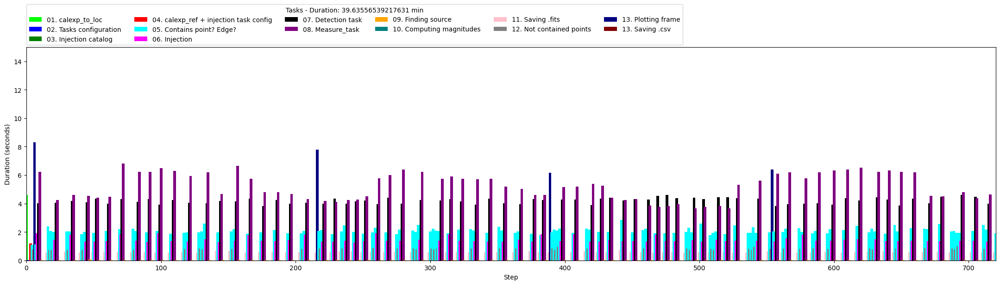

In [61]:

df = pd.read_csv(f'{main_path}time_analysis-points{n_points}-HTMlevel{level}.csv')
duration = df["duration"].values
task = df["task"].values
# duration = [j - i for i, j in zip(times[:-1], times[1:])]
colors = ['lime', 'blue', 'green', 'red', 'cyan', 'magenta',  'black', 'purple', 'orange', 
          'teal', 'pink', 'gray', 'navy', 'maroon', 'olive', 'silver', 'aqua',
          'coral', 'turquoise', 'salmon', 'orchid',  'gold', 'plum','yellow', 'brown']
col_task = {i:j for i,j in zip(sorted(set(task)), colors[:len(task)])}
taskcolors=[col_task[i] for i in task]
plt.figure(figsize=(27,6))
plt.xlim(0,720)
plt.ylim(0,15)
plt.bar(range(len(duration)), duration, color=taskcolors, width=2)
for ta in sorted(col_task):
    plt.bar(0, 0, color=col_task[ta], label=ta)  # Barra invisible para crear la leyenda
plt.xlabel("Step")
plt.ylabel("Duration (seconds)")
plt.legend(title=f'Tasks - Duration: {np.sum(duration)/60} min',ncol=6, loc=(0, 1.01))
# data = np.column_stack((np.array([0]+duration, dtype=float), np.array(task, dtype=str)))
# np.savetxt('time_analysis.csv', data, delimiter=',', header="duration,task", comments='', fmt='%s')
plt.savefig(f'{main_path}time_analysis-points{n_points}-HTMlevel{level}.png', bbox_inches='tight')

In [46]:
for i in data:
    print(i, len(data[i]))

mags_measured0 1673
mags_injected0 1673
mags_errors0 1673
fluxs0 1673
flux_errs0 1673
mags_measured1 1673
mags_injected1 1673
mags_errors1 1673
fluxs1 1673
flux_errs1 1673
mags_measured2 1673
mags_injected2 1673
mags_errors2 1673
fluxs2 1673
flux_errs2 1673
mags_measured3 1673
mags_injected3 1673
mags_errors3 1673
fluxs3 1673
flux_errs3 1673
detector 1673
visit 1673
mjds 1673
inj_points 1674


In [106]:
exp_midpoints, visits, detectors, datasetRefs_list = calexp_from_loc(ra, dec)
df = pd.DataFrame({"expMid": exp_midpoints, "visitis": visits, "detectors":detectors})
print(df["expMid"].value_counts())
df.drop_duplicates(subset="expMid")
df[df["expMid"]>61300]

expMid
61394.201148    2
61332.358212    2
60338.168152    2
60269.159254    2
60242.252461    2
               ..
60549.271243    1
60338.140008    1
60309.253797    1
60309.237739    1
60632.256395    1
Name: count, Length: 116, dtype: int64


,expMid,visitis,detectors
120,61332.358212,1196500,169
121,61332.358212,1196500,170
122,61334.231609,1197823,163
123,61334.232058,1197824,158
124,61334.246981,1197851,35
125,61334.249786,1197857,182
126,61360.191026,1209140,47
127,61364.195924,1211957,173
128,61364.195924,1211957,180
129,61364.196377,1211958,11


array([        nan, 21.35812916, 21.31758361, 21.35913901, 21.33248977,
       21.28869127, 21.30750456, 21.29714082, 21.31422214, 21.27414051,
       20.68853194, 20.69538176,         nan,         nan, 20.7465782 ,
       21.39278599,         nan])

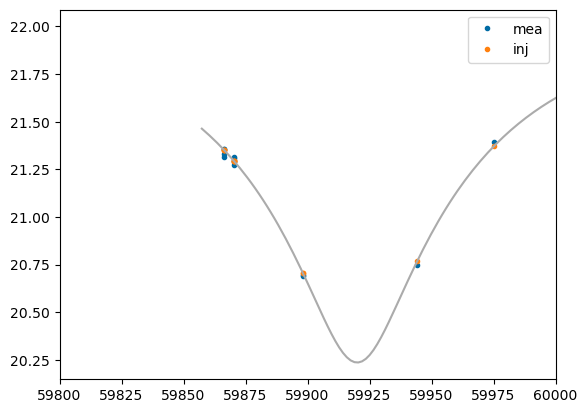

In [45]:
d=0
plt.plot(exp_midpoints[:len(mjds)], mags_measured[:,d][:len(mjds)], ".", label="mea")
plt.plot(exp_midpoints[:len(mjds)], mags_injected[:,d][:len(mjds)], ".", label="inj")
# plt.plot(exp_midpoints[:len(mjds)], var_mags[d][:len(mjds)], ".-", label="var_mag")
plt.plot(t, uLens_ideal[d])
plt.xlim(59800,60000)
plt.legend()
mags_measured[:,d][:len(mjds)]

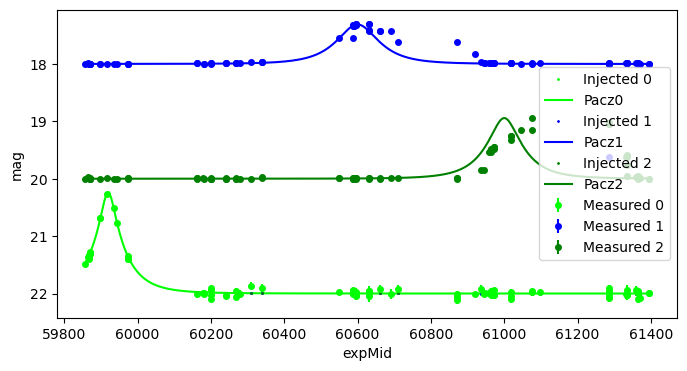

In [21]:
# Plot all light curves
fig, ax1 = plt.subplots(1, 1, figsize=(8, 4))
for j, (rai, deci) in enumerate(locs):
    ax1.plot(mjds, mags_injected[:,j][:len(mjds)], '.', label=f"Injected {j}",color=colors[j], markersize=2)
    ax1.errorbar(mjds, mags_measured[:,j][:len(mjds)], yerr=mags_errors[:,j][:len(mjds)], color=colors[j], fmt='o', label=f"Measured {j}", markersize=4)
    ax1.plot(t_aux, uLens_ideal[j][:len(t_aux)], color=colors[j], label = f"Pacz{j}")
ax1.set_xlabel('expMid')
ax1.set_ylabel('mag')

ax1.invert_yaxis()
ax1.legend(loc=())



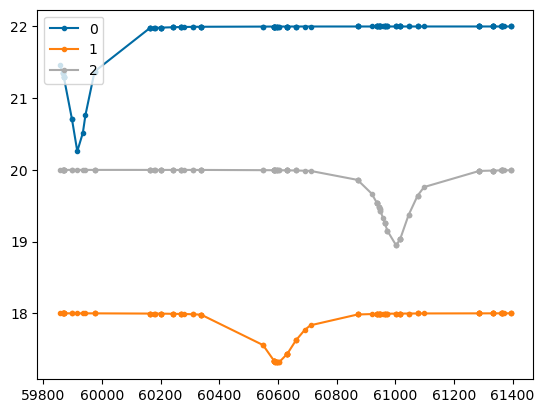

In [27]:
inject_tables
for f in [0,1,2]:
    plt.plot(inject_tables[f]["exp_midpoint"], inject_tables[f]["mag"], ".-", label=f)
plt.legend()

In [5]:
duration = np.array(times[1:])-np.array(times[:-1])
# task =  pd.read_csv(f'time_analysis-points{len(locs)}.csv')["task"].values[:]
df = pd.DataFrame({'duration': duration,'task': task[1:]})
df.to_csv(f'time_analysis-points{len(locs)}-wo.csv', index=False)
with imageio.get_writer(f'{main_path}uLens-points3-wo.gif', mode='I', duration=500) as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)

/tmp/ipykernel_7449/3019293611.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)


In [10]:
np.mean(points)

1.1123595505617978

In [46]:
# locs=np.vstack([locs,PixToSky(0,0,injected_exposure)])
locs=np.vstack([locs,PixToSky(3600,3200,injected_exposure)])

# locs.conctat(locs,PixToSky(4000,4000,injected_exposure))
# PixToSky(4000,4000,injected_exposure)

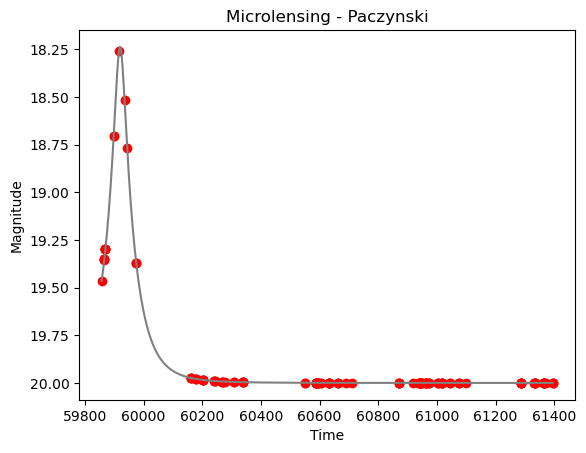

NameError: name 'm_t' is not defined

In [10]:
var_mags = uLens_Pacz(exp_midpoints, t_0[0], t_E[0], u_0[0], 20, plot=True) 
t = np.linspace(min(exp_midpoints), max(exp_midpoints), 1000)
# uLens_P = uLens_Pacz(t, t_0, t_E, u_0, m_t, plot=False) 

In [ ]:
# Memory analysis

colormap = plt.cm.get_cmap('Greens', 18)
colores = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple', 'orange', 'brown', 'teal', 'pink', 'gray', 'gold', 'lime', 'navy', 'maroon']
plt.figure(figsize=(20,20))
i=0
for var in Memory[-1]:
    Mem = []
    ok = False
    for mem in Memory:
        for m in mem:
            if var[0] == m[0]:
                ok = True
                Mem.append(m[1])
        if ok == False:
            Mem.append(0)
    if (len(set(Mem)) > 3):
        # color = colormap(i)
        color = colores[i]
        plt.plot(Time, Mem, ".-", color=color, label = var[0])
        i+=1
    elif Mem[-1]>0.0001:
        print(var[0])
        print(Mem[-1])

plt.legend(loc=(1,0))


### Calexps analysis

In [ ]:
calexp, psf, phot_calib, wcs, xy = get_calexp_data(calexp_data)
print(calexp.mask)

In [ ]:
fig, ax = plt.subplots()
display = afwDisplay.Display(frame=fig)
display.scale('asinh', 'zscale')
display.setMaskTransparency(50)
display.setMaskPlaneColor('CROSSTALK', 'green')
display.mtv(calexp)
plt.show()


### Ordenado en con sub-funciones - Chequear buen funcionamiento

In [ ]:
ra = 62.149
dec = -35.796
t_0 = 59920  # Time of closest approach
t_E = 90  # Einstein timescale
u_0 = 0.2  # Minimum impact parameter
m_t = 25       # i : 23.41 , 26.4

exp_midpoints, visits, detectors, datasetRefs_list = calexp_from_loc(ra, dec, level=11)
measure_task, char_image_task, detect_task, deblend_task, schema, tab = initialize_tasks()

for m_t in range(16,17):
    mags_measured = []
    mags_injected = []
    mags_errors = []
    detector = []
    visit = []
    fluxs = []
    flux_errs = []
    dataids = []
    mjds = []
    filenames = []
    model = {"name":"Pacz", "t_0":t_0, "t_E":t_E, "u_0":u_0, "m_t":m_t}

    var_mags, uLens, t = generate_light_curves(exp_midpoints, model)
    # var_mags1, uLens1, t1 = generate_light_curves(exp_midpoints, model1)
    inject_table = create_catalog(var_mags, exp_midpoints, visits, detectors)
    
    start_ind = 0
    finish_ind = 3
    imgs=[]

    calexp_ref, psf_ref, phot_calib_ref, wcs_ref, xy_ref= get_calexp_data(datasetRefs_list[start_ind])
    inject_task=Injection()
    for i, (calexp_data, inject_data) in enumerate(zip(datasetRefs_list[start_ind:finish_ind], inject_table[start_ind:finish_ind])):
        print(f"{'-'*15} Injection   {i+1}/{finish_ind-start_ind} {'-'*15}")

        # Inject
        dataid, mjd, mag_inj, injected_exposure = inject(calexp_data, inject_data, inject_task, fits=f"calexp{i}-m{m_t}.fits")
        if (dataid, mjd, mag_inj, injected_exposure) == (None, None, None, None):
            continue
        # injected_exposure, a,b,c,d= get_calexp_data(calexp_data) → To test without injection

        # Detectar, deblend (hijos/padres) y medir fuentes
        sources = detect_sources(tab, injected_exposure, detect_task, deblend=deblend_task, measure=measure_task)
        flux, flux_err = source_photometry(sources, ra, dec, injected_exposure, delta=0.0005)
        if flux == None:
            continue
        mag, mag_err = toMag(injected_exposure, flux, flux_err)

        mjds.append(mjd)
        mags_measured.append(mag)
        mags_errors.append(mag_err)
        fluxs.append(flux)
        flux_errs.append(flux_err)
        dataids.append(dataid)
        mags_injected.append(mag_inj)
        detector.append(dataid["detector"])
        visit.append(dataid["visit"])

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))
        calexp_plot(injected_exposure, f"mjd = {mjd} - m = {mag_inj}", fig, ax2, warp=calexp_ref)
        lc_plot(mjds, mags_measured, mags_errors, mags_injected, t, uLens, model, ax=ax1)
        filename = f'frame_{i}.png'
        plt.tight_layout()
        plt.savefig(filename, bbox_inches='tight')
        filenames.append(filename)
        plt.close()
        
        print(f"MJD: {mjd} | Injeted: {mag_inj} | Measured: {mag} | Error: {mag_err}")
        print(f"                            Flux: Measured: {flux} | Error: {flux_err}")
    
        del injected_exposure

    data = {
        'mags_measured': mags_measured,
        'mags_injected': mags_injected,
        'mags_errors': mags_errors,
        'fluxs': fluxs,
        'flux_errs': flux_errs,
        'detector': detector,
        'visit': visit,
        'mjds': mjds}
    
    df = pd.DataFrame(data)
    df.to_csv(f'uLens-m_t{m_t}.csv', index=False)
    with imageio.get_writer(f'uLens-m_t{m_t}.gif', mode='I', duration=500) as writer:
        for filename in filenames:
            image = imageio.imread(filename)
            writer.append_data(image)



### Función entera: injección y extracción de una curva de luz cumpleta

In [ ]:
# Función entera: injeccion + extraccion de una fuente / 4.78
ra = 62.149
dec = -30.796

band = "i"

t_0 = 59920  # Time of closest approach
t_E = 90  # Einstein timescale
u_0 = 0.2  # Minimum impact parameter
m_t = 25       # i : 23.41 , 26.4

t0 = time.time(); Time=[]
for m_t in range(20,21):
    print(f"----------------- {m_t} -----------------------")
    model = {"name":"Pacz", "t_0":t_0, "t_E":t_E, "u_0":u_0, "m_t":m_t}
    data = inj_ext_lc(band, ra, dec, model, start=0, finish=None, htm_lvl=20, csv=f"uLens-base{m_t}.csv", frames=True, gif=f"uLens-base{m_t}.gif", fits=True)
    t1=time.time()-t0
    Time.append(t1)

### Collection of calexps analysis

In [77]:
from shapely.ops import unary_union, Polygon
import numpy as np

# Función para graficar los polígonos y puntos
def plot_common_area_and_sources(RA, DEC, ra_point, dec_point, datasetRefs_list, start=0, finish=3, alpha=0.25):

    # Crear los polígonos a partir de los vértices de RA y DEC
    polygons = [Polygon(zip(ra_corners, dec_corners)) for ra_corners, dec_corners in zip(RA, DEC)]
    point = Point(ra_point, dec_point)
    indexs = []
    common_area = polygons[0]
    for j, poly in enumerate(polygons[1:]):
        if poly.contains(point):
            common_area = common_area.intersection(poly)
            indexs.append(j)
            
    fig, ax = plt.subplots()
    for polygon in polygons:
        x, y = polygon.exterior.xy
        ax.plot(x, y, 'b-', alpha=0.5, linewidth=2)
    
    # Graficar el área común
    if common_area.is_empty:
        print("No common area found.")
    else:
        x, y = common_area.exterior.xy
        ax.plot(x, y, 'r-', alpha=0.5, linewidth=2, label='Common Area')

   # Graficar las fuentes
    for i in range(start, finish):
        calexp, psf, phot_calib, wcs, xy= get_calexp_data(datasetRefs_list[i])
        sources = detect_sources(tab, calexp, deblend=deblend_task, measure=measure_task)
        for source in sources:
            ra = source["coord_ra"] / np.pi * 180
            dec = source["coord_dec"] / np.pi * 180
            if common_area.contains(Point(ra,dec)):
                ax.plot(ra, dec, 'g.', markersize=2, alpha=alpha, label='Sources')

    ax.set_xlabel('RA (degrees)')
    ax.set_ylabel('DEC (degrees)')
    plt.title('Common Area and Detected Sources')
    plt.show()
    return indexs

from shapely.geometry import Point

def plot_polygons_containing_point(RA, DEC, ra_point, dec_point, datasetRefs_list, start=0, finish=3, alpha=0.25):

    # Crear los polígonos a partir de los vértices de RA y DEC
    polygons = [Polygon(zip(ra_corners, dec_corners)) for ra_corners, dec_corners in zip(RA, DEC)]
    
    # Crear el punto específico
    point = Point(ra_point, dec_point)
    
    fig, ax = plt.subplots()
    indexs = []
    # Graficar solo los polígonos que contienen el punto
    for j,polygon in enumerate(polygons):
        if polygon.contains(point):
            indexs.append(j)
            x, y = polygon.exterior.xy
            ax.plot(x, y, 'b-', alpha=0.5, linewidth=2)
    
    # Graficar el punto específico
    ax.plot(ra_point, dec_point, 'ro', markersize=5, label='Specific Point')
    print(f"{j} calexps contains (ra,dec)=({ra_point},{dec_point})")
    ax.set_xlabel('RA (degrees)')
    ax.set_ylabel('DEC (degrees)')
    plt.title('Polygons Containing Specific Point and Detected Sources')
    plt.legend()
    plt.show()
    return indexs


import itertools
from shapely.geometry import Polygon
from shapely.ops import unary_union
import matplotlib.pyplot as plt

def find_and_plot_overlapping_regions(RA, DEC, min_overlap=5):
    # Crear los polígonos a partir de los vértices de RA y DEC
    polygons = [Polygon(zip(ra, dec)) for ra, dec in zip(RA, DEC)]
    
    overlapping_regions = []

    # Generar todas las combinaciones de polígonos de tamaño min_overlap
    combinations = itertools.combinations(polygons, min_overlap)

    for combo in combinations:
        # Encontrar la intersección de la combinación de polígonos
        intersection = combo[0]
        for poly in combo[1:]:
            intersection = intersection.intersection(poly)
            if intersection.is_empty:
                break
        
        if not intersection.is_empty:
            overlapping_regions.append(intersection)

    # Unir todas las regiones de superposición en una sola geometría
    if overlapping_regions:
        result = unary_union(overlapping_regions)
    else:
        result = None

    # Plotting the polygons and overlapping regions
    fig, ax = plt.subplots()
    for polygon in polygons:
        x, y = polygon.exterior.xy
        ax.plot(x, y, 'b-', alpha=0.5, linewidth=2)

    if result and not result.is_empty:
        if result.geom_type == 'Polygon':
            x, y = result.exterior.xy
            ax.fill(x, y, 'y', alpha=0.2, edgecolor='y', linewidth=2, label='Overlapping Region')
        elif result.geom_type == 'MultiPolygon':
            for poly in result:
                x, y = poly.exterior.xy
                ax.fill(x, y, 'y', alpha=0.2, edgecolor='y', linewidth=2, label='Overlapping Region')

    ax.set_xlabel('RA (degrees)')
    ax.set_ylabel('DEC (degrees)')
    plt.title(f'Regions with at least {min_overlap} overlapping polygons')
    plt.legend()
    plt.show()

import itertools
from shapely.geometry import Polygon
from shapely.ops import unary_union
import matplotlib.pyplot as plt

def overlapping_regions(RA, DEC, min_overlap=5):
    # Crear los polígonos a partir de los vértices de RA y DEC
    polygons = [Polygon(zip(ra, dec)) for ra, dec in zip(RA, DEC)]
    
    overlapping_regions = []

    # Generar todas las combinaciones de polígonos de tamaño min_overlap
    combinations = itertools.combinations(polygons, min_overlap)

    for combo in combinations:
        # Encontrar la intersección de la combinación de polígonos
        intersection = combo[0]
        for poly in combo[1:]:
            intersection = intersection.intersection(poly)
            if intersection.is_empty:
                break
        
        if not intersection.is_empty:
            overlapping_regions.append(intersection)

    # Unir todas las regiones de superposición en una sola geometría
    if overlapping_regions:
        result = unary_union(overlapping_regions)
    else:
        result = None

    # Plotting the polygons and overlapping regions
    fig, ax = plt.subplots()
    for polygon in polygons:
        x, y = polygon.exterior.xy
        ax.plot(x, y, 'b-', alpha=0.5, linewidth=2)

    area = 0
    if result and not result.is_empty:
        if result.geom_type == 'Polygon':
            x, y = result.exterior.xy
            ax.fill(x, y, 'y', alpha=0.2, edgecolor='y', linewidth=2, label='Overlapping Region')
            area = result.area
        elif result.geom_type == 'MultiPolygon':
            for poly in result:
                x, y = poly.exterior.xy
                ax.fill(x, y, 'y', alpha=0.2, edgecolor='y', linewidth=2, label='Overlapping Region')
                area += poly.area

    ax.set_xlabel('RA (degrees)')
    ax.set_ylabel('DEC (degrees)')
    plt.title(f'Regions with at least {min_overlap} overlapping polygons')
    plt.legend()
    plt.show()

    return area

In [ ]:
import itertools
from shapely.geometry import Polygon
from shapely.ops import unary_union
import matplotlib.pyplot as plt
ra = 62.149
dec = -35.796
pixelization = lsst.sphgeom.HtmPixelization(level)
htm_id = pixelization.index(lsst.sphgeom.UnitVector3d(lsst.sphgeom.LonLat.fromDegrees(ra, dec)))
circle = pixelization.triangle(htm_id).getBoundingCircle()
# scale = circle.getOpeningAngle().asDegrees()*3600.
# level = pixelization.getLevel()
# print("{:<20}".format(f'({ra}, {dec})') + f'HTM ID={htm_id} at level={level} is bounded by a circle of radius ~{scale:0.2f} arcsec.')

# polygons = [Polygon(zip(ra_corners, dec_corners)) for ra_corners, dec_corners in zip(RA, DEC)]

# fig, ax = plt.subplots()
# for polygon in polygons:
#     x, y = polygon.exterior.xy
#     ax.plot(x, y, 'b-', alpha=0.5, linewidth=2)

# print(pixelization.triangle(htm_id).getVertices())
# print(lsst.sphgeom.UnitVector3d(lsst.sphgeom.LonLat.fromDegrees(ra, dec)))
# (pixelization.triangle(htm_id).getVertices() [0]- lsst.sphgeom.UnitVector3d(lsst.sphgeom.LonLat.fromDegrees(ra, dec))).asLonLat()

# a = sphgeom.LonLat.latitudeOf(lsst.sphgeom.UnitVector3d(lsst.sphgeom.LonLat.fromDegrees(ra, dec))).asDegrees()
uni=circle.getCenter()
ra_c, dec_c = sphgeom.LonLat.longitudeOf(uni).asDegrees(), sphgeom.LonLat.latitudeOf(uni).asDegrees()
r = circle.getOpeningAngle().asDegrees()
fig, ax = plt.subplots() #subplot_kw={'projection': 'mollweide'})
circ = plt.Circle((ra_c,dec_c), r, color="red")
ax.add_patch(circ)


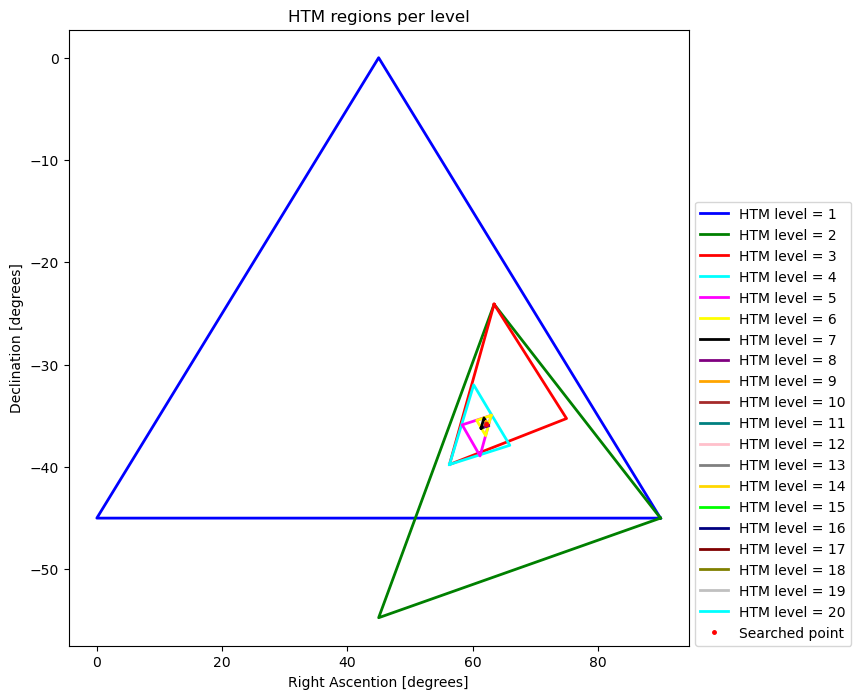

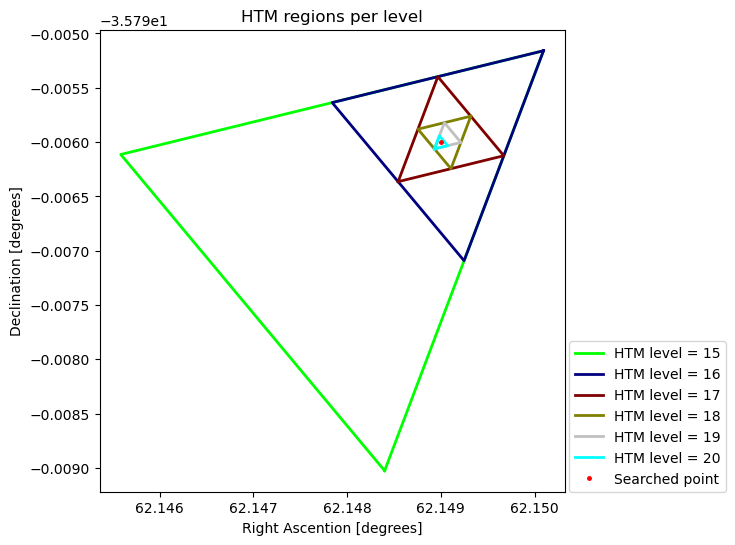

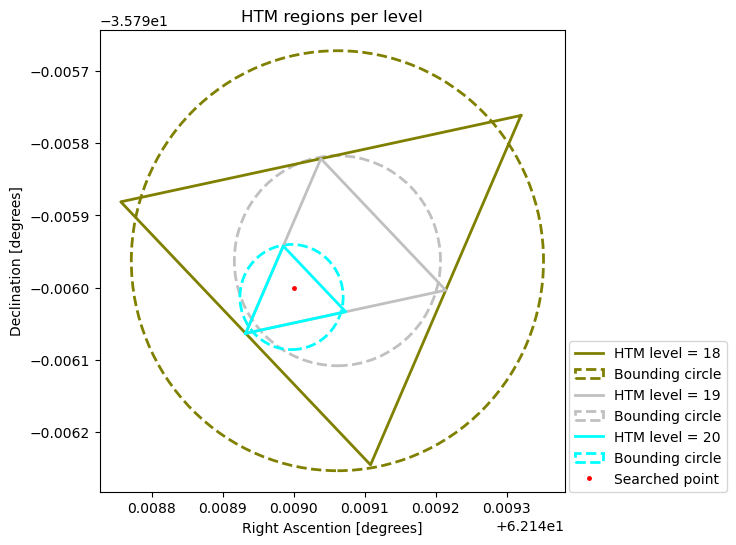

In [10]:
import itertools
from shapely.geometry import Polygon
from shapely.ops import unary_union
def plot_htm(level, ra, dec, color=None, circle=False, calexp=False, lwT=2, lwC=2, lwc=1):
    pixelization = lsst.sphgeom.HtmPixelization(level)
    htm_id = pixelization.index(lsst.sphgeom.UnitVector3d(lsst.sphgeom.LonLat.fromDegrees(ra, dec)))
    circle = pixelization.triangle(htm_id).getBoundingCircle()
    tri_ra_dec=[]
    for uni in pixelization.triangle(htm_id).getVertices():
        tri_ra_dec.append([sphgeom.LonLat.longitudeOf(uni).asDegrees(),sphgeom.LonLat.latitudeOf(uni).asDegrees()])
    poli =Polygon(tri_ra_dec)
    x, y = poli.exterior.xy
    plt.plot(x, y,  alpha=1, color=color, linewidth=lwT, label = f"HTM level = {level}")
    ret = []
    if circle:
        uni=circle.getCenter()
        ra_c, dec_c = sphgeom.LonLat.longitudeOf(uni).asDegrees(), sphgeom.LonLat.latitudeOf(uni).asDegrees()
        r = circle.getOpeningAngle().asDegrees()
        circ = plt.Circle((ra_c,dec_c), r, linewidth=lwC, linestyle="--", color=colors[lvl-1],fill=False, label="Bounding circle")
        ret.append(circ)
    if calexp:
        RA=[]; DEC=[]
        datasetRefs = butler.registry.queryDatasets("calexp", htm20=htm_id,where=f"band = '{band}'")   
        for dataRef in list(datasetRefs):
            ref_dataId = dataRef.dataId
            cal = butler.get('calexp', dataId=ref_dataId)
            ra_corners, dec_corners = get_calexp_corners(cal)
            RA.append(ra_corners); DEC.append(dec_corners)
        polygons = [Polygon(zip(ra, dec)) for ra, dec in zip(RA, DEC)]
        for polygon in polygons:
            x, y = polygon.exterior.xy
            ax.plot(x, y, color, alpha=0.25, linewidth=lwc)
        ret.append(datasetRefs)
    return ret

ra = 62.149
dec = -35.796

colors = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple', 'orange', 'brown',
          'teal', 'pink', 'gray', 'gold', 'lime', 'navy', 'maroon', 'olive', 'silver', 'aqua',
          'coral', 'turquoise', 'salmon', 'orchid', 'plum']
plt.figure(figsize=(8,8))
for lvl in range(1,21):
    plot_htm(lvl, ra, dec, colors[lvl-1])

plt.plot(ra, dec, ".r", markersize=5, label="Searched point")
plt.title("HTM regions per level")
plt.xlabel("Right Ascention [degrees]")
plt.ylabel("Declination [degrees]")
plt.legend(loc=(1.01,0))
plt.savefig("HTM_1to20.png")

plt.figure(figsize=(6,6))
for lvl in range(15,21):
    plot_htm(lvl, ra, dec, colors[lvl-1])

plt.plot(ra, dec, ".r", markersize=5, label="Searched point")
plt.title("HTM regions per level")
plt.xlabel("Right Ascention [degrees]")
plt.ylabel("Declination [degrees]")
plt.legend(loc=(1.01,0))
plt.savefig("HTM_15to20.png")

fig, ax = plt.subplots(figsize=(6,6))
for lvl in range(18,21):
    circ = plot_htm(lvl, ra, dec, colors[lvl-1], circle=True)[0]
    ax.add_patch(circ)
ax.plot(ra, dec, ".r", markersize=5, label="Searched point")
plt.title("HTM regions per level")
plt.xlabel("Right Ascention [degrees]")
plt.ylabel("Declination [degrees]")
plt.legend(loc=(1.01,0))
plt.savefig("HTM_BoundCircles_18to20.png")


# fig, ax = plt.subplots() #subplot_kw={'projection': 'mollweide'})
# circ = plt.Circle((ra_c,dec_c), r, color="red")
# ax.add_patch(circ)

In [ ]:
import itertools
from shapely.geometry import Polygon
from shapely.ops import unary_union
import matplotlib.pyplot as plt
import lsst.sphgeom  # Asegúrate de tener el paquete adecuado

def plot_htm_and_points(level, ra_dec_list, color=None, circle=False, calexp=False, lwT=2, lwC=2, lwc=1):
    # Obtener el primer punto de la lista para generar el triángulo HTM
    ra, dec = ra_dec_list[0]
    
    # Crear el pixelizador HTM para el nivel dado
    pixelization = lsst.sphgeom.HtmPixelization(level)
    
    # Obtener el ID HTM del primer punto
    htm_id = pixelization.index(lsst.sphgeom.UnitVector3d(lsst.sphgeom.LonLat.fromDegrees(ra, dec)))
    
    # Obtener los vértices del triángulo HTM
    tri_ra_dec = []
    for uni in pixelization.triangle(htm_id).getVertices():
        tri_ra_dec.append([lsst.sphgeom.LonLat.longitudeOf(uni).asDegrees(), lsst.sphgeom.LonLat.latitudeOf(uni).asDegrees()])
    
    # Crear el polígono del triángulo HTM
    poli = Polygon(tri_ra_dec)
    x, y = poli.exterior.xy
    plt.plot(x, y, alpha=1, color=color, linewidth=lwT, label=f"HTM level = {level}")
    
    ret = []
    
    # Dibujar el círculo delimitador si se solicita
    if circle:
        bounding_circle = pixelization.triangle(htm_id).getBoundingCircle()
        center = bounding_circle.getCenter()
        ra_c, dec_c = lsst.sphgeom.LonLat.longitudeOf(center).asDegrees(), lsst.sphgeom.LonLat.latitudeOf(center).asDegrees()
        radius = bounding_circle.getOpeningAngle().asDegrees()
        circ = plt.Circle((ra_c, dec_c), radius, linewidth=lwC, linestyle="--", color=color, fill=False, label="Bounding circle")
        ret.append(circ)
    
    # Ploteo de los puntos (ra, dec) de la lista
    ra_points, dec_points = zip(*ra_dec_list)
    plt.plot(ra_points, dec_points, ".r", markersize=5, label="Input points")
    
    # Retornar las figuras adicionales si es necesario
    return ret

# Lista de puntos (ra, dec) para ploteo
ra_dec_list = [(62.149, -35.796), (62.1, -35.80), (62.13, -35.76), (62.17, -35.776)]  # Ejemplo de varios puntos

# Colores por nivel de HTM
colors = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple', 'orange', 'brown',
          'teal', 'pink', 'gray', 'gold', 'lime', 'navy', 'maroon', 'olive', 'silver', 'aqua',
          'coral', 'turquoise', 'salmon', 'orchid', 'plum']

# Ploteo para un nivel específico, por ejemplo, nivel 10
level = 10

# Crear la figura
plt.figure(figsize=(8,8))

# Llamada a la función para plotear el triángulo HTM y los puntos
plot_htm_and_points(level, ra_dec_list, color=colors[level-1])

# Configurar etiquetas y leyenda
plt.title(f"HTM triangle - Level {level}")
plt.xlabel("Right Ascension [degrees]")
plt.ylabel("Declination [degrees]")
plt.legend(loc="best")

# Mostrar el gráfico
plt.show()


In [ ]:
#execution started 16:12:12
for lvl in range(10,21):
    fig, ax = plt.subplots(figsize=(10,10))
    plot_htm(lvl, ra, dec, colors[lvl-1], circle=True, calexp=True)
    ax.plot(ra, dec, ".r", markersize=5, label="Searched point")
    plt.title(f"HTM level {lvl}")
    plt.xlabel("Right Ascention [degrees]")
    plt.ylabel("Declination [degrees]")
    plt.legend(loc=(1.01,0))

In [19]:
from shapely.geometry import Polygon, Point
ra = 62.149
dec = -35.796
band = "r"
# data = inj_ext_loc(band, ra, dec, model, start=0, finish=3, htm_lvl=18)
RA={}; DEC={}; true_cal={}
# start = 0 ;finish = 139
Levels = np.arange(20,3,-1)
N_calexps={}
from tqdm import tqdm
for lvl in Levels:
    with_point=[]; R = []; D = []
    print("Pixalization ...")
    pixelization = lsst.sphgeom.HtmPixelization(lvl)
    print("HTM id ...")
    htm_id = pixelization.index(lsst.sphgeom.UnitVector3d(lsst.sphgeom.LonLat.fromDegrees(ra, dec)))
    print("Collecting calexps ...")
    datasetRefs = butler.registry.queryDatasets("calexp", htm20=htm_id,where=f"band = '{band}'")   
    n=len(list(datasetRefs))
    # finish = len(datasetRefs_list) if finish==None else finish
    print("Measuring corners ...")

    for dataRef in tqdm(list(datasetRefs), desc=f"Level {lvl}"):
        cal, psf, phot_calib, wcs, xy= get_calexp_data(dataRef)
        ra_corners, dec_corners = get_calexp_corners(cal)
        R.append(ra_corners); D.append(dec_corners)
        if Polygon(zip(ra_corners, dec_corners)).contains(Point(ra, dec)):
            with_point.append(dataRef.dataId)
        else:
            with_point.append(0)
    RA[lvl]=R
    DEC[lvl]=D
    true_cal[lvl]=with_point
    N_calexps[lvl]=n
    
 
# plot_common_area_and_sources(RA, DEC,ra, dec, datasetRefs_list, start,finish)
# plot_polygons_containing_point(RA, DEC, ra, dec, datasetRefs_list, start=0, finish=3, alpha=0.25)
# x = []; y = []
# from tqdm import tqdm
# for i in tqdm(range(5,105,10)):
#     area = find_and_plot_overlapping_regions(RA, DEC, min_overlap=i)
#     x.append(i)
#     y.append(area)

Pixalization ...
HTM id ...
Measuring corners ...


Level 20: 100%|██████████| 139/139 [04:09<00:00,  1.80s/it]


Pixalization ...
HTM id ...
Measuring corners ...


Level 19: 100%|██████████| 139/139 [03:58<00:00,  1.71s/it]


Pixalization ...
HTM id ...
Measuring corners ...


Level 18: 100%|██████████| 140/140 [03:53<00:00,  1.66s/it]


Pixalization ...
HTM id ...
Measuring corners ...


Level 17: 100%|██████████| 140/140 [03:52<00:00,  1.66s/it]


Pixalization ...
HTM id ...
Measuring corners ...


Level 16: 100%|██████████| 140/140 [03:46<00:00,  1.62s/it]


Pixalization ...
HTM id ...
Measuring corners ...


Level 15: 100%|██████████| 140/140 [03:49<00:00,  1.64s/it]


Pixalization ...
HTM id ...
Measuring corners ...


Level 14: 100%|██████████| 149/149 [04:05<00:00,  1.65s/it]


Pixalization ...
HTM id ...
Measuring corners ...


Level 13: 100%|██████████| 154/154 [04:15<00:00,  1.66s/it]


Pixalization ...
HTM id ...
Measuring corners ...


Level 12: 100%|██████████| 173/173 [04:53<00:00,  1.70s/it]


Pixalization ...
HTM id ...
Measuring corners ...


Level 11: 100%|██████████| 200/200 [05:39<00:00,  1.70s/it]


Pixalization ...
HTM id ...
Measuring corners ...


Level 10: 100%|██████████| 284/284 [08:11<00:00,  1.73s/it]


Pixalization ...
HTM id ...
Measuring corners ...


Level 9: 100%|██████████| 777/777 [19:26<00:00,  1.50s/it]


Pixalization ...
HTM id ...
Measuring corners ...


Level 8: 100%|██████████| 1811/1811 [44:35<00:00,  1.48s/it]


Pixalization ...
HTM id ...
Measuring corners ...


Level 7: 100%|██████████| 5494/5494 [2:08:46<00:00,  1.41s/it]  


Pixalization ...
HTM id ...
Measuring corners ...


Level 6: 100%|██████████| 14312/14312 [5:43:19<00:00,  1.44s/it]  


Pixalization ...
HTM id ...
Measuring corners ...


Level 5:   0%|          | 93/42342 [02:22<19:45:00,  1.68s/it]

Level 5:   0%|          | 93/42342 [02:24<18:13:44,  1.55s/it]


KeyboardInterrupt: 

In [59]:
[item for item in true_cal[i] if type(item)!= int]

[{instrument: 'LSSTCam-imSim', detector: 48, visit: 271299, band: 'r', physical_filter: 'r_sim_1.4', visit_system: 1},
 {instrument: 'LSSTCam-imSim', detector: 48, visit: 271299, band: 'r', physical_filter: 'r_sim_1.4', visit_system: 1},
 {instrument: 'LSSTCam-imSim', detector: 160, visit: 655441, band: 'r', physical_filter: 'r_sim_1.4', visit_system: 1},
 {instrument: 'LSSTCam-imSim', detector: 160, visit: 655441, band: 'r', physical_filter: 'r_sim_1.4', visit_system: 1},
 {instrument: 'LSSTCam-imSim', detector: 92, visit: 638962, band: 'r', physical_filter: 'r_sim_1.4', visit_system: 1},
 {instrument: 'LSSTCam-imSim', detector: 92, visit: 638962, band: 'r', physical_filter: 'r_sim_1.4', visit_system: 1},
 {instrument: 'LSSTCam-imSim', detector: 57, visit: 212807, band: 'r', physical_filter: 'r_sim_1.4', visit_system: 1},
 {instrument: 'LSSTCam-imSim', detector: 57, visit: 212807, band: 'r', physical_filter: 'r_sim_1.4', visit_system: 1},
 {instrument: 'LSSTCam-imSim', detector: 137, 

In [61]:
net_calexp=[]
for i in RA.keys():
    # with open(f'true_cal{i}.txt', 'w') as file:
    #     for item in true_cal[i]:
    #         file.write(f"{item}\n"
    net_calexp.append(len([item for item in true_cal[i] if type(item)!= int]))

In [62]:
with open(f'net_calexp.txt', 'w') as file:
    for item in net_calexp:
        file.write(f"{item}\n")

In [63]:
RA.keys()

dict_keys([20, 19, 18, 17, 16, 15, 14, 13, 12, 11, 10, 9, 8, 7, 6])

In [ ]:
import pandas as pd

for lvl in range(6,21):
    data = {
        'RA': ['R1', 'R2', 'R3'],
        'DEC': ['D1', 'D2', 'D3'],
        'true_cal': ['with_point', 'with_point', 'with_point'],
        'N_calexps': ['n1', 'n2', 'n3']
    }
    
    # Crear el DataFrame
    df = pd.DataFrame(data)
    df.to_csv(f'data_level{lvl}.csv', index=False)


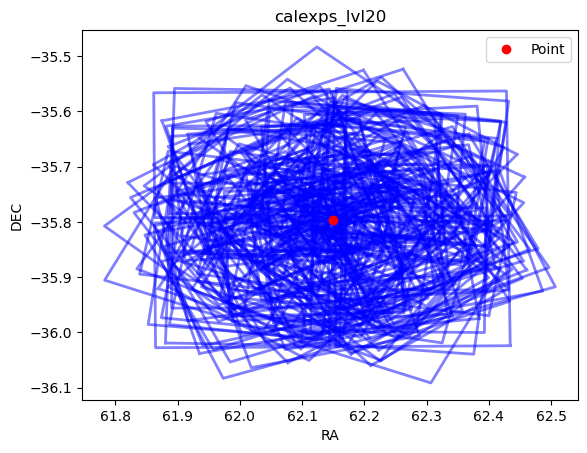

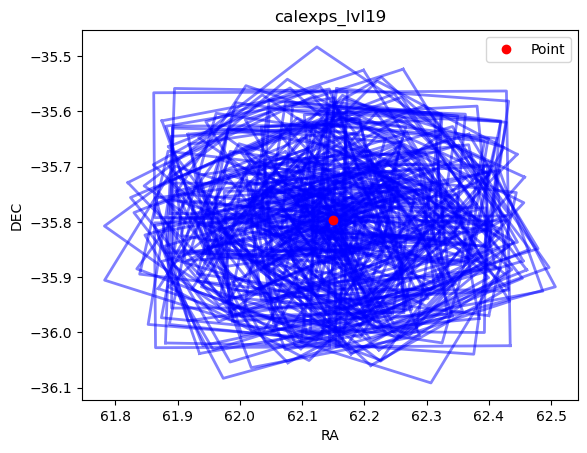

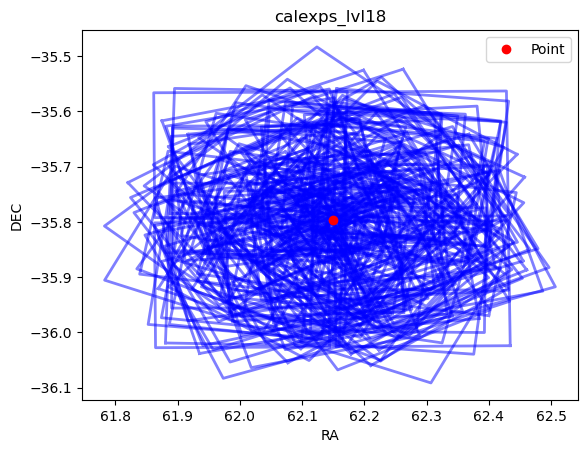

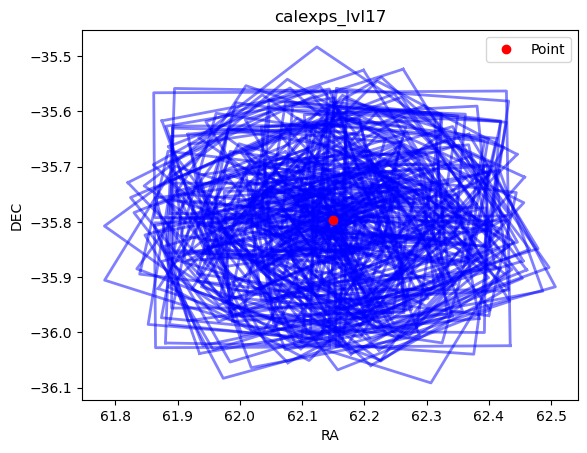

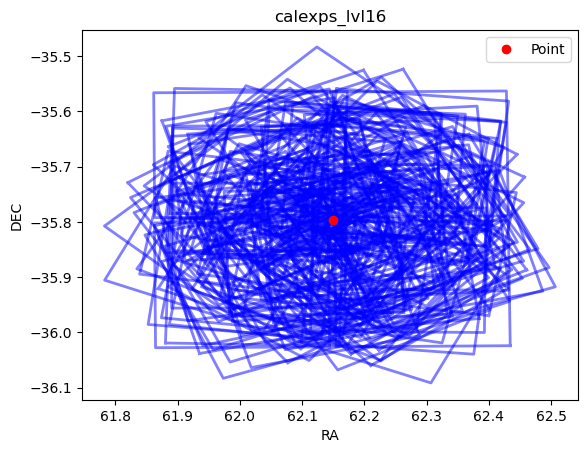

...

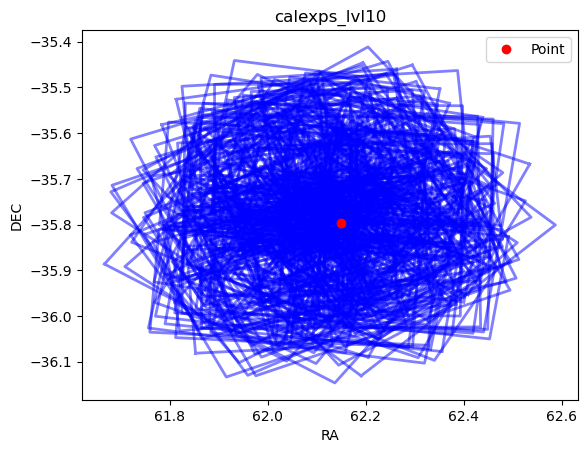

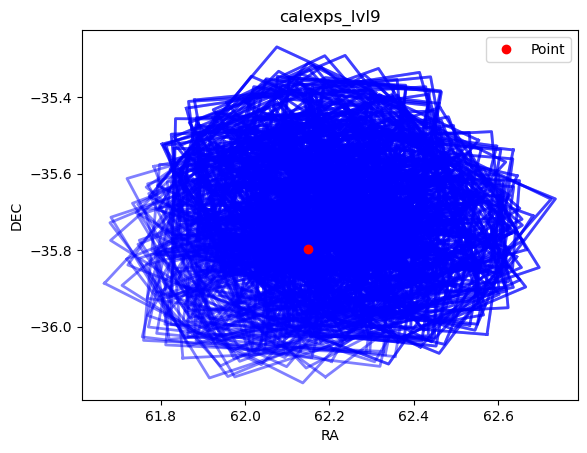

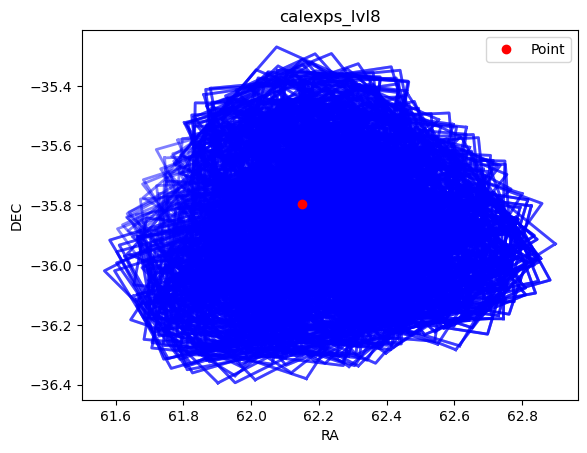

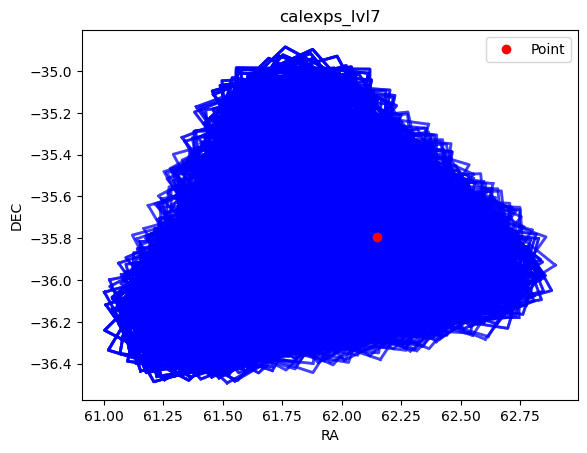

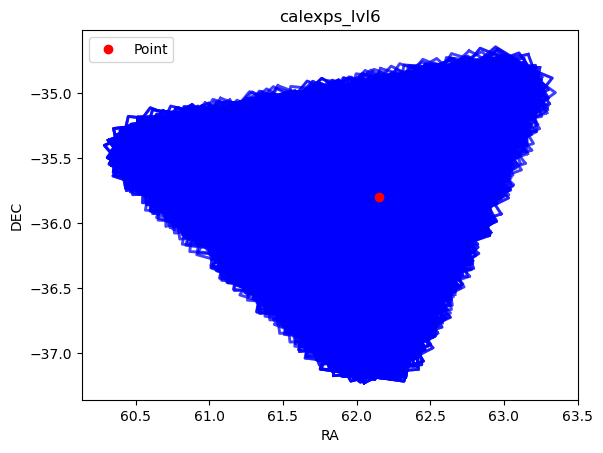

In [64]:
for i in RA:
    plot_calexps_from_radec(RA[i], DEC[i], ra, dec, f"calexps_lvl{i}")

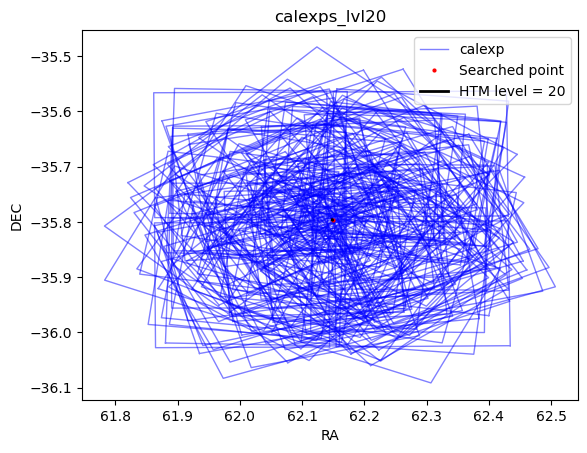

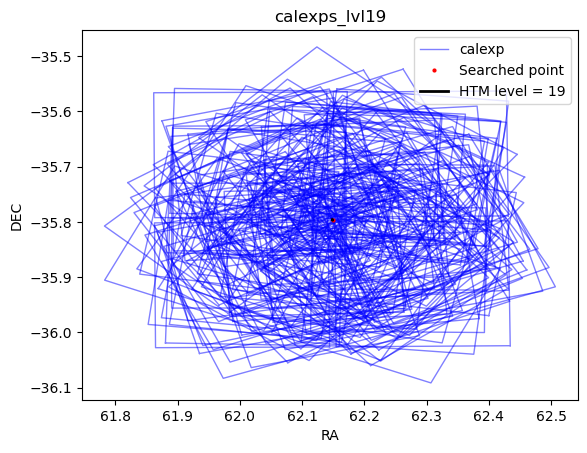

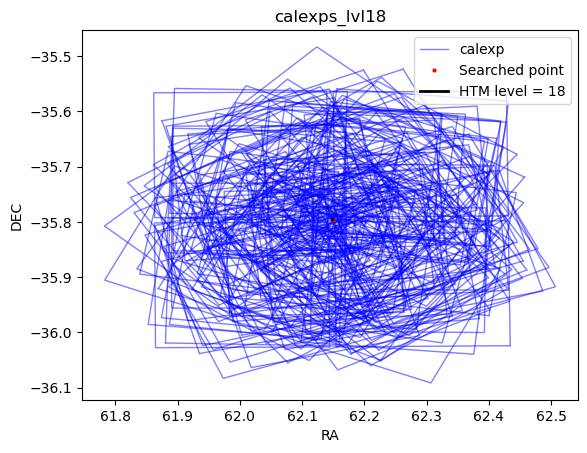

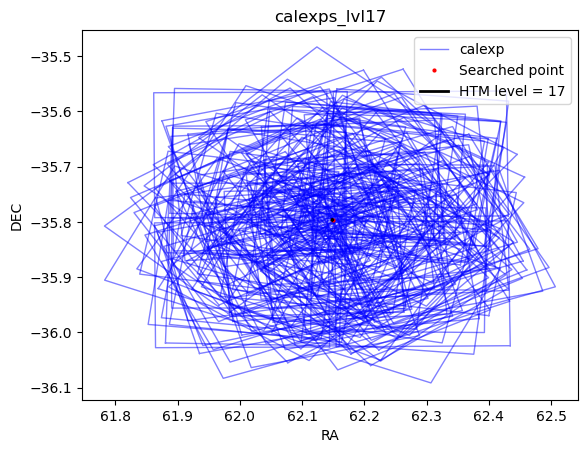

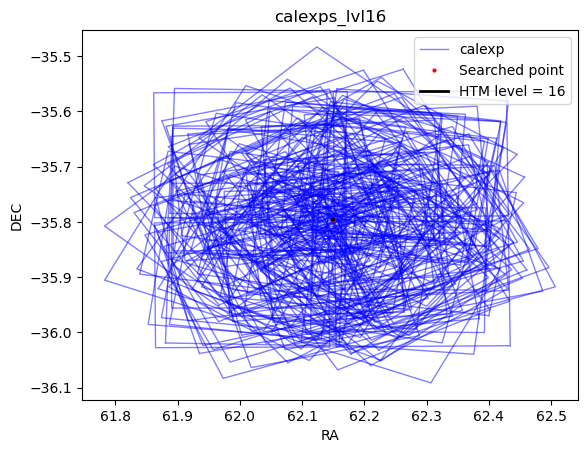

...

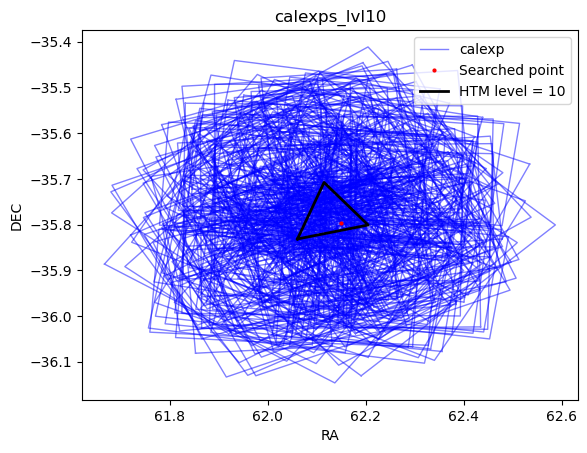

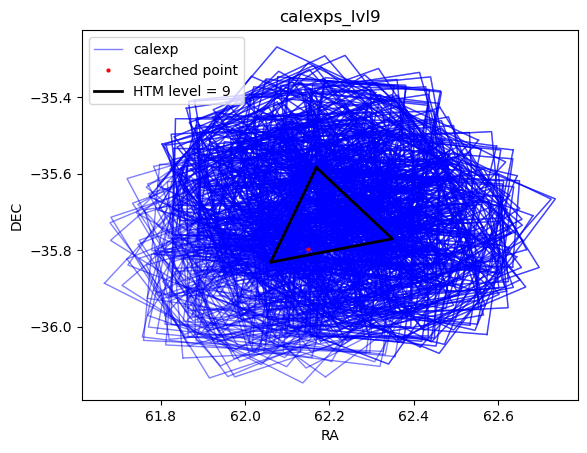

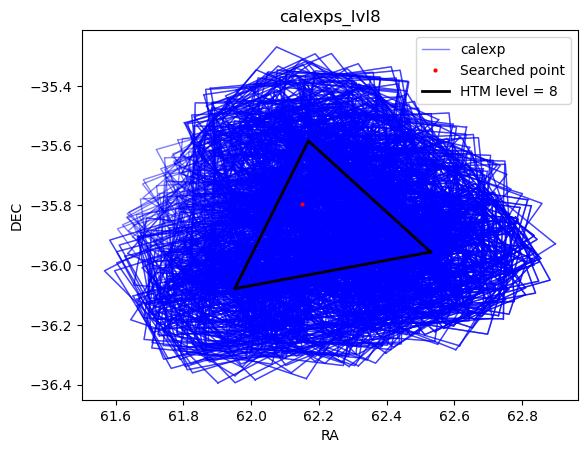

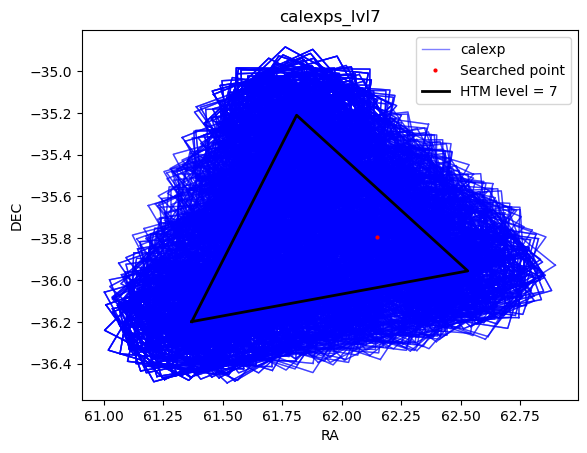

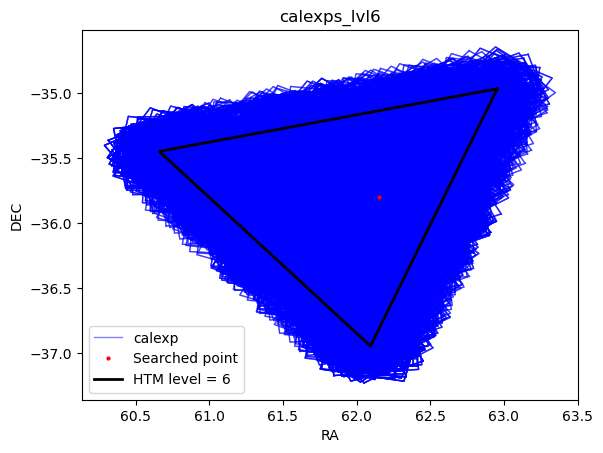

In [75]:
for level in RA:
    color="black"
    plot_calexps_from_radec(RA[level], DEC[level], ra, dec, f"calexps_lvl{level}")
    pixelization = lsst.sphgeom.HtmPixelization(level)
    htm_id = pixelization.index(lsst.sphgeom.UnitVector3d(lsst.sphgeom.LonLat.fromDegrees(ra, dec)))
    circle = pixelization.triangle(htm_id).getBoundingCircle()
    tri_ra_dec=[]
    for uni in pixelization.triangle(htm_id).getVertices():
        tri_ra_dec.append([sphgeom.LonLat.longitudeOf(uni).asDegrees(),sphgeom.LonLat.latitudeOf(uni).asDegrees()])
    poli =Polygon(tri_ra_dec)
    x, y = poli.exterior.xy
    plt.plot(x, y,  alpha=1, color=color, linewidth=2, label = f"HTM level = {level}")
    ret = []
    if circle:
        uni=circle.getCenter()
        ra_c, dec_c = sphgeom.LonLat.longitudeOf(uni).asDegrees(), sphgeom.LonLat.latitudeOf(uni).asDegrees()
        r = circle.getOpeningAngle().asDegrees()
        circ = plt.Circle((ra_c,dec_c), r, linewidth=2, linestyle="--", color=colors[lvl-1],fill=False, label="Bounding circle")
        ret.append(circ)
    plt.legend()

In [74]:
def plot_calexps_from_radec(R, D, ra, dec, title):
    fig, ax = plt.subplots()
    polygons = [Polygon(zip(ra_corners, dec_corners)) for ra_corners, dec_corners in zip(R, D)]
    ok=False
    for polygon in polygons:
        x, y = polygon.exterior.xy
        if ok==False:
            ax.plot(x, y, 'b-', alpha=0.5, linewidth=1, label="calexp")
            ok=True
        else:
            ax.plot(x, y, 'b-', alpha=0.5, linewidth=1)
    plt.plot(ra, dec, 'ro', markersize=2, label='Searched point')
    plt.xlabel('RA')
    plt.ylabel('DEC')
    plt.title(title)
    plt.legend()
    plt.savefig(title+".png")

In [ ]:
# Count calexp per htm level
ra = 62.149
dec = -35.796
band = "r"
# data = inj_ext_loc(band, ra, dec, model, start=0, finish=3, htm_lvl=18)
RA={}; DEC={}
# start = 0 ;finish = 139
Levels = np.arange(1,21)
N_calexps=[]
for lvl in range(1,21):
    pixelization = lsst.sphgeom.HtmPixelization(lvl)
    htm_id = pixelization.index(lsst.sphgeom.UnitVector3d(lsst.sphgeom.LonLat.fromDegrees(ra, dec)))
    circle = pixelization.triangle(htm_id).getBoundingCircle()
    scale = circle.getOpeningAngle().asDegrees()*3600.
    level = pixelization.getLevel()
    print("{:<20}".format(f'({ra}, {dec})') + f'HTM ID={htm_id} at level={level} is bounded by a circle of radius ~{scale:0.2f} arcsec.')
    datasetRefs = butler.registry.queryDatasets("calexp", htm20=htm_id,where=f"band = '{band}'")   
    n=len(list(datasetRefs))
    print("{:<20}".format("") + f"Found {n} calexps")
    N_calexps.append(n)


plt.plot(Levels, np.log10(N_calexps), ".-")
plt.xticks(Levels)
plt.xlabel("HTM level")
plt.ylabel("count of calexps $[\log]$")
plt.title("Obtanied calexps per HTM level")
plt.grid()

plt.figure()
plt.plot(Levels, N_calexps, ".-")
plt.xticks(Levels)
plt.xlabel("HTM level")
plt.ylabel("count of calexps")
plt.title("Obtanied calexps per HTM level")
plt.grid()

hay que ir comparando la lista de sources una con la anterior en un loop e ir descartando las que no coinciden. Asi, al final me quedo solo con fuentes que estan en todas las calexp

In [ ]:
lvl = 20
overlapping_regions(RA[lvl], DEC[lvl], min_overlap=100)

In [ ]:
# Inject above all sources

# Check common sources to be injected → ra, dec s 
# Entire catalog: generate microlensing lcs with random params for each source → inject_data
# inject all sources in all calexps (save all calexps)
dataid, mjd, mag_inj, injected_exposure = inject(calexp_data, inject_data, inject_task)
calexp.writeFits("output_file_name.fits")

# Extract all injected sources
#per calexp:
    # Check sources injected 
    sources = detect_sources(tab, injected_exposure, deblend=deblend, measure=measure)
    #per injected source: recorrer soruces
        flux, flux_err = source_photometry(sources, inject_data["ra"], inject_data["dec"], injected_exposure, delta = 0.0005)
        mag, mag_err = toMag(injected_exposure, flux, flux_err) if (flux, flux_err)!= (None, None) else (None, None)


In [ ]:
# Sin injecciónOrdenado en funciones, falta chequear si funciona bien
ra = 62.149
dec = -35.796
t_0 = 59920  # Time of closest approach
t_E = 90  # Einstein timescale
u_0 = 0.2  # Minimum impact parameter
m_t = 25       # i : 23.41 , 26.4

exp_midpoints, visits, detectors, datasetRefs_list = calexp_from_loc(ra, dec)
measure_task, char_image_task, detect_task, deblend_task, schema, tab = initialize_tasks()


mags_measured = []
mags_injected = []
mags_errors = []
detector = []
visit = []
fluxs = []
flux_errs = []
dataids = []
mjds = []
filenames = []

start_ind = 0
finish_ind = 3
imgs=[]

calexp_ref, psf_ref, phot_calib_ref, wcs_ref, xy_ref= get_calexp_data(datasetRefs_list[start_ind])
inject_task=Injection()
for i, (calexp_data, inject_data) in enumerate(zip(datasetRefs_list[start_ind:finish_ind], inject_table[start_ind:finish_ind])):
    print(f"{'-'*15} Injection   {i+1}/{finish_ind-start_ind} {'-'*15}")

    # Inject
    calexp, psf_ref, phot_calib_ref, wcs_ref, xy_ref= get_calexp_data(datasetRefs_list[start_ind])
    if (dataid, mjd, mag_inj, calexp) == (None, None, None, None):
        continue
        
    # Detectar, deblend (hijos/padres) y medir fuentes
    sources = detect_sources(tab, injected_exposure, deblend=deblend_task, measure=measure_task)
    
    # Medir fotometría
    source_photo(source, ra, dec, injected_exposure)
    flux, flux_err = source_photo(source, ra, dec, injected_exposure)
    mag, mag_err = toMag(injected_exposure, flux, flux_err)

    mjds.append(mjd)
    mags_measured.append(mag)
    mags_errors.append(mag_err)
    fluxs.append(flux)
    flux_errs.append(flux_err)
    dataids.append(dataid)
    mags_injected.append(mag_inj)
    detector.append(dataid["detector"])
    visit.append(dataid["visit"])

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))
    calexp_plot(img, fig, ax2, warp=calexp_ref)
    
    lc_plot(mjd, mags_measured, mags_errors,  ax=ax1)
    
    filename = f'frame_{i}.png'
    plt.tight_layout()
    plt.savefig(filename, bbox_inches='tight')
    filenames.append(filename)
    plt.close()
    
    print(f"MJD: {mjd} | Injeted: {mag_inj} | Measured: {mag} | Error: {mag_err}")
    print(f"                            Flux: Measured: {flux} | Error: {flux_err}")
    
    del injected_exposure

data = {
    'mags_measured': mags_measured,
    'mags_injected': mags_injected,
    'mags_errors': mags_errors,
    'fluxs': fluxs,
    'flux_errs': flux_errs,
    'detector': detector,
    'visit': visit,
    'mjds': mjds}

df = pd.DataFrame(data)
df.to_csv(f'uLens-m_t{m_t}.csv', index=False)
with imageio.get_writer(f'uLens-m_t{m_t}.gif', mode='I', duration=500) as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)



In [ ]:


def create_zip(zip_name, files):
    with zipfile.ZipFile(zip_name, 'w') as zipf:
        for file in files:
            zipf.write(file, os.path.basename(file))

# Example usage
files_to_zip = [name for name in os.listdir("outpouts") if name.startswith("frame") ]#or name.startswith("uLens")]  # Replace with your actual file names
create_zip("frames.zip", files_to_zip)



### Measure photometry in any ra, dec
Not acomplished;
check the ending of https://data.lsst.cloud/nb/user/karennowo/lab/workspaces/auto-x/tree/notebooks/tutorial-notebooks/DP02_05_Source_Detection_and_Measurement.ipynb


In [ ]:
ra = 62.149
dec = -35.796
exp_midpoints, visits, detectors, datasetRefs_list = calexp_from_loc(ra, dec)
calexp, psf, phot_calib, wcs, xy= get_calexp_data(datasetRefs_list[0])

In [ ]:
schema = afwTable.SourceTable.makeMinimalSchema()
alias = schema.getAliasMap() 
x_key = schema.addField("centroid_x", type="D")
y_key = schema.addField("centroid_y", type="D")
alias.set("slot_Centroid", "centroid")

xx_key = schema.addField("shape_xx", type="D")
yy_key = schema.addField("shape_yy", type="D")
xy_key = schema.addField("shape_xy", type="D")
alias.set("slot_Shape", "shape")
type_key = schema.addField("type_flag", type="F")
forcedSource = afwTable.SourceCatalog(schema)
print(len(forcedSource))
config = ForcedMeasurementTask.ConfigClass()
config.copyColumns = {}
config.plugins.names = [
    "base_PixelFlags",
    "base_TransformedCentroid",
    "base_PsfFlux",
    "base_TransformedShape"
]
config.doReplaceWithNoise = False
forcedMeasurementTask = ForcedMeasurementTask(schema, config=config)
del config

In [ ]:
bbox = calexp.getBBox()
wcs = calexp.getWcs()
center = wcs.pixelToSky(bbox.centerX, bbox.centerX)
cra = center.getRa().asDegrees()
cdec = center.getDec().asDegrees()
# srcs_dra = np.abs(srcs_ra - cra)
# srcs_ddec = np.abs(srcs_dec - cdec)

pixelScale = calexp.getWcs().getPixelScale().asArcseconds()
radius_pix = int(2.0 * 60.0 / pixelScale)
center_x = bbox.centerX
center_y = bbox.centerY



sourceRec = forcedSource.addNew()
coord = geom.SpherePoint(np.radians(ra) * geom.radians,
                         np.radians(dec) * geom.radians)
sourceRec.setCoord(coord)
# sourceRec[x_key] = r_xpix[i]
# sourceRec[y_key] = r_ypix[i]
sourceRec[type_key] = 1

print(len(forcedSource))

In [ ]:

measure_task, char_image_task, detect_task, deblend_task, schema, tab = initialize_tasks()
sources = detect_sources(tab, calexp, deblend=deblend_task, measure=measure_task)

In [ ]:
ra2 = float(sources[0]["coord_ra"])
dec2 = float(sources[0]["coord_dec"])

In [ ]:
forcedMeasCat = forcedMeasurementTask.generateMeasCat(calexp, forcedSource,
                                                      calexp.getWcs())
forcedMeasurementTask.run(forcedMeasCat, calexp, forcedSource, calexp.getWcs())
table = forcedMeasCat.asAstropy()
temp = forcedSource.asAstropy()
table['type_flag'] = temp['type_flag']
del temp
afw_display = afwDisplay.Display(frame=1)
afw_display.mtv(calexp)
afw_display.setMaskTransparency(100)
with afw_display.Buffering():
    for i in range(len(table)):
        clr = 'orange'
        if table['type_flag'][i] == 1:
            clr = 'cyan'
        afw_display.dot('o', table['slot_Centroid_x'][i],
                        table['slot_Centroid_y'][i],
                        size=200, ctype=clr)

### Saved lines

In [4]:
# Funciona, sin odenar 1.03GB
g=0
mem=[]
ra = 62.149
dec = -35.796
print(f"Step {g}")
g+=1
# mem.append(input("write memory RAM"))
exp_midpoints, visits, detectors, datasetRefs_list = calexp_from_loc(ra, dec)

#### 1.04
t_0 = 59920  # Time of closest approach
t_E = 90  # Einstein timescale
u_0 = 0.2  # Minimum impact parameter
m_t = 25       # i : 23.41 , 26.4


# memory_log = {}
# flags = []
# times = []
print(f"Step {g}")
g+=1
# mem.append(input("write memory RAM"))
# t0=time.time()
# mem_log(memory_log, times, flags, t0)

#############################################################################################
schema = afwTable.SourceTable.makeMinimalSchema()
algMetadata = dafBase.PropertyList()
config = SingleFrameMeasurementTask.ConfigClass()
print(f"Step {g}")
g+=1
# mem.append(input("write memory RAM"))
#### 1.06
measure_task = SingleFrameMeasurementTask(schema=schema,
                                                   config=config,
                                                   algMetadata=algMetadata)
print(f"Step {g}")
g+=1
# mem.append(input("write memory RAM"))
config = CharacterizeImageTask.ConfigClass()
config.psfIterations = 1
charImageTask = CharacterizeImageTask(config=config)
print(f"Step {g}")
g+=1
# mem.append(input("write memory RAM"))
config = SourceDetectionTask.ConfigClass()
config.thresholdValue = 5
config.thresholdType = "stdev"
detect_task = SourceDetectionTask(schema=schema, config=config)
print(f"Step {g}")
g+=1
# mem.append(input("write memory RAM"))
del config
print(f"Step {g}")
g+=1
# mem.append(input("write memory RAM"))
######### 1.08
print(f"Step {g}")
g+=1
# mem.append(input("write memory RAM"))
sourceDeblendTask = SourceDeblendTask(schema=schema)
print(f"Step {g}")
g+=1
# mem.append(input("write memory RAM"))
tab = afwTable.SourceTable.make(schema)
del schema
# mem_log(memory_log, times, flags, t0)

print(f"Step {g}")
g+=1
# mem.append(input("write memory RAM"))


# ############################################################################################
for m_t in [20]:
    mags_measured = []
    mags_injected = []
    mags_errors = []
    detector = []
    visit = []
    fluxs = []
    flux_errs = []
    dataids = []
    mjds = []
    filenames = []
    
    var_mags = uLens_Pacz(exp_midpoints, t_0, t_E, u_0, m_t, plot=False) 
    t = np.linspace(min(exp_midpoints), max(exp_midpoints), 1000)
    uLens_P = uLens_Pacz(t, t_0, t_E, u_0, m_t, plot=False) 
    ######### 1.08

    inject_table = create_catalog(var_mags, exp_midpoints, visits, detectors)
    # mem_log(memory_log, times, flags, t0)
    print(f"Step {g}")
    g+=1
    # mem.append(input("write memory RAM"))
    
    start_ind = 0
    finish_ind = -1
    imgs=[]
    calexp_ref, psf_ref, phot_calib_ref, wcs_ref, xy_ref= get_calexp_data(datasetRefs_list[start_ind])
    inject_task=Injection()
    ######### 1.28
    # mem_log(memory_log, times, flags, t0)
    print(f"Step {g}")
    g+=1
    # mem.append(input("write memory RAM"))

    mem = []; g=0
    for i, (calexp_data, inject_data) in enumerate(zip(datasetRefs_list[start_ind:finish_ind], inject_table[start_ind:finish_ind])):
    
        print(f"{'-'*15} Injection   {i+1}/{finish_ind-start_ind} {'-'*15}")
        # mem_log(memory_log, times, flags, t0)
        print(f"Step {g}")
        g+=1
        # mem.append(input("write memory RAM"))
    
    
        
        dataid, mjd, mag_inj, injected_exposure = inject(calexp_data, inject_data, inject_task)
        if (dataid, mjd, mag_inj, injected_exposure) == (None, None, None, None):
            continue
    
        # mem_log(memory_log, times, flags, t0)
        print(f"Step {g}")
        g+=1
        # mem.append(input("write memory RAM"))
        
        # Detectar fuentes
        detect_result = detect_task.run(tab, injected_exposure)
        sources = detect_result.sources
        print(f"Step {g}")
        g+=1
        # mem.append(input("write memory RAM"))
        # sources.asAstropy()
        sourceDeblendTask.run(injected_exposure, sources)
        print(f"Step {g}")
        g+=1
        # mem.append(input("write memory RAM"))
        measure_task.run(measCat=sources, exposure=injected_exposure)
        # print(f"Step {g}")
        # g+=1
        # mem.append(input("write memory RAM"))
        # Encontrar la fuente inyectada en los resultados
        for source in sources:
            if (abs(float(source["coord_ra"])/np.pi*180-ra) < 0.00005)  and (abs(float(source["coord_dec"])/np.pi*180-dec) < 0.00005):
                print(float(source["coord_ra"])/np.pi*180)
                print(ra)
                print(float(source["coord_dec"])/np.pi*180)
                print(dec)
                break
        photoCalib = injected_exposure.getPhotoCalib()
    
        # mem_log(memory_log, times, flags, t0)
        # print(f"Step {g}")
        # g+=1
        # mem.append(input("write memory RAM"))
        
        flux = source.get("base_PsfFlux_instFlux")
        flux_err = source.get("base_PsfFlux_instFluxErr")
        measure = photoCalib.instFluxToMagnitude(flux, flux_err)
        mag = measure.value
        mag_err = measure.error
       
    
        mjds.append(mjd)
        mags_measured.append(mag)
        mags_errors.append(mag_err)
        fluxs.append(flux)
        flux_errs.append(flux_err)
        dataids.append(dataid)
        mags_injected.append(mag_inj)
    
        # mem_log(memory_log, times, flags, t0)
        # print(f"Step {g}")
        # g+=1

        # if i>23:
        #     img = warp_img(calexp_ref, injected_exposure, wcs_ref)
        #     img = cutout(img, ra, dec, 401)
        
        #     fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))
        #     calexp_plot(img, fig, ax2)
        #     # calexp_plot(Img, fig, ax3)
        #     ax1.plot(mjds, mags_injected, 'bo', label="Injected", markersize=5)
        #     ax1.errorbar(mjds, mags_measured, yerr=mags_errors, fmt='ro', label="Measured", markersize=4) ##
        #     t_aux = t[t<=mjds[-1]]
        #     ax1.plot(t_aux, uLens_P[:len(t_aux)], "Gray", label = "Pacz")
        #     ax1.set_xlabel('expMid')
        #     ax1.set_ylabel('mag')
        #     ax1.set_title(f'Microlensing [Pacz $m_t={m_t}$, $t_0={t_0}$, $t_E={t_E}$, $u_0={u_0}$]', fontsize=10)
        #     # ax1.set_xlim(min(mjds)-5, max(mjds)+5)
        #     # ax1.set_ylim(min([min(mags_measured),min(mags_injected)])  - 0.5, max([max(mags_measured),max(mags_injected)])  + 0.5)
        #     ax1.invert_yaxis()
        #     ax1.legend()
        #     # ax2.set_title(f'{i}. visit: {dataid["visit"]}, expMid: {mjd:0.5F}, mag={mag:0.2F}', fontsize=8)
        #     # x,y = SkyToPix(ra, dec, img)
        #     # rect = patches.Rectangle((x - 20, y - 20), 40, 40, linewidth=1, edgecolor='r', facecolor='none')
        #     # ax2.add_patch(rect)
        #     plt.tight_layout()
        #     ax2.axis('off')
        #     filename = f'frame_{i}-m{m_t}.png'
        #     plt.savefig(filename, bbox_inches='tight')
        #     filenames.append(filename)
        #     plt.close()
        #     mem_log(memory_log, times, flags, t0)
        #     print(f"Step {g}")
        #     g+=1
        
        print(f"MJD: {mjd} | Injeted: {mag_inj} | Measured: {mag} | Error: {mag_err}")
        print(f"                            Flux: Measured: {flux} | Error: {flux_err}")
    
        # injected_exposure.writeFits(f"calexp{i}-m{m_t}.fits")
        del injected_exposure
        detector.append(dataid["detector"])
        visit.append(dataid["visit"])
        # mem_log(memory_log, times, flags, t0)
        print(f"Step {g}")
        g+=1
        # mem.append(input("write memory RAM"))
        

        
        
    # data = {
    #     'mags_measured': mags_measured,
    #     'mags_injected': mags_injected,
    #     'mags_errors': mags_errors,
    #     'fluxs': fluxs,
    #     'flux_errs': flux_errs,
    #     'detector': detector,
    #     'visit': visit,
    #     'mjds': mjds}
    
    # df = pd.DataFrame(data)
    # df.to_csv(f'uLens-m_t{m_t}.csv', index=False)

    # t2 = time.time()
    # print("Task: Time consumed "+ str(t2-t1))
    # print("Total: Time consumed "+ str(t2-t0))
    # t1 = t2
    # with imageio.get_writer(f'uLens-m_t{m_t}.gif', mode='I', duration=500) as writer:
    #     for filename in filenames:
    #         image = imageio.imread(filename)
    #         writer.append_data(image)
    # t2 = time.time()
    # print("Task: Time consumed "+ str(t2-t1))
    # print("Total: Time consumed "+ str(t2-t0))
    # t1 = t2


Step 0
(62.149, -35.796)   HTM ID=9645646590460 at level=20 is bounded by a circle of radius ~0.26 arcsec.
                    Found 137 calexps
Step 1
Step 2
Step 3
Step 4
Step 5
Step 6
Step 7
Step 8
Step 9
Step 10
Step 11
--------------- Injection   1/-1 ---------------
Step 0


Step 1


Step 2


Step 3


Step 4
62.1490005944109
62.149
-35.79599981329847
-35.796
Step 5
MJD: 59857.34937821991 | Injeted: 19.463764872478762 | Measured: 19.46603937463371 | Error: 0.003406317211153888
                            Flux: Measured: 90136.64641445955 | Error: 280.9714571382407
Step 6
--------------- Injection   2/-1 ---------------
Step 7


Step 8


Step 9


Step 10


Step 11
62.149000519057445
62.149
-35.79600105390389
-35.796
Step 12
MJD: 59866.18965722222 | Injeted: 19.35375698085209 | Measured: 19.34969098313813 | Error: 0.005864603755049442
                            Flux: Measured: 99759.69926485803 | Error: 537.9838927713445
Step 13
--------------- Injection   3/-1 ---------------
Step 14


Step 15


Step 16


Step 17


Step 18
62.14899970956064
62.149
-35.7960002810033
-35.796
Step 19
MJD: 59866.326085221066 | Injeted: 19.351875395210893 | Measured: 19.344679306016886 | Error: 0.005269597981979936
                            Flux: Measured: 100328.20059661184 | Error: 485.74230067359713
Step 20
--------------- Injection   4/-1 ---------------
Step 21


Step 22


Step 23


Step 24


Step 25
62.1489999097785
62.149
-35.79599861926184
-35.796
Step 26
MJD: 59866.35397722222 | Injeted: 19.351489974293916 | Measured: 19.355101291597826 | Error: 0.005205592681854255
                            Flux: Measured: 99455.61347774508 | Error: 475.8664654294306
Step 27
--------------- Injection   5/-1 ---------------
Step 28


Step 29


Step 30


Step 31


Step 32
62.149000395642815
62.149
-35.79600009099887
-35.796
Step 33
MJD: 59866.35578422338 | Injeted: 19.351464995871176 | Measured: 19.354294456173193 | Error: 0.0052954120287584784
                            Flux: Measured: 99527.94749819931 | Error: 484.2692595676004
Step 34
--------------- Injection   6/-1 ---------------
Step 35


Step 36


Step 37


Step 38


Step 39
62.148999961059324
62.149
-35.7960002881887
-35.796
Step 40
MJD: 59870.21872022106 | Injeted: 19.295572780292197 | Measured: 19.294278897566905 | Error: 0.002709904752066066
                            Flux: Measured: 105354.80571241795 | Error: 260.67469708743545
Step 41
--------------- Injection   7/-1 ---------------
Step 42


No sources to inject for visit  214517 Error: No sources to be injected for this DatasetRef, and process_all_data_ids is False.
--------------- Injection   8/-1 ---------------
Step 43


Step 44


Step 45


Step 46


Step 47
62.1489994741169
62.149
-35.79600015517333
-35.796
Step 48
MJD: 59870.24356821991 | Injeted: 19.295196596169802 | Measured: 19.29010765181412 | Error: 0.0031019260574281604
                            Flux: Measured: 105654.82355771965 | Error: 300.6805534207399
Step 49
--------------- Injection   9/-1 ---------------
Step 50


Step 51


Step 52


Step 53


Step 54
62.149000278419464
62.149
-35.79599984272416
-35.796
Step 55
MJD: 59870.24493022106 | Injeted: 19.295175969917697 | Measured: 19.295507125595645 | Error: 0.002981041326519126
                            Flux: Measured: 105292.34987177957 | Error: 287.57343123204555
Step 56
--------------- Injection   10/-1 ---------------
Step 57


Step 58


Step 59


Step 60


Step 61
62.1490008513233
62.149
-35.79599942577561
-35.796
Step 62
MJD: 59870.26280222222 | Injeted: 19.294905253727155 | Measured: 19.292649636830877 | Error: 0.0031249691533587914
                            Flux: Measured: 105534.45580349567 | Error: 302.0840441206055
Step 63
--------------- Injection   11/-1 ---------------
Step 64


Step 65


Step 66


Step 67


Step 68
62.14900007185107
62.149
-35.79600025994013
-35.796
Step 69
MJD: 59898.09524622453 | Injeted: 18.706566219605754 | Measured: 18.70033115883823 | Error: 0.0019642984703731256
                            Flux: Measured: 181515.3520825124 | Error: 324.73789465876604
Step 70
--------------- Injection   12/-1 ---------------
Step 71


Step 72


Step 73


Step 74


Step 75
62.14899973494292
62.149
-35.79599993642457
-35.796
Step 76
MJD: 59898.12404022107 | Injeted: 18.70577406141272 | Measured: 18.698899241761065 | Error: 0.001845009296713078
                            Flux: Measured: 181750.1466818857 | Error: 304.57487177173664
Step 77
--------------- Injection   13/-1 ---------------
Step 78


Step 79


Step 80


Step 81


Step 82
62.14899987613938
62.149
-35.79599997621828
-35.796
Step 83
MJD: 59916.197686224536 | Injeted: 18.259465580653774 | Measured: 18.258006165442833 | Error: 0.0017533076437045115
                            Flux: Measured: 273668.98291210615 | Error: 428.23348690061835
Step 84
--------------- Injection   14/-1 ---------------
Step 85


Step 86


Step 87


Step 88


Step 89
62.14899995876361
62.149
-35.79599997616649
-35.796
Step 90
MJD: 59935.10934922338 | Injeted: 18.514882794513984 | Measured: 18.513424202823106 | Error: 0.0013813178969182822
                            Flux: Measured: 216422.72921840497 | Error: 265.22688470217815
Step 91
--------------- Injection   15/-1 ---------------
Step 92


Step 93


Step 94


Step 95


Step 96
62.148999800316574
62.149
-35.79600015604371
-35.796
Step 97
MJD: 59944.169472222224 | Injeted: 18.767884871589892 | Measured: 18.764953287246005 | Error: 0.0020083682981655022
                            Flux: Measured: 171729.3371980763 | Error: 312.24693404950904
Step 98
--------------- Injection   16/-1 ---------------
Step 99


Step 100


Step 101


Step 102


Step 103
62.14899984245805
62.149
-35.79599995491519
-35.796
Step 104
MJD: 59975.139285221056 | Injeted: 19.37177470725874 | Measured: 19.368220057182413 | Error: 0.004131712172213359
                            Flux: Measured: 98605.15083333624 | Error: 372.69038641430427
Step 105
--------------- Injection   17/-1 ---------------
Step 106


Step 107


Step 108


Step 109


Step 110
62.148999055352654
62.149
-35.79600008715916
-35.796
Step 111
MJD: 59975.14198522107 | Injeted: 19.371810746872086 | Measured: 19.377453818782335 | Error: 0.004328138475432418
                            Flux: Measured: 97791.7372206 | Error: 387.9359391034456
Step 112
--------------- Injection   18/-1 ---------------
Step 113


Step 114


Step 115


Step 116


Step 117
62.148999401319784
62.149
-35.79599973609781
-35.796
Step 118
MJD: 59975.16505122454 | Injeted: 19.372118539349163 | Measured: 19.374898272577894 | Error: 0.004907562955297901
                            Flux: Measured: 97934.84650640421 | Error: 440.9372945170473
Step 119
--------------- Injection   19/-1 ---------------
Step 120


Step 121


Step 122


Step 123


Step 124
62.1490008478486
62.149
-35.795999864734526
-35.796
Step 125
MJD: 60162.35629422337 | Injeted: 19.974245666497325 | Measured: 19.977044477246366 | Error: 0.010049611827026591
                            Flux: Measured: 56025.50096733492 | Error: 518.2405338181641
Step 126
--------------- Injection   20/-1 ---------------
Step 127


Step 128


Step 129


Step 130


Step 131
62.14899981007752
62.149
-35.796001316093296
-35.796
Step 132
MJD: 60162.36782522107 | Injeted: 19.974249583616807 | Measured: 19.97753423714895 | Error: 0.01052323174947976
                            Flux: Measured: 55756.74926530678 | Error: 540.2045272798106
Step 133
--------------- Injection   21/-1 ---------------
Step 134


No sources to inject for visit  410985 Error: No sources to be injected for this DatasetRef, and process_all_data_ids is False.
--------------- Injection   22/-1 ---------------
Step 135


Step 136


Step 137


Step 138


Step 139
62.14899845691077
62.149
-35.79599849946752
-35.796
Step 140
MJD: 60162.36827422338 | Injeted: 19.974249736129977 | Measured: 19.968361539594056 | Error: 0.009749506286206827
                            Flux: Measured: 56482.565998080354 | Error: 506.890492992327
Step 141
--------------- Injection   23/-1 ---------------
Step 142


Step 143


Step 144


Step 145


Step 146
62.14899954491295
62.149
-35.795999127651235
-35.796
Step 147
MJD: 60179.37506321991 | Injeted: 19.979323033331614 | Measured: 19.975748667183645 | Error: 0.006386272430915818
                            Flux: Measured: 55998.74940006791 | Error: 329.1352026600075
Step 148
--------------- Injection   24/-1 ---------------
Step 149


Step 150


Step 151


Step 152


Step 153
62.149000414879865
62.149
-35.79600028862757
-35.796
Step 154
MJD: 60180.30522922338 | Injeted: 19.9795640393837 | Measured: 19.983010855082835 | Error: 0.005786234390355091
                            Flux: Measured: 55812.69222768427 | Error: 296.94354860921476
Step 155
--------------- Injection   25/-1 ---------------
Step 156


Step 157


Step 158


Step 159


Step 160
62.149000638614
62.149
-35.79600039452243
-35.796
Step 161
MJD: 60180.32604922338 | Injeted: 19.9795693950206 | Measured: 19.97909403275286 | Error: 0.006013820879946801
                            Flux: Measured: 55987.41097792233 | Error: 309.75138035921634
Step 162
--------------- Injection   26/-1 ---------------
Step 163


No sources to inject for visit  433952 Error: No sources to be injected for this DatasetRef, and process_all_data_ids is False.
--------------- Injection   27/-1 ---------------
Step 164


Step 165


Step 166


Step 167


Step 168
62.149000637074806
62.149
-35.79600064819147
-35.796
Step 169
MJD: 60201.23991922338 | Injeted: 19.984189828729633 | Measured: 19.997841983715944 | Error: 0.006630590957187538
                            Flux: Measured: 54956.489953286145 | Error: 335.3068984937786
Step 170
--------------- Injection   28/-1 ---------------
Step 171


Step 172


Step 173


Step 174


Step 175
62.14900218635332
62.149
-35.79600100380863
-35.796
Step 176
MJD: 60201.25511222222 | Injeted: 19.984192695946657 | Measured: 19.968355742924903 | Error: 0.0067502133596570495
                            Flux: Measured: 56441.93940030818 | Error: 350.65584555659444
Step 177
--------------- Injection   29/-1 ---------------
Step 178


Step 179


Step 180


Step 181


Step 182
62.14900227885901
62.149
-35.796000904392706
-35.796
Step 183
MJD: 60201.255561224534 | Injeted: 19.984192780672636 | Measured: 19.97600841036013 | Error: 0.006735840437786174
                            Flux: Measured: 56033.258339327396 | Error: 347.2789679840272
Step 184
--------------- Injection   30/-1 ---------------
Step 185


Step 186


Step 187


Step 188


Step 189
62.14899949559229
62.149
-35.796000451318235
-35.796
Step 190
MJD: 60201.25735722222 | Injeted: 19.984193119568875 | Measured: 19.987378488599003 | Error: 0.006680822351394998
                            Flux: Measured: 55461.140474153275 | Error: 340.9462199647037
Step 191
--------------- Injection   31/-1 ---------------
Step 192


Step 193


Step 194


Step 195


Step 196
62.14900161692853
62.149
-35.79600075533896
-35.796
Step 197
MJD: 60241.23140122453 | Injeted: 19.989966685615567 | Measured: 19.99274481004192 | Error: 0.008019646222665105
                            Flux: Measured: 55348.939364263 | Error: 408.52783860863224
Step 198
--------------- Injection   32/-1 ---------------
Step 199


Step 200


Step 201


Step 202


Step 203
62.14900001020012
62.149
-35.79600002422588
-35.796
Step 204
MJD: 60241.23185022106 | Injeted: 19.98996673441784 | Measured: 19.996509456403025 | Error: 0.007729350454699359
                            Flux: Measured: 55200.15696588413 | Error: 392.4168103594622
Step 205
--------------- Injection   33/-1 ---------------
Step 206


Step 207


Step 208


Step 209


Step 210
Step 211
MJD: 60242.25246122453 | Injeted: 19.990076923594923 | Measured: 22.71033643640916 | Error: 0.11341917586671162
                            Flux: Measured: 4528.8918960962465 | Error: 473.09923422888664
Step 212
--------------- Injection   34/-1 ---------------
Step 213


No sources to inject for visit  458564 Error: No sources to be injected for this DatasetRef, and process_all_data_ids is False.
--------------- Injection   35/-1 ---------------
Step 214


Step 215


Step 216


Step 217


Step 218
62.14900089668173
62.149
-35.795999263166976
-35.796
Step 219
MJD: 60269.06344422338 | Injeted: 19.99250729602209 | Measured: 19.98458477166633 | Error: 0.007845616541355727
                            Flux: Measured: 55721.565224124526 | Error: 402.29437660993545
Step 220
--------------- Injection   36/-1 ---------------
Step 221


Step 222


Step 223


Step 224


Step 225
62.14899966207824
62.149
-35.79600061148164
-35.796
Step 226
MJD: 60269.07523122453 | Injeted: 19.992508193317235 | Measured: 20.0014772241638 | Error: 0.007716063578316093
                            Flux: Measured: 54909.16840349681 | Error: 389.91071165301696
Step 227
--------------- Injection   37/-1 ---------------
Step 228


Step 229


Step 230


Step 231


Step 232
Step 233
MJD: 60269.159254223385 | Injeted: 19.992514585835625 | Measured: 22.433460248122845 | Error: 0.07615389563269553
                            Flux: Measured: 5833.102302105152 | Error: 409.1319426644076
Step 234
--------------- Injection   38/-1 ---------------
Step 235


Step 236


Step 237


Step 238


Step 239
Step 240
MJD: 60269.159254223385 | Injeted: 19.992514585835625 | Measured: 23.13214325522763 | Error: 0.14160317747316853
                            Flux: Measured: 3063.0689796618394 | Error: 399.4887844395869
Step 241
--------------- Injection   39/-1 ---------------
Step 242


Step 243


Step 244


Step 245


Step 246
62.149000438513085
62.149
-35.79600143371941
-35.796
Step 247
MJD: 60279.191137222224 | Injeted: 19.9932321554953 | Measured: 19.990728729492734 | Error: 0.009888915337812294
                            Flux: Measured: 55271.93181467952 | Error: 503.1441947685396
Step 248
--------------- Injection   40/-1 ---------------
Step 249


Step 250


Step 251


Step 252


Step 253
62.14899950845821
62.149
-35.79599696067151
-35.796
Step 254
MJD: 60309.237739223376 | Injeted: 19.994930362761004 | Measured: 19.967741506236024 | Error: 0.010455201870711526
                            Flux: Measured: 56360.153571264505 | Error: 542.4415726755794
Step 255
--------------- Injection   41/-1 ---------------
Step 256


Step 257


Step 258


Step 259


Step 260
62.14900155506063
62.149
-35.79599765507764
-35.796
Step 261
MJD: 60309.25379722222 | Injeted: 19.99493112054598 | Measured: 19.976085924032997 | Error: 0.012803810026435316
                            Flux: Measured: 55486.33577310461 | Error: 654.2298553936455
Step 262
--------------- Injection   42/-1 ---------------
Step 263


Step 264


Step 265


Step 266


Step 267
62.14900205204494
62.149
-35.796000713583794
-35.796
Step 268
MJD: 60338.1400082199 | Injeted: 19.996095549905533 | Measured: 19.97105583022649 | Error: 0.01204002398661737
                            Flux: Measured: 55931.69702912194 | Error: 620.085465720615
Step 269
--------------- Injection   43/-1 ---------------
Step 270


Step 271


Step 272


Step 273


Step 274
62.14900744144486
62.149
-35.79600148544284
-35.796
Step 275
MJD: 60338.151751224534 | Injeted: 19.996095952060454 | Measured: 19.993819022444313 | Error: 0.012430354792628518
                            Flux: Measured: 54845.73243970863 | Error: 627.7583681009659
Step 276
--------------- Injection   44/-1 ---------------
Step 277


No sources to inject for visit  518056 Error: No sources to be injected for this DatasetRef, and process_all_data_ids is False.
--------------- Injection   45/-1 ---------------
Step 278


No sources to inject for visit  518092 Error: No sources to be injected for this DatasetRef, and process_all_data_ids is False.
--------------- Injection   46/-1 ---------------
Step 279


Step 280


Step 281


Step 282


Step 283
62.14902675966556
62.149
-35.795989217016924
-35.796
Step 284
MJD: 60338.16815222222 | Injeted: 19.996096513649377 | Measured: 19.991104951659114 | Error: 0.013523977201288829
                            Flux: Measured: 54768.934170630084 | Error: 682.0218850207999
Step 285
--------------- Injection   47/-1 ---------------
Step 286


Step 287


Step 288


Step 289


Step 290
62.149001557563615
62.149
-35.79600026685862
-35.796
Step 291
MJD: 60549.271243219904 | Injeted: 19.999162088195536 | Measured: 19.989350629504457 | Error: 0.007946175809160403
                            Flux: Measured: 55129.13370593514 | Error: 403.2763072474513
Step 292
--------------- Injection   48/-1 ---------------
Step 293


Step 294


Step 295


Step 296


Step 297
62.14899978654139
62.149
-35.79599979584825
-35.796
Step 298
MJD: 60549.28576122454 | Injeted: 19.999162162477585 | Measured: 19.98832546440129 | Error: 0.007280454857453928
                            Flux: Measured: 55299.497992232966 | Error: 370.55479766736494
Step 299
--------------- Injection   49/-1 ---------------
Step 300


Step 301


Step 302


Step 303


Step 304
62.14899907996757
62.149
-35.79599776765025
-35.796
Step 305
MJD: 60587.19946222223 | Injeted: 19.999331176716318 | Measured: 19.994064636223612 | Error: 0.006781480083224052
                            Flux: Measured: 55111.207671089054 | Error: 343.967198548605
Step 306
--------------- Injection   50/-1 ---------------
Step 307


Step 308


Step 309


Step 310


Step 311
62.148995521635726
62.149
-35.79599932603105
-35.796
Step 312
MJD: 60587.199909223375 | Injeted: 19.999331178445587 | Measured: 19.99972730257149 | Error: 0.006715978134175159
                            Flux: Measured: 54806.028211856246 | Error: 338.628269058206
Step 313
--------------- Injection   51/-1 ---------------
Step 314


No sources to inject for visit  679388 Error: No sources to be injected for this DatasetRef, and process_all_data_ids is False.
--------------- Injection   52/-1 ---------------
Step 315


Step 316


Step 317


Step 318


Step 319
62.1490002041368
62.149
-35.79600071714215
-35.796
Step 320
MJD: 60587.21910122453 | Injeted: 19.999331252686503 | Measured: 19.996526098576634 | Error: 0.006204138018722792
                            Flux: Measured: 55033.53813300236 | Error: 314.1783356022215
Step 321
--------------- Injection   53/-1 ---------------
Step 322


Step 323


Step 324


Step 325


Step 326
62.14899913377046
62.149
-35.796000072769736
-35.796
Step 327
MJD: 60587.2200032199 | Injeted: 19.999331256175463 | Measured: 19.987279553370268 | Error: 0.006003174497808873
                            Flux: Measured: 55584.16061203541 | Error: 307.00360632547705
Step 328
--------------- Injection   54/-1 ---------------
Step 329


Step 330


Step 331


Step 332


Step 333
62.14900017430652
62.149
-35.79600028585788
-35.796
Step 334
MJD: 60587.24936122454 | Injeted: 19.999331369721272 | Measured: 19.999185203533585 | Error: 0.0056046327250832105
                            Flux: Measured: 55028.11265364291 | Error: 283.35209133636897
Step 335
--------------- Injection   55/-1 ---------------
Step 336


Step 337


Step 338


Step 339


Step 340
62.14899970874927
62.149
-35.79600023142858
-35.796
Step 341
MJD: 60587.26407321991 | Injeted: 19.999331426612784 | Measured: 19.992758963034234 | Error: 0.00548944072002093
                            Flux: Measured: 55381.390120923206 | Error: 279.6677944059616
Step 342
--------------- Injection   56/-1 ---------------
Step 343


Step 344


Step 345


Step 346


Step 347
62.14899867251154
62.149
-35.795998969864975
-35.796
Step 348
MJD: 60591.16224922337 | Injeted: 19.99934629153863 | Measured: 19.996804324695468 | Error: 0.0057138792267833124
                            Flux: Measured: 55211.770233669726 | Error: 289.8629116832575
Step 349
--------------- Injection   57/-1 ---------------
Step 350


Step 351


Step 352


Step 353


Step 354
62.14899989910309
62.149
-35.795999976799706
-35.796
Step 355
MJD: 60591.162697222215 | Injeted: 19.999346293223272 | Measured: 20.00134124242561 | Error: 0.0056260443087128255
                            Flux: Measured: 54931.725997885005 | Error: 284.04778674429735
Step 356
--------------- Injection   58/-1 ---------------
Step 357


Step 358


Step 359


Step 360


Step 361
62.14899983346577
62.149
-35.795999171559885
-35.796
Step 362
MJD: 60591.16314422338 | Injeted: 19.99934629490416 | Measured: 19.99978969402948 | Error: 0.005682415802884617
                            Flux: Measured: 55146.11393445819 | Error: 288.09397784461544
Step 363
--------------- Injection   59/-1 ---------------
Step 364


Step 365


Step 366


Step 367


Step 368
62.14900311816919
62.149
-35.79599648769909
-35.796
Step 369
MJD: 60596.23785222222 | Injeted: 19.999365036817583 | Measured: 19.997214909181388 | Error: 0.010195824860872822
                            Flux: Measured: 54528.07223307062 | Error: 511.8943777868446
Step 370
--------------- Injection   60/-1 ---------------
Step 371


Step 372


Step 373


Step 374


Step 375
62.14900256228463
62.149
-35.79599965785458
-35.796
Step 376
MJD: 60596.23830122453 | Injeted: 19.999365038446108 | Measured: 19.986754097184537 | Error: 0.009886727830301409
                            Flux: Measured: 55147.037770164316 | Error: 501.9851019864473
Step 377
--------------- Injection   61/-1 ---------------
Step 378


Step 379


Step 380


Step 381


Step 382
62.14900035786413
62.149
-35.79600104066626
-35.796
Step 383
MJD: 60596.25453922337 | Injeted: 19.999365097337694 | Measured: 19.984747296803995 | Error: 0.009778836137545299
                            Flux: Measured: 55275.10065857726 | Error: 497.660845784038
Step 384
--------------- Injection   62/-1 ---------------
Step 385


Step 386


Step 387


Step 388


Step 389
62.148997852624326
62.149
-35.79599981654174
-35.796
Step 390
MJD: 60596.25498821991 | Injeted: 19.99936509896601 | Measured: 19.987688985002872 | Error: 0.010075774175837231
                            Flux: Measured: 55021.95562471227 | Error: 510.4589918821521
Step 391
--------------- Injection   63/-1 ---------------
Step 392


Step 393


Step 394


Step 395


Step 396
Step 397
MJD: 60603.35106922338 | Injeted: 19.999390198571145 | Measured: 23.640176579190953 | Error: 0.24955544797814497
                            Flux: Measured: 1923.0686622081375 | Error: 442.0146209876938
Step 398
--------------- Injection   64/-1 ---------------
Step 399


No sources to inject for visit  692699 Error: No sources to be injected for this DatasetRef, and process_all_data_ids is False.
--------------- Injection   65/-1 ---------------
Step 400


Step 401


Step 402


Step 403


Step 404
62.149005297600745
62.149
-35.79600145596354
-35.796
Step 405
MJD: 60632.12184522106 | Injeted: 19.999480166676204 | Measured: 19.980580809118052 | Error: 0.013408488164565737
                            Flux: Measured: 55179.75654356499 | Error: 681.351347134495
Step 406
--------------- Injection   66/-1 ---------------
Step 407


Step 408


Step 409


Step 410


Step 411
62.1489985841442
62.149
-35.79600273864358
-35.796
Step 412
MJD: 60632.13686922338 | Injeted: 19.99948020917884 | Measured: 19.99241107820448 | Error: 0.01463167953801666
                            Flux: Measured: 54269.669054228776 | Error: 731.2719961414635
Step 413
--------------- Injection   67/-1 ---------------
Step 414


No sources to inject for visit  713352 Error: No sources to be injected for this DatasetRef, and process_all_data_ids is False.
--------------- Injection   68/-1 ---------------
Step 415


Step 416


Step 417


Step 418


Step 419
Step 420
MJD: 60632.255946224526 | Injeted: 19.999480545892922 | Measured: 22.565761305173382 | Error: 0.15405274387010806
                            Flux: Measured: 5102.899753983916 | Error: 724.0380572818391
Step 421
--------------- Injection   69/-1 ---------------
Step 422


Step 423


Step 424


Step 425


Step 426
62.14899538477439
62.149
-35.79599836508643
-35.796
Step 427
MJD: 60632.25639522106 | Injeted: 19.999480547162037 | Measured: 19.97882425564183 | Error: 0.01362938960387014
                            Flux: Measured: 55526.75493115847 | Error: 696.8715439945693
Step 428
--------------- Injection   70/-1 ---------------
Step 429


Step 430


Step 431


Step 432


Step 433
62.14900149649028
62.149
-35.79599833914878
-35.796
Step 434
MJD: 60632.26990622454 | Injeted: 19.999480585349875 | Measured: 19.986534243188487 | Error: 0.014456427242084166
                            Flux: Measured: 54696.231045318615 | Error: 728.1401410131408
Step 435
--------------- Injection   71/-1 ---------------
Step 436


Step 437


Step 438


Step 439


Step 440
62.14900036039355
62.149
-35.79600215087788
-35.796
Step 441
MJD: 60661.17101422338 | Injeted: 19.999554870120253 | Measured: 19.98572502842218 | Error: 0.009605371814590369
                            Flux: Measured: 55754.282054020085 | Error: 492.6854670677155
Step 442
--------------- Injection   72/-1 ---------------
Step 443


Step 444


Step 445


Step 446


Step 447
62.14900081814262
62.149
-35.79600010712414
-35.796
Step 448
MJD: 60661.17598922338 | Injeted: 19.999554881727292 | Measured: 20.00232912745097 | Error: 0.0097101837565879
                            Flux: Measured: 54938.230850037275 | Error: 490.86609249036906
Step 449
--------------- Injection   73/-1 ---------------
Step 450


Step 451


Step 452


Step 453


Step 454
62.148999733520455
62.149
-35.795999148501764
-35.796
Step 455
MJD: 60661.179670221056 | Injeted: 19.999554890315085 | Measured: 20.016296457392908 | Error: 0.009516447081731081
                            Flux: Measured: 54237.57841896952 | Error: 474.9670939629898
Step 456
--------------- Injection   74/-1 ---------------
Step 457


Step 458


Step 459


Step 460


Step 461
62.14900115271779
62.149
-35.79599929520323
-35.796
Step 462
MJD: 60691.147460221066 | Injeted: 19.99961847670909 | Measured: 20.007290441911323 | Error: 0.009227263966844722
                            Flux: Measured: 54685.188545729376 | Error: 464.3316316002714
Step 463
--------------- Injection   75/-1 ---------------
Step 464


Step 465


Step 466


Step 467


Step 468
62.14899972160822
62.149
-35.795999815978554
-35.796
Step 469
MJD: 60711.09761321991 | Injeted: 19.999654612760803 | Measured: 19.99604026992428 | Error: 0.005245352077087617
                            Flux: Measured: 55254.61321155919 | Error: 266.1192465462422
Step 470
--------------- Injection   76/-1 ---------------
Step 471


No sources to inject for visit  880167 Error: No sources to be injected for this DatasetRef, and process_all_data_ids is False.
--------------- Injection   77/-1 ---------------
Step 472


Step 473


Step 474


Step 475


Step 476
62.14900001381005
62.149
-35.79600167218363
-35.796
Step 477
MJD: 60871.40143222222 | Injeted: 19.99983226529338 | Measured: 19.97948481390186 | Error: 0.011591101176478002
                            Flux: Measured: 55497.035303571836 | Error: 592.2755477178292
Step 478
--------------- Injection   78/-1 ---------------
Step 479


No sources to inject for visit  880204 Error: No sources to be injected for this DatasetRef, and process_all_data_ids is False.
--------------- Injection   79/-1 ---------------
Step 480


Step 481


Step 482


Step 483


Step 484
Step 485
MJD: 60871.41827022107 | Injeted: 19.999832276956138 | Measured: 22.06965093082482 | Error: 0.07723419595810864
                            Flux: Measured: 8113.612148250565 | Error: 577.1602547487006
Step 486
--------------- Injection   80/-1 ---------------
Step 487


Step 488


Step 489


Step 490


Step 491
62.14899753697989
62.149
-35.796000477026915
-35.796
Step 492
MJD: 60919.38991122454 | Injeted: 19.99986177478268 | Measured: 19.997437814833216 | Error: 0.006635294767013307
                            Flux: Measured: 54893.096145980075 | Error: 335.19231895629144
Step 493
--------------- Injection   81/-1 ---------------
Step 494


Step 495


Step 496


Step 497


Step 498
Step 499
MJD: 60937.26701522106 | Injeted: 19.99987109309801 | Measured: 23.048965036246077 | Error: 0.10925957146483498
                            Flux: Measured: 3303.079901097183 | Error: 332.3937241491733
Step 500
--------------- Injection   82/-1 ---------------
Step 501


No sources to inject for visit  924093 Error: No sources to be injected for this DatasetRef, and process_all_data_ids is False.
--------------- Injection   83/-1 ---------------
Step 502


Step 503


Step 504


Step 505


Step 506
62.14900082287689
62.149
-35.7960007132078
-35.796
Step 507
MJD: 60937.299489223384 | Injeted: 19.999871109300233 | Measured: 19.995436097769424 | Error: 0.0062541779427743435
                            Flux: Measured: 55072.5274261653 | Error: 316.9277624142411
Step 508
--------------- Injection   84/-1 ---------------
Step 509


Step 510


Step 511


Step 512


Step 513
62.14900044726215
62.149
-35.7960004388343
-35.796
Step 514
MJD: 60937.30377422338 | Injeted: 19.999871111437958 | Measured: 19.99396850889267 | Error: 0.006280192281799633
                            Flux: Measured: 55067.288428726584 | Error: 318.18004931042174
Step 515
--------------- Injection   85/-1 ---------------
Step 516


Step 517


Step 518


Step 519


Step 520
62.14899743549945
62.149
-35.79600157447227
-35.796
Step 521
MJD: 60937.30422321991 | Injeted: 19.999871111661953 | Measured: 19.98517819062952 | Error: 0.006439361991601914
                            Flux: Measured: 55435.522149168624 | Error: 328.4077887469811
Step 522
--------------- Injection   86/-1 ---------------
Step 523


Step 524


Step 525


Step 526


Step 527
62.14899865189507
62.149
-35.79599988680532
-35.796
Step 528
MJD: 60944.21909422338 | Injeted: 19.99987450457309 | Measured: 19.99963295029825 | Error: 0.006165635193659315
                            Flux: Measured: 55051.58380226127 | Error: 312.17027884874994
Step 529
--------------- Injection   87/-1 ---------------
Step 530


Step 531


Step 532


KeyboardInterrupt: 

In [ ]:
        # zf = photoCalib.getInstFluxAtZeroMagnitude() # zeroflux → pc.instFluxToMagnitude(zf)~0
        # mag, mag_err = flux_to_mag(flux, flux_err, -2.5 * np.log10(zf))